In [1]:
%reset -f
# Loading libraries
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import xesmf as xe

import pandas as pd

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import matplotlib.colors as mcolors
import matplotlib.ticker

import warnings

In [2]:
# just for visualization
warnings.filterwarnings('ignore')

**Read in the Preprocessed MioMIP1 data**

In [3]:
filename='MioMIP1.nc'
MioMIP1=xr.open_dataset(filename,decode_times=False)

In [4]:
TS_MIO_ALL_EXPS=MioMIP1.TS
TS_ANO_MIO_ALL_EXPS=MioMIP1.TS_ANO              
TOAalbedo_ANO_MIO_ALL_EXPS=MioMIP1.TOAalbedo_ANO      
TOAalbedo_clearsky_ANO_MIO_ALL_EXPS=MioMIP1.TOAalbedo_clearsky
SST_MIO_ALL_EXPS=MioMIP1.SST     
SST_ANO_MIO_ALL_EXPS=MioMIP1.SST_ANO
LTS_MIO_ALL_EXPS=MioMIP1.LTS 

TS_ZM_MIO_ALL_EXPS=MioMIP1.TS_ZM
TS_ANO_ZM_MIO_ALL_EXPS=MioMIP1.TS_ANO_ZM
SST_ZM_MIO_ALL_EXPS=MioMIP1.SST_ZM
SST_ANO_ZM_MIO_ALL_EXPS=MioMIP1.SST_ANO_ZM
LTS_ZM_MIO_ALL_EXPS=MioMIP1.LTS_ZM

deltaT_MIO_ALL_EXPS=MioMIP1.deltaT              
deltaT_gg_MIO_ALL_EXPS=MioMIP1.deltaTgg           
deltaT_salb_MIO_ALL_EXPS=MioMIP1.deltaTsalb          
deltaT_tran_MIO_ALL_EXPS=MioMIP1.deltaTtran          
deltaT_swc_MIO_ALL_EXPS=MioMIP1.deltaTswc           
deltaT_lwc_MIO_ALL_EXPS=MioMIP1.deltaTlwc

TS_GM_MIO_ALL_EXPS=MioMIP1.TS_GM
TS_ANO_GM_MIO_ALL_EXPS=MioMIP1.TS_ANO_GM 
MIO_ALL_EXPS_CO2ppm=MioMIP1.CO2

MIO_ALL_EXPS_NAMES=MioMIP1.exp
MIO_ALL_EXPS_NAMES=np.array(MIO_ALL_EXPS_NAMES)
lat=MioMIP1.lat
lon=MioMIP1.lon

In [5]:
LATE_MIO_EXPS_NAMES=MIO_ALL_EXPS_NAMES[0:10]
MID_MIO_EXPS_NAMES=MIO_ALL_EXPS_NAMES[10:]

In [6]:
LATE_MIO_EXPS_CO2ppm=MIO_ALL_EXPS_CO2ppm[0:10]
MID_MIO_EXPS_CO2ppm=MIO_ALL_EXPS_CO2ppm[10:]

In [7]:
MIO_ALL_landmask1 = np.isnan(SST_MIO_ALL_EXPS)
landmask_LATE_MIO_EXPS = MIO_ALL_landmask1[0:10]
landmask_MID_MIO_EXPS = MIO_ALL_landmask1[10:]

In [8]:
SST_ANO_LATE_MIO_EXPS = SST_ANO_MIO_ALL_EXPS[0:10]
SST_ANO_MID_MIO_EXPS = SST_ANO_MIO_ALL_EXPS[10:]

In [9]:
SST_LATE_MIO_EXPS = SST_MIO_ALL_EXPS[0:10]
SST_MID_MIO_EXPS = SST_MIO_ALL_EXPS[10:]

In [10]:
LTS_LATE_MIO_EXPS = LTS_MIO_ALL_EXPS[0:10]
LTS_MID_MIO_EXPS = LTS_MIO_ALL_EXPS[10:]

In [11]:
TS_ANO_LATE_MIO_EXPS = TS_ANO_MIO_ALL_EXPS[0:10]
TS_ANO_MID_MIO_EXPS = TS_ANO_MIO_ALL_EXPS[10:]

In [12]:
TOAalbedo_ANO_LATE_MIO_EXPS = TOAalbedo_ANO_MIO_ALL_EXPS[0:10]
TOAalbedo_ANO_MID_MIO_EXPS = TOAalbedo_ANO_MIO_ALL_EXPS[10:]

In [13]:
TS_ANO_ZM_LATE_MIO_EXPS=TS_ANO_ZM_MIO_ALL_EXPS[0:10]
TS_ANO_ZM_MID_MIO_EXPS=TS_ANO_ZM_MIO_ALL_EXPS[10:]

In [14]:
deltaT_LATE_MIO_EXPS=deltaT_MIO_ALL_EXPS[0:10]
deltaT_MID_MIO_EXPS=deltaT_MIO_ALL_EXPS[10:]

deltaT_gg_LATE_MIO_EXPS=deltaT_gg_MIO_ALL_EXPS[0:10] 
deltaT_gg_MID_MIO_EXPS=deltaT_gg_MIO_ALL_EXPS[10:] 

deltaT_salb_LATE_MIO_EXPS=deltaT_salb_MIO_ALL_EXPS[0:10]
deltaT_salb_MID_MIO_EXPS=deltaT_salb_MIO_ALL_EXPS[10:]

deltaT_tran_LATE_MIO_EXPS=deltaT_tran_MIO_ALL_EXPS[0:10] 
deltaT_tran_MID_MIO_EXPS=deltaT_tran_MIO_ALL_EXPS[10:] 

deltaT_swc_LATE_MIO_EXPS=deltaT_swc_MIO_ALL_EXPS[0:10]
deltaT_swc_MID_MIO_EXPS=deltaT_swc_MIO_ALL_EXPS[10:]

deltaT_lwc_LATE_MIO_EXPS=deltaT_lwc_MIO_ALL_EXPS[0:10]
deltaT_lwc_MID_MIO_EXPS=deltaT_lwc_MIO_ALL_EXPS[10:]

**Start Plotting**

In [15]:
#DeltaF = 5.35 x ln {C/C_{0}} in Wm^{-2}
#LATE_MIO_EXPS_CO2forcing = 5.35*np.log(LATE_MIO_EXPS_CO2ppm/278)
#MID_MIO_EXPS_CO2forcing = 5.35*np.log(MID_MIO_EXPS_CO2ppm/278)
MIO_ALL_EXPS_CO2forcing = 5.35*np.log(MIO_ALL_EXPS_CO2ppm/278)

In [16]:
# Get MMM climate sensitivity
CS_coef = np.polyfit(MIO_ALL_EXPS_CO2forcing[0:41],TS_ANO_GM_MIO_ALL_EXPS,1)
CS_fn = np.poly1d(CS_coef) 
CS_coef  

MIO_ALL_EXPS_CO2forcing_reg=[-2, -1, 0, 1, 2, 3, 4, 5, 6]
#plt.plot(MIO_ALL_EXPS_CO2forcing_reg, CS_fn(MIO_ALL_EXPS_CO2forcing_reg), '-k')

#plt.plot(MIO_ALL_EXPS_CO2forcing, CS_fn(MIO_ALL_EXPS_CO2forcing), '-k')
TS_DEV_ANO_GM_MIO_ALL_EXPS=TS_ANO_GM_MIO_ALL_EXPS-CS_fn(MIO_ALL_EXPS_CO2forcing[0:41])

In [17]:
CS_coef

array([0.96858725, 1.96048203])

In [18]:
Corr_coef = np.corrcoef(MIO_ALL_EXPS_CO2forcing,TS_ANO_GM_MIO_ALL_EXPS)
Corr_coef[0,1]

0.872799571010949

In [19]:
filename='MioceneModelStudies.csv'
MioStudies = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')

In [20]:
MioStudies2=MioStudies.values[:,:]
MioStudyName=np.asarray(MioStudies2[:,0])
MioStudyR=np.asarray(MioStudies2[:,1],dtype=np.float64)
MioStudyG=np.asarray(MioStudies2[:,2],dtype=np.float64)
MioStudyB=np.asarray(MioStudies2[:,3],dtype=np.float64)

Plot Global Mean Metrics

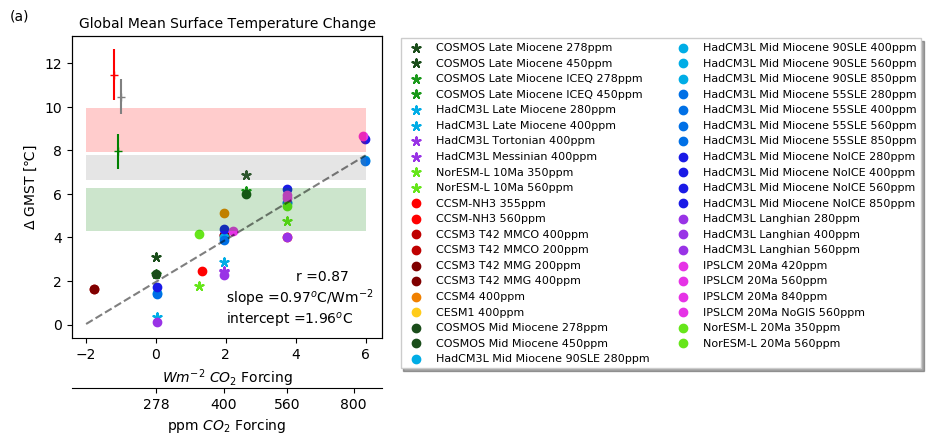

In [21]:
fig = plt.figure(figsize=(4, 4), dpi=100) #figsize(weight,height)

ax1 = plt.subplot(1,1,1)

# Add best fit climate sensitvity 
plt.plot(MIO_ALL_EXPS_CO2forcing_reg, CS_fn(MIO_ALL_EXPS_CO2forcing_reg), 'k--', alpha=0.5)

for i in range(0, len(MIO_ALL_EXPS_NAMES)):  
#for i in range(8, 20):
            if i <= 9:
                plt.scatter(MIO_ALL_EXPS_CO2forcing[i],TS_ANO_GM_MIO_ALL_EXPS[i],marker=(5, 2),color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])               
            else:
                plt.scatter(MIO_ALL_EXPS_CO2forcing[i],TS_ANO_GM_MIO_ALL_EXPS[i],color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])

                
# Add estimates
midmioallGMST=21.2139
midmiosstGMST=24.4622
midmioallGMST_1SDT=0.56455
midmiosstGMST_1SDT=0.80964

latemioallGMST=19.303
latemiosstGMST=21.9546
latemioallGMST_1SDT=0.98462
latemiosstGMST_1SDT=0.80968

mcomioallGMST=22.9262
mcomiosstGMST=25.4717
mcomioallGMST_1SDT=1.0077
mcomiosstGMST_1SDT=1.1659

# PI estimate from Hansen 
PIGMST=14

ax1.fill_between(np.arange(-2, 7, 1), midmioallGMST-midmioallGMST_1SDT-PIGMST, midmioallGMST+midmioallGMST_1SDT-PIGMST, facecolor='grey', alpha=0.2)
plt.errorbar(-1, midmiosstGMST-PIGMST, yerr=midmiosstGMST_1SDT, ls='none', color='grey')
plt.plot(-1, midmiosstGMST-PIGMST, '+', color='grey')

ax1.fill_between(np.arange(-2, 7, 1), latemioallGMST-latemioallGMST_1SDT-PIGMST, latemioallGMST+latemioallGMST_1SDT-PIGMST, facecolor='green', alpha=0.2)
plt.errorbar(-1.1, latemiosstGMST-PIGMST, yerr=latemiosstGMST_1SDT, ls='none', color='green')
plt.plot(-1.1, latemiosstGMST-PIGMST, '+', color='green')

ax1.fill_between(np.arange(-2, 7, 1), mcomioallGMST-mcomioallGMST_1SDT-PIGMST, mcomioallGMST+mcomioallGMST_1SDT-PIGMST, facecolor='red', alpha=0.2)
plt.errorbar(-1.2, mcomiosstGMST-PIGMST, yerr=mcomiosstGMST_1SDT, ls='none', color='red')
plt.plot(-1.2, mcomiosstGMST-PIGMST, '+', color='red')
                
#create a legend and set its location to under the graph
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.9,1.01), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax1.text(-0.2,1.05, "(a)", transform=ax1.transAxes)

#create a title
plt.title('Global Mean Surface Temperature Change', fontsize=10)   
plt.ylabel('$\Delta$ GMST [\u2103]')
plt.xlabel("$Wm^{-2}$ $CO_{2}$ Forcing")

#ax1 = plt.axes()
ax2 = ax1.twiny()
# Decide the ticklabel position in the new x-axis,
# then convert them to the position in the old x-axis
newlabel = [278,400,560,800] # labels of the xticklabels: the position in the new x-axis
Wm2ppm = lambda w: 5.35*np.log(w/278) #
newpos   = [Wm2ppm(w) for w in newlabel]   # position of the xticklabels in the old x-axis

ax2.set_xticks(newpos)
ax2.set_xticklabels(newlabel)

ax2.xaxis.set_ticks_position('bottom') # set the position of the second x-axis to bottom
ax2.xaxis.set_label_position('bottom') # set the position of the second x-axis to bottom
ax2.spines['bottom'].set_position(('outward', 36))
ax2.set_xlabel("ppm $CO_{2}$ Forcing")
ax2.set_xlim(ax1.get_xlim())

ax1.text(4, 2, 'r ='+ str(round(Corr_coef[0,1],2)), fontsize=10)
ax1.text(2, 1, 'slope ='+ str(round(CS_coef[0],2))+'$^{o}$C/Wm$^{-2}$', fontsize=10)
ax1.text(2, 0, 'intercept ='+ str(round(CS_coef[1],2))+'$^{o}$C', fontsize=10)

plt.savefig('MioceneALL_GlobalMeanSurfaceTemp.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('MioceneALL_GlobalMeanSurfaceTemp.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('MioceneALL_GlobalMeanSurfaceTemp.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

In [22]:
Lat_30Sto30N_index=np.where((lat>-30) & (lat<30))[0]
Lat_60Sto90S_index=np.where((lat>-90) & (lat<-60))[0]
Lat_60Nto90N_index=np.where((lat>60) & (lat<90))[0]
Lat_30Sto60S_index=np.where((lat>-60) & (lat<-30))[0]
Lat_30Nto60N_index=np.where((lat>30) & (lat<60))[0]

In [23]:
# Calculate polar amp and midlat to tropics TS diff
latr = np.deg2rad(lat)
weight = np.cos(latr)

TS_ANO_30Sto30N_MIO_ALL_EXPS=np.average(TS_ANO_ZM_MIO_ALL_EXPS[:,Lat_30Sto30N_index], axis=1, weights=weight[Lat_30Sto30N_index])
TS_ANO_60Sto90S_MIO_ALL_EXPS=np.average(TS_ANO_ZM_MIO_ALL_EXPS[:,Lat_60Sto90S_index], axis=1, weights=weight[Lat_60Sto90S_index])
TS_ANO_60Nto90N_MIO_ALL_EXPS=np.average(TS_ANO_ZM_MIO_ALL_EXPS[:,Lat_60Nto90N_index], axis=1, weights=weight[Lat_60Nto90N_index])
TS_ANO_30Sto60S_MIO_ALL_EXPS=np.average(TS_ANO_ZM_MIO_ALL_EXPS[:,Lat_30Sto60S_index], axis=1, weights=weight[Lat_30Sto60S_index])
TS_ANO_30Nto60N_MIO_ALL_EXPS=np.average(TS_ANO_ZM_MIO_ALL_EXPS[:,Lat_30Nto60N_index], axis=1, weights=weight[Lat_30Nto60N_index])

TS_ANO_60to90NS_MIO_ALL_EXPS=(TS_ANO_60Nto90N_MIO_ALL_EXPS+TS_ANO_60Sto90S_MIO_ALL_EXPS)/2
TS_ANO_30to60NS_MIO_ALL_EXPS=(TS_ANO_30Nto60N_MIO_ALL_EXPS+TS_ANO_30Sto60S_MIO_ALL_EXPS)/2

In [24]:
# Calculate polar amp and midlat to tropics TS diff

TS_30Sto30N_MIO_ALL_EXPS=np.average(TS_ZM_MIO_ALL_EXPS[:,Lat_30Sto30N_index], axis=1, weights=weight[Lat_30Sto30N_index])
TS_60Sto90S_MIO_ALL_EXPS=np.average(TS_ZM_MIO_ALL_EXPS[:,Lat_60Sto90S_index], axis=1, weights=weight[Lat_60Sto90S_index])
TS_60Nto90N_MIO_ALL_EXPS=np.average(TS_ZM_MIO_ALL_EXPS[:,Lat_60Nto90N_index], axis=1, weights=weight[Lat_60Nto90N_index])
TS_30Sto60S_MIO_ALL_EXPS=np.average(TS_ZM_MIO_ALL_EXPS[:,Lat_30Sto60S_index], axis=1, weights=weight[Lat_30Sto60S_index])
TS_30Nto60N_MIO_ALL_EXPS=np.average(TS_ZM_MIO_ALL_EXPS[:,Lat_30Nto60N_index], axis=1, weights=weight[Lat_30Nto60N_index])

TS_60to90NS_MIO_ALL_EXPS=(TS_60Nto90N_MIO_ALL_EXPS+TS_60Sto90S_MIO_ALL_EXPS)/2
TS_30to60NS_MIO_ALL_EXPS=(TS_30Nto60N_MIO_ALL_EXPS+TS_30Sto60S_MIO_ALL_EXPS)/2

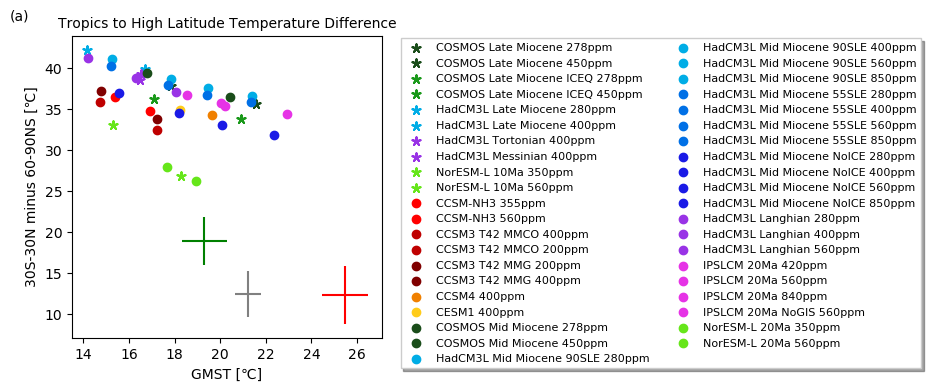

In [25]:
fig = plt.figure(figsize=(4, 4), dpi=100) #figsize(weight,height)

ax1 = plt.subplot(1,1,1)

for i in range(0, len(MIO_ALL_EXPS_NAMES)):  
#for i in range(8, 20):
            if i <= 9:
                plt.scatter(TS_GM_MIO_ALL_EXPS[i]-273.15,TS_30Sto30N_MIO_ALL_EXPS[i]-TS_60to90NS_MIO_ALL_EXPS[i],marker=(5, 2),color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])               
            else:
                plt.scatter(TS_GM_MIO_ALL_EXPS[i]-273.15,TS_30Sto30N_MIO_ALL_EXPS[i]-TS_60to90NS_MIO_ALL_EXPS[i],color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])

                
# Add estimates
mcomioall_30Sto30N=26.3329
mcomioall_30Sto30N_1SDT=1.5847
mcomioall_30to60NS=21.5597
mcomioall_30to60NS_1SDT=0.92597
mcomioall_60to90NS=14.0367
mcomioall_60to90NS_1SDT=1.9616

midmioall_30Sto30N=24.6045
midmioall_30Sto30N_1SDT=0.83749
midmioall_30to60NS=19.8564
midmioall_30to60NS_1SDT=0.5811
midmioall_60to90NS=12.1809
midmioall_60to90NS_1SDT=1.9451

latemioall_30Sto30N=24.5567
latemioall_30Sto30N_1SDT=0.7921
latemioall_30to60NS=17.185
latemioall_30to60NS_1SDT=1.124
latemioall_60to90NS=5.6282
latemioall_60to90NS_1SDT=2.1409

midmioallGMST=21.2139
midmiosstGMST=24.4622
midmioallGMST_1SDT=0.56455
midmiosstGMST_1SDT=0.80964

latemioallGMST=19.303
latemiosstGMST=21.9546
latemioallGMST_1SDT=0.98462
latemiosstGMST_1SDT=0.80968

mcomioallGMST=22.9262
mcomiosstGMST=25.4717
mcomioallGMST_1SDT=1.0077
mcomiosstGMST_1SDT=1.1659

# PI estimate from Hansen 
PIGMST=14

y_err=midmioall_30Sto30N_1SDT+midmioall_60to90NS_1SDT
plt.errorbar(midmioallGMST, midmioall_30Sto30N-midmioall_60to90NS, xerr=midmioallGMST_1SDT, yerr=y_err, ls='none', color='grey')

y_err=latemioall_30Sto30N_1SDT+latemioall_60to90NS_1SDT
plt.errorbar(latemioallGMST, latemioall_30Sto30N-latemioall_60to90NS, xerr=latemioallGMST_1SDT, yerr=y_err, ls='none', color='green')

y_err=mcomioall_30Sto30N_1SDT+mcomioall_60to90NS_1SDT
plt.errorbar(mcomiosstGMST, mcomioall_30Sto30N-mcomioall_60to90NS, xerr=mcomioallGMST_1SDT, yerr=y_err, ls='none', color='red')
    
#create a legend and set its location to under the graph
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.9,1.01), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax1.text(-0.2,1.05, "(a)", transform=ax1.transAxes)

#create a title
plt.title('Tropics to High Latitude Temperature Difference', fontsize=10)   

plt.xlabel('GMST [\u2103]')
plt.ylabel('30S-30N minus 60-90NS [\u2103]')

plt.savefig('MioceneALL_PolarAmp.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('MioceneALL_PolarAmp.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('MioceneALL_PolarAmp.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

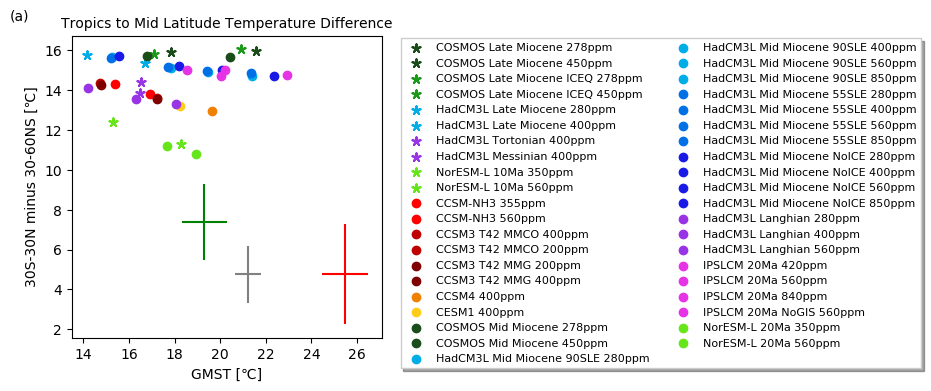

In [26]:
fig = plt.figure(figsize=(4, 4), dpi=100) #figsize(weight,height)

ax1 = plt.subplot(1,1,1)

for i in range(0, len(MIO_ALL_EXPS_NAMES)):  
#for i in range(8, 20):
            if i <= 9:
                plt.scatter(TS_GM_MIO_ALL_EXPS[i]-273.15,TS_30Sto30N_MIO_ALL_EXPS[i]-TS_30to60NS_MIO_ALL_EXPS[i],marker=(5, 2),color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])               
            else:
                plt.scatter(TS_GM_MIO_ALL_EXPS[i]-273.15,TS_30Sto30N_MIO_ALL_EXPS[i]-TS_30to60NS_MIO_ALL_EXPS[i],color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])

                
# Add estimates
mcomioall_30Sto30N=26.3329
mcomioall_30Sto30N_1SDT=1.5847
mcomioall_30to60NS=21.5597
mcomioall_30to60NS_1SDT=0.92597
mcomioall_60to90NS=14.0367
mcomioall_60to90NS_1SDT=1.9616

midmioall_30Sto30N=24.6045
midmioall_30Sto30N_1SDT=0.83749
midmioall_30to60NS=19.8564
midmioall_30to60NS_1SDT=0.5811
midmioall_60to90NS=12.1809
midmioall_60to90NS_1SDT=1.9451

latemioall_30Sto30N=24.5567
latemioall_30Sto30N_1SDT=0.7921
latemioall_30to60NS=17.185
latemioall_30to60NS_1SDT=1.124
latemioall_60to90NS=5.6282
latemioall_60to90NS_1SDT=2.1409

midmioallGMST=21.2139
midmiosstGMST=24.4622
midmioallGMST_1SDT=0.56455
midmiosstGMST_1SDT=0.80964

latemioallGMST=19.303
latemiosstGMST=21.9546
latemioallGMST_1SDT=0.98462
latemiosstGMST_1SDT=0.80968

mcomioallGMST=22.9262
mcomiosstGMST=25.4717
mcomioallGMST_1SDT=1.0077
mcomiosstGMST_1SDT=1.1659

# PI estimate from Hansen 
PIGMST=14

y_err=midmioall_30Sto30N_1SDT+midmioall_30to60NS_1SDT
plt.errorbar(midmioallGMST, midmioall_30Sto30N-midmioall_30to60NS, xerr=midmioallGMST_1SDT, yerr=y_err, ls='none', color='grey')

y_err=latemioall_30Sto30N_1SDT+latemioall_30to60NS_1SDT
plt.errorbar(latemioallGMST, latemioall_30Sto30N-latemioall_30to60NS, xerr=latemioallGMST_1SDT, yerr=y_err, ls='none', color='green')

y_err=mcomioall_30Sto30N_1SDT+mcomioall_30to60NS_1SDT
plt.errorbar(mcomiosstGMST, mcomioall_30Sto30N-mcomioall_30to60NS, xerr=mcomioallGMST_1SDT, yerr=y_err, ls='none', color='red')
    
#create a legend and set its location to under the graph
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.9,1.01), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax1.text(-0.2,1.05, "(a)", transform=ax1.transAxes)

#create a title
plt.title('Tropics to Mid Latitude Temperature Difference', fontsize=10)   
plt.xlabel('GMST [\u2103]')
plt.ylabel('30S-30N minus 30-60NS [\u2103]')

plt.savefig('MioceneALL_MidlatAmp.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('MioceneALL_MidlatAmp.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('MioceneALL_MidlatAmp.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

In [27]:
ppm280Index=np.asarray(np.where( MIO_ALL_EXPS_CO2ppm < 300 ))
ppm400Index=np.asarray(np.where((MIO_ALL_EXPS_CO2ppm>300) & (MIO_ALL_EXPS_CO2ppm<500)))
ppm560Index=np.asarray(np.where(MIO_ALL_EXPS_CO2ppm==560))
ppm850Index=np.asarray(np.where(MIO_ALL_EXPS_CO2ppm>560))

In [28]:
LATE_MIO_EXPS_NAMES=MIO_ALL_EXPS_NAMES[0:10]
MID_MIO_EXPS_NAMES=MIO_ALL_EXPS_NAMES[11:41]
TS_ANO_LATE_MIO_EXPS=TS_ANO_MIO_ALL_EXPS[0:10,:,:]
TS_ANO_MID_MIO_EXPS=TS_ANO_MIO_ALL_EXPS[11:41,:,:]

2D Surface Temperature Plots

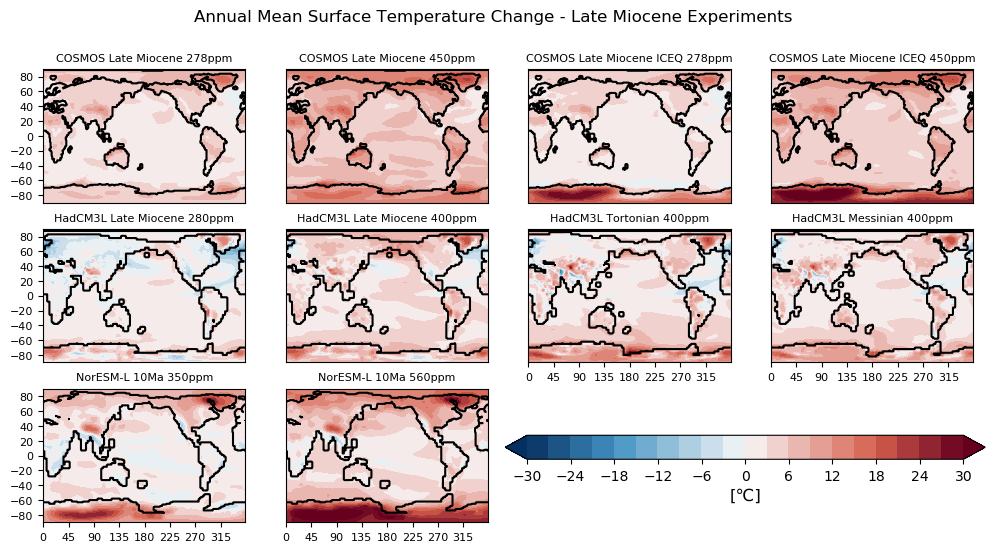

In [29]:
ncols = 4
nrows = 3

# set contour levels
contour_levels = np.linspace(-30,30,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

fig = plt.figure(figsize=(12, 6), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)


for i in range(0, len(LATE_MIO_EXPS_NAMES)):
    # iterate over all of the Late Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            cf = plt.contourf(TS_ANO_LATE_MIO_EXPS.lon,TS_ANO_LATE_MIO_EXPS.lat,TS_ANO_LATE_MIO_EXPS[i,:,:], contour_levels, cmap=my_colormap, extend="both")
            ax.set_title(LATE_MIO_EXPS_NAMES[i], fontsize=8)
            
            if i == 9 or i == 6 or i == 7:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i == 0 or i== 4:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 8:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            LATEMIO_coast=landmask_LATE_MIO_EXPS[i,:,:]*1
            #ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(TS_ANO_LATE_MIO_EXPS.lon,TS_ANO_LATE_MIO_EXPS.lat,LATEMIO_coast, levels=[0], colors='k', linestyles='-')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.51, 0.23, 0.4, 0.04])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature Change - Late Miocene Experiments')

   
plt.savefig('LateMiocene_SurfaceTemp.pdf', format='pdf')    
plt.savefig('LateMiocene_SurfaceTemp.eps', format='eps')
plt.savefig('LateMiocene_SurfaceTemp.png', format='png')    

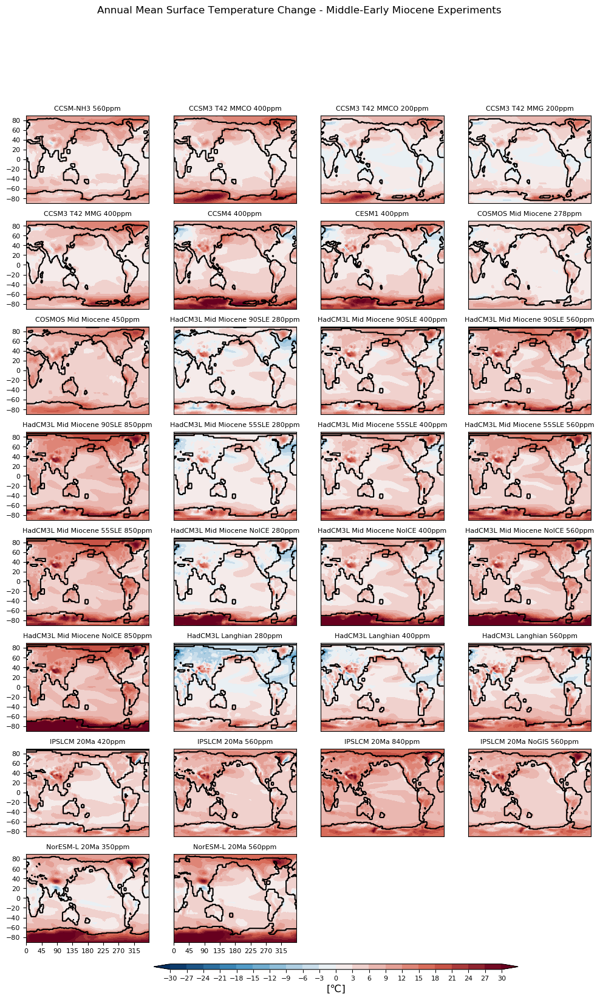

In [30]:
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-30,30,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)


# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MID_MIO_EXPS[i,:,:], contour_levels, cmap=my_colormap, extend="both")
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            #ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,MIDMIO_coast, levels=[0], colors='k', linestyles='-')          
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)

# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature Change - Middle-Early Miocene Experiments')
   
plt.savefig('MidMiocene_SurfaceTemp.pdf', format='pdf')    
plt.savefig('MidMiocene_SurfaceTemp.eps', format='eps')
plt.savefig('MidMiocene_SurfaceTemp.png', format='png')    

Separate experiments by CO2 concentrations

In [31]:
#Read in updated Herold boundary conditions
filename='miocene_topo_pollard_antscape_dolan_0.5x0.5.nc'
Herold_updated=xr.open_dataset(filename,decode_times=False)

In [32]:
ppm278_index = np.where(MIO_ALL_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
TS_ANO_MIO_ALL_EXPS_278=TS_ANO_MIO_ALL_EXPS[ppm278_indexls[0,:],:,:]

ppm280_index = np.where(MIO_ALL_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
TS_ANO_MIO_ALL_EXPS_280=TS_ANO_MIO_ALL_EXPS[ppm280_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_280

TS_ANO_MIO_ALL_EXPS_278and280 = xr.concat((TS_ANO_MIO_ALL_EXPS_278, TS_ANO_MIO_ALL_EXPS_280),  dim='exp')
TS_ANO_MIO_ALL_EXPS_278and280_MEAN = np.mean(TS_ANO_MIO_ALL_EXPS_278and280, axis=0)
TS_ANO_MIO_ALL_EXPS_278and280_STD = np.std(TS_ANO_MIO_ALL_EXPS_278and280, axis=0)

ppm350_index = np.where(MIO_ALL_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
TS_ANO_MIO_ALL_EXPS_350=TS_ANO_MIO_ALL_EXPS[ppm350_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_350

ppm400_index = np.where(MIO_ALL_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
TS_ANO_MIO_ALL_EXPS_400=TS_ANO_MIO_ALL_EXPS[ppm400_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_400

ppm450_index = np.where(MIO_ALL_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
TS_ANO_MIO_ALL_EXPS_450=TS_ANO_MIO_ALL_EXPS[ppm450_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_450

TS_ANO_MIO_ALL_EXPS_350to450 = xr.concat((TS_ANO_MIO_ALL_EXPS_350, TS_ANO_MIO_ALL_EXPS_400, TS_ANO_MIO_ALL_EXPS_450),  dim='exp')
TS_ANO_MIO_ALL_EXPS_350to450_MEAN = np.mean(TS_ANO_MIO_ALL_EXPS_350to450, axis=0)
TS_ANO_MIO_ALL_EXPS_350to450_STD = np.std(TS_ANO_MIO_ALL_EXPS_350to450, axis=0)
                                           
ppm560_index = np.where(MIO_ALL_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
TS_ANO_MIO_ALL_EXPS_560=TS_ANO_MIO_ALL_EXPS[ppm560_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_560

TS_ANO_MIO_ALL_EXPS_560_MEAN = np.mean(TS_ANO_MIO_ALL_EXPS_560, axis=0)
TS_ANO_MIO_ALL_EXPS_560_STD = np.std(TS_ANO_MIO_ALL_EXPS_560, axis=0)

ppm840_index = np.where(MIO_ALL_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
TS_ANO_MIO_ALL_EXPS_840=TS_ANO_MIO_ALL_EXPS[ppm840_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_840

ppm850_index = np.where(MIO_ALL_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
TS_ANO_MIO_ALL_EXPS_850=TS_ANO_MIO_ALL_EXPS[ppm850_indexls[0,:],:,:]
TS_ANO_MIO_ALL_EXPS_850

TS_ANO_MIO_ALL_EXPS_840and850 = xr.concat((TS_ANO_MIO_ALL_EXPS_840, TS_ANO_MIO_ALL_EXPS_850),  dim='exp')
TS_ANO_MIO_ALL_EXPS_840and850_MEAN = np.mean(TS_ANO_MIO_ALL_EXPS_840and850, axis=0)
TS_ANO_MIO_ALL_EXPS_840and850_STD = np.std(TS_ANO_MIO_ALL_EXPS_840and850, axis=0)

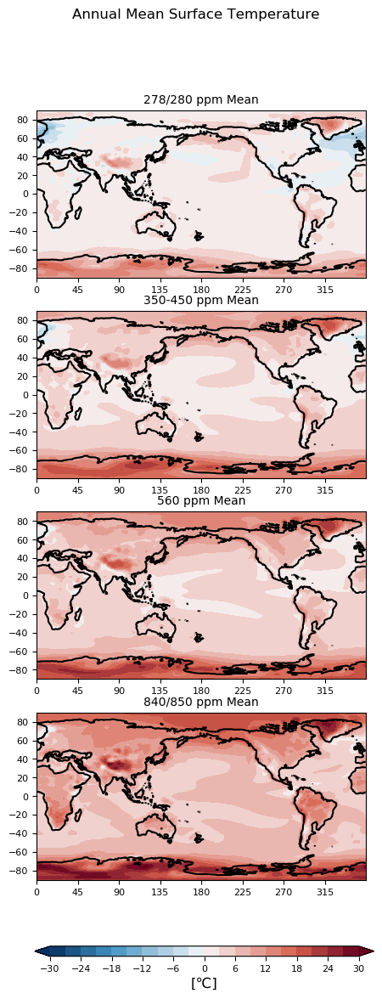

In [33]:
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-30,30,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_278and280_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
            elif i == 1:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_350to450_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            elif i == 2:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_560_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)  
            elif i == 3:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_840and850_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)     
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)

# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')
   
plt.savefig('MioceneALL_ByCO2_SurfaceTemp.pdf', format='pdf')    
plt.savefig('MioceneALL_ByCO2_SurfaceTemp.eps', format='eps')
plt.savefig('MioceneALL_ByCO2_SurfaceTemp.png', format='png')    

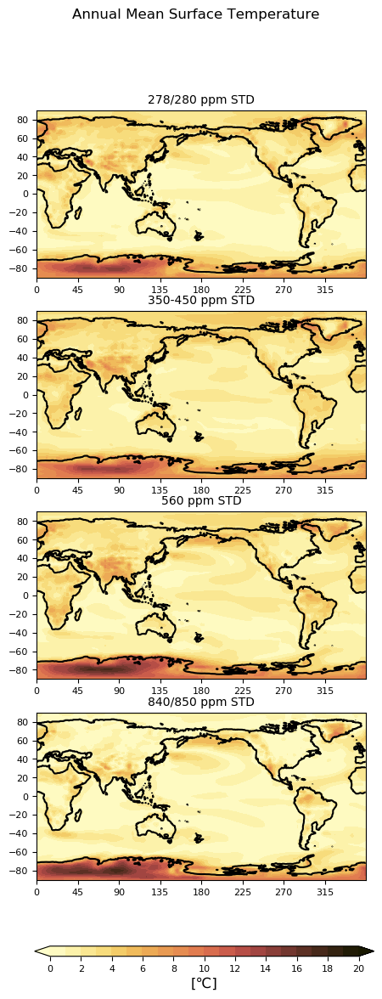

In [34]:
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(0,20,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_seq_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_278and280_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('278/280 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
            elif i == 1:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_350to450_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('350-450 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            elif i == 2:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_560_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('560 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)  
            elif i == 3:
                cf = plt.contourf(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,TS_ANO_MIO_ALL_EXPS_840and850_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('840/850 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)     
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)

# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')

   
plt.savefig('MioceneALL_ByCO2STD_SurfaceTemp.pdf', format='pdf')    
plt.savefig('MioceneALL_ByCO2STD_SurfaceTemp.eps', format='eps')
plt.savefig('MioceneALL_ByCO2STD_SurfaceTemp.png', format='png')    

2D SST Plots

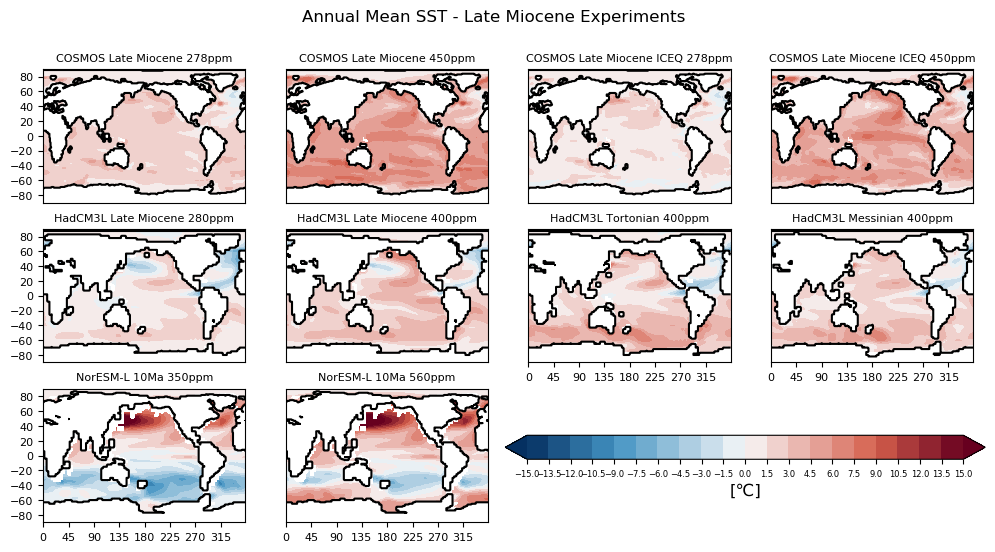

In [35]:
ncols = 4
nrows = 3

# set contour levels
contour_levels = np.linspace(-15,15,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)


# create the plots
fig = plt.figure(figsize=(12, 6), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, len(LATE_MIO_EXPS_NAMES)):
    # iterate over all of the Late Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            cf = plt.contourf(lon,lat,SST_ANO_LATE_MIO_EXPS[i,:,:], contour_levels, cmap=my_colormap, extend="both")
            ax.set_title(LATE_MIO_EXPS_NAMES[i], fontsize=8)
            if i == 9 or i == 6 or i == 7:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i == 0 or i== 4:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 8:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            LATEMIO_coast=landmask_LATE_MIO_EXPS[i,:,:]*1
            #ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(TS_ANO_LATE_MIO_EXPS.lon,TS_ANO_LATE_MIO_EXPS.lat,LATEMIO_coast, levels=[0], colors='k', linestyles='-')
            
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.51, 0.23, 0.4, 0.04])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST - Late Miocene Experiments')
   
plt.savefig('LateMiocene_SST.pdf', format='pdf')    
plt.savefig('LateMiocene_SST.eps', format='eps')
plt.savefig('LateMiocene_SST.png', format='png')    

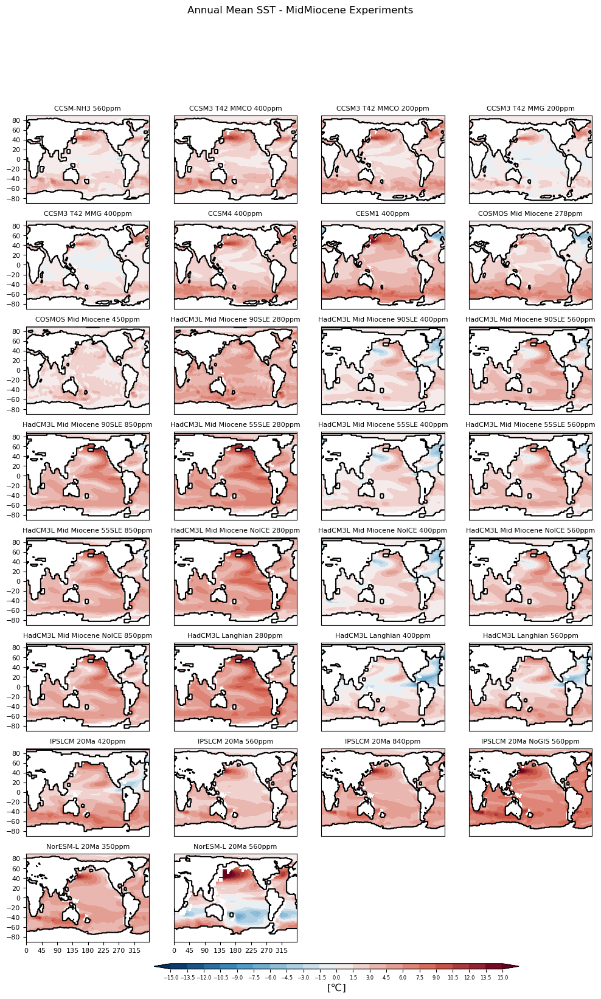

In [36]:
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-15,15,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)


# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            cf = plt.contourf(lon,lat,SST_ANO_MID_MIO_EXPS[i,:,:], contour_levels, cmap=my_colormap, extend="both")
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            #ax.contour(Frigola_MMCO.topo.lon,Frigola_MMCO.topo.lat,Frigola_MMCO.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,MIDMIO_coast, levels=[0], colors='k', linestyles='-')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST - MidMiocene Experiments')
   
plt.savefig('MidMiocene_SST.pdf', format='pdf')    
plt.savefig('MidMiocene_SST.eps', format='eps')
plt.savefig('MidMiocene_SST.png', format='png')    

Separate experiments by CO2 concentrations

In [37]:
ppm278_index = np.where(MIO_ALL_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
SST_ANO_MIO_ALL_EXPS_278=SST_ANO_MIO_ALL_EXPS[ppm278_indexls[0,:],:,:]

ppm280_index = np.where(MIO_ALL_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
SST_ANO_MIO_ALL_EXPS_280=SST_ANO_MIO_ALL_EXPS[ppm280_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_280

SST_ANO_MIO_ALL_EXPS_278and280 = np.concatenate((SST_ANO_MIO_ALL_EXPS_278, SST_ANO_MIO_ALL_EXPS_280),  axis=0)
SST_ANO_MIO_ALL_EXPS_278and280_MEAN = np.mean(SST_ANO_MIO_ALL_EXPS_278and280, axis=0)
SST_ANO_MIO_ALL_EXPS_278and280_STD = np.std(SST_ANO_MIO_ALL_EXPS_278and280, axis=0)

ppm350_index = np.where(MIO_ALL_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
SST_ANO_MIO_ALL_EXPS_350=SST_ANO_MIO_ALL_EXPS[ppm350_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_350

ppm400_index = np.where(MIO_ALL_EXPS_CO2ppm[0:27] == 400)
ppm400_indexls = np.array(ppm400_index)
SST_ANO_MIO_ALL_EXPS_400=SST_ANO_MIO_ALL_EXPS[ppm400_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_400

ppm450_index = np.where(MIO_ALL_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
SST_ANO_MIO_ALL_EXPS_450=SST_ANO_MIO_ALL_EXPS[ppm450_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_450

SST_ANO_MIO_ALL_EXPS_350to450 = np.concatenate((SST_ANO_MIO_ALL_EXPS_350, SST_ANO_MIO_ALL_EXPS_400, SST_ANO_MIO_ALL_EXPS_450),  axis=0)
SST_ANO_MIO_ALL_EXPS_350to450_MEAN = np.mean(SST_ANO_MIO_ALL_EXPS_350to450, axis=0)
SST_ANO_MIO_ALL_EXPS_350to450_STD = np.std(SST_ANO_MIO_ALL_EXPS_350to450, axis=0)
                                           
ppm560_index = np.where(MIO_ALL_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
SST_ANO_MIO_ALL_EXPS_560=SST_ANO_MIO_ALL_EXPS[ppm560_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_560

SST_ANO_MIO_ALL_EXPS_560_MEAN = np.mean(SST_ANO_MIO_ALL_EXPS_560, axis=0)
SST_ANO_MIO_ALL_EXPS_560_STD = np.std(SST_ANO_MIO_ALL_EXPS_560, axis=0)

ppm840_index = np.where(MIO_ALL_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
SST_ANO_MIO_ALL_EXPS_840=SST_ANO_MIO_ALL_EXPS[ppm840_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_840

ppm850_index = np.where(MIO_ALL_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
SST_ANO_MIO_ALL_EXPS_850=SST_ANO_MIO_ALL_EXPS[ppm850_indexls[0,:],:,:]
SST_ANO_MIO_ALL_EXPS_850

SST_ANO_MIO_ALL_EXPS_840and850 = np.concatenate((SST_ANO_MIO_ALL_EXPS_840, SST_ANO_MIO_ALL_EXPS_850),  axis=0)
SST_ANO_MIO_ALL_EXPS_840and850_MEAN = np.mean(SST_ANO_MIO_ALL_EXPS_840and850, axis=0)
SST_ANO_MIO_ALL_EXPS_840and850_STD = np.std(SST_ANO_MIO_ALL_EXPS_840and850, axis=0)

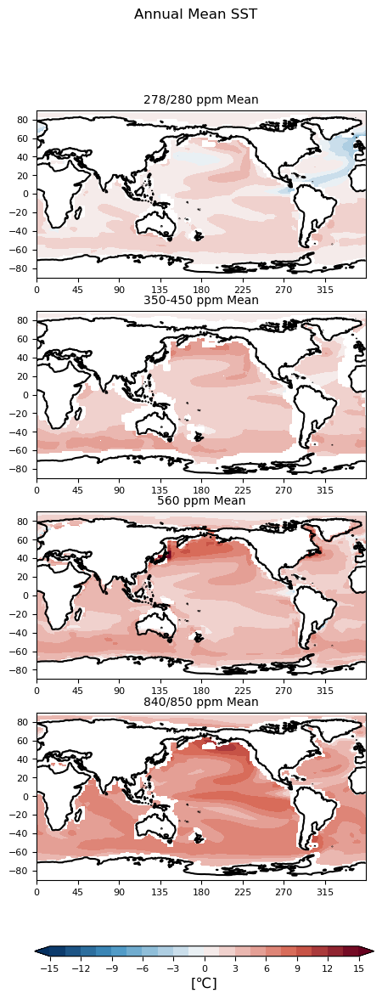

In [38]:
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-15,15,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_278and280_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
            elif i == 1:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_350to450_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            elif i == 2:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_560_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)  
            elif i == 3:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_840and850_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)     
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
#colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.locator = matplotlib.ticker.MaxNLocator(11)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST')

   
plt.savefig('MioceneALL_ByCO2_SST.pdf', format='pdf')    
plt.savefig('MioceneALL_ByCO2_SST.eps', format='eps')
plt.savefig('MioceneALL_ByCO2_SST.png', format='png')    

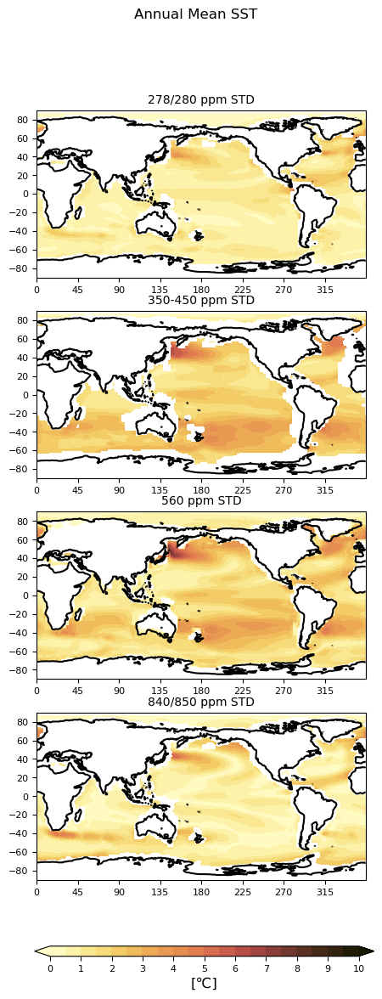

In [39]:
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(0,10,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_seq_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_278and280_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('278/280 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
            elif i == 1:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_350to450_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('350-450 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            elif i == 2:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_560_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('560 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)  
            elif i == 3:
                cf = plt.contourf(lon,lat,SST_ANO_MIO_ALL_EXPS_840and850_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('840/850 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)     
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
#colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.locator = matplotlib.ticker.MaxNLocator(11)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST')
   
plt.savefig('MioceneALL_ByCO2STD_SST.pdf', format='pdf')    
plt.savefig('MioceneALL_ByCO2STD_SST.eps', format='eps')
plt.savefig('MioceneALL_ByCO2STD_SST.png', format='png')    

2D Albedo Plots

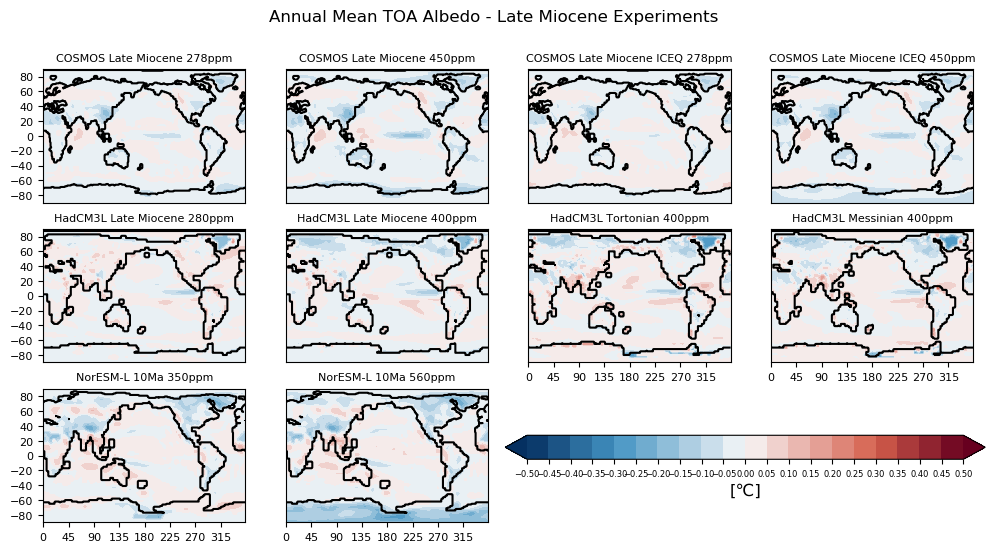

In [40]:
ncols = 4
nrows = 3

# set contour levels
contour_levels = np.linspace(-0.5,0.5,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)


# create the plots
fig = plt.figure(figsize=(12, 6), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, len(LATE_MIO_EXPS_NAMES)):
    # iterate over all of the Late Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            cf = plt.contourf(lon,lat,TOAalbedo_ANO_LATE_MIO_EXPS[i,:,:], contour_levels, cmap=my_colormap, extend="both")
            ax.set_title(LATE_MIO_EXPS_NAMES[i], fontsize=8)
            if i == 9 or i == 6 or i == 7:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i == 0 or i== 4:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 8:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            LATEMIO_coast=landmask_LATE_MIO_EXPS[i,:,:]*1
            #ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(TS_ANO_LATE_MIO_EXPS.lon,TS_ANO_LATE_MIO_EXPS.lat,LATEMIO_coast, levels=[0], colors='k', linestyles='-')
            
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.51, 0.23, 0.4, 0.04])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean TOA Albedo - Late Miocene Experiments')

# plt.tight_layout()
#plt.show()
   
plt.savefig('LateMiocene_TOAalbedo.pdf', format='pdf')    
plt.savefig('LateMiocene_TOAalbedo.eps', format='eps')
plt.savefig('LateMiocene_TOAalbedo.png', format='png')    

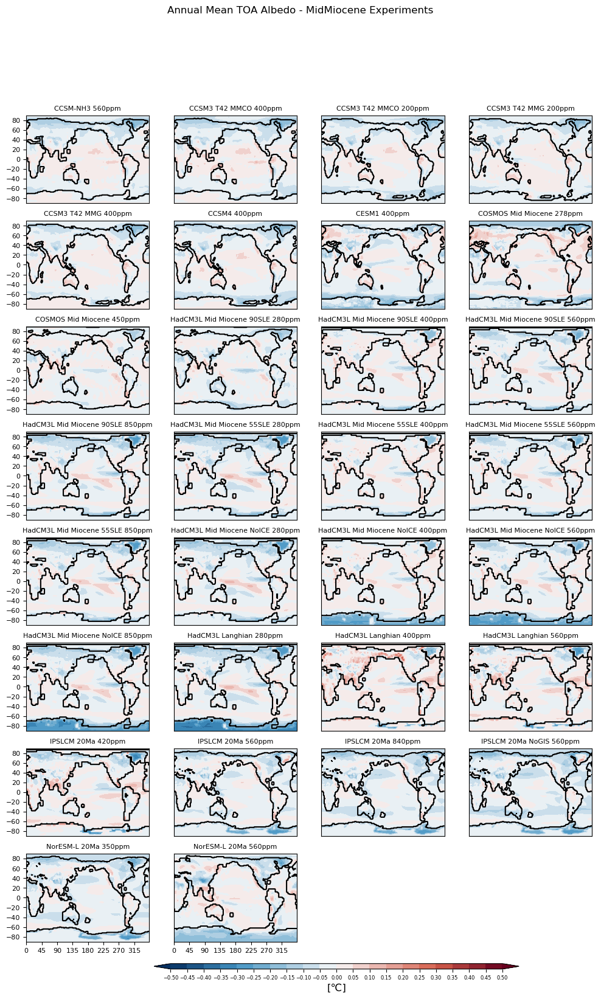

In [41]:
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-0.5,0.5,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            cf = plt.contourf(lon,lat,TOAalbedo_ANO_MID_MIO_EXPS[i,:,:], contour_levels, cmap=my_colormap, extend="both")
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)           
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            #ax.contour(Frigola_MMCO.topo.lon,Frigola_MMCO.topo.lat,Frigola_MMCO.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(TS_ANO_MID_MIO_EXPS.lon,TS_ANO_MID_MIO_EXPS.lat,MIDMIO_coast, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean TOA Albedo - MidMiocene Experiments')

plt.savefig('MidMiocene_TOAalbedo.pdf', format='pdf')    
plt.savefig('MidMiocene_TOAalbedo.eps', format='eps')
plt.savefig('MidMiocene_TOAalbedo.png', format='png')    

Separate experiments by CO2 concentrations

In [42]:
ppm278_index = np.where(MIO_ALL_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
TOAalbedo_ANO_MIO_ALL_EXPS_278=TOAalbedo_ANO_MIO_ALL_EXPS[ppm278_indexls[0,:],:,:]

ppm280_index = np.where(MIO_ALL_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
TOAalbedo_ANO_MIO_ALL_EXPS_280=TOAalbedo_ANO_MIO_ALL_EXPS[ppm280_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_280

TOAalbedo_ANO_MIO_ALL_EXPS_278and280 = np.concatenate((TOAalbedo_ANO_MIO_ALL_EXPS_278, TOAalbedo_ANO_MIO_ALL_EXPS_280),  axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_278and280_MEAN = np.mean(TOAalbedo_ANO_MIO_ALL_EXPS_278and280, axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_278and280_STD = np.std(TOAalbedo_ANO_MIO_ALL_EXPS_278and280, axis=0)

ppm350_index = np.where(MIO_ALL_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
TOAalbedo_ANO_MIO_ALL_EXPS_350=TOAalbedo_ANO_MIO_ALL_EXPS[ppm350_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_350

ppm400_index = np.where(MIO_ALL_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
TOAalbedo_ANO_MIO_ALL_EXPS_400=TOAalbedo_ANO_MIO_ALL_EXPS[ppm400_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_400

ppm450_index = np.where(MIO_ALL_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
TOAalbedo_ANO_MIO_ALL_EXPS_450=TOAalbedo_ANO_MIO_ALL_EXPS[ppm450_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_450

TOAalbedo_ANO_MIO_ALL_EXPS_350to450 = np.concatenate((TOAalbedo_ANO_MIO_ALL_EXPS_350, TOAalbedo_ANO_MIO_ALL_EXPS_400, TOAalbedo_ANO_MIO_ALL_EXPS_450),  axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_350to450_MEAN = np.mean(TOAalbedo_ANO_MIO_ALL_EXPS_350to450, axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_350to450_STD = np.std(TOAalbedo_ANO_MIO_ALL_EXPS_350to450, axis=0)
                                           
ppm560_index = np.where(MIO_ALL_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
TOAalbedo_ANO_MIO_ALL_EXPS_560=TOAalbedo_ANO_MIO_ALL_EXPS[ppm560_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_560

TOAalbedo_ANO_MIO_ALL_EXPS_560_MEAN = np.mean(TOAalbedo_ANO_MIO_ALL_EXPS_560, axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_560_STD = np.std(TOAalbedo_ANO_MIO_ALL_EXPS_560, axis=0)

ppm840_index = np.where(MIO_ALL_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
TOAalbedo_ANO_MIO_ALL_EXPS_840=TOAalbedo_ANO_MIO_ALL_EXPS[ppm840_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_840

ppm850_index = np.where(MIO_ALL_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
TOAalbedo_ANO_MIO_ALL_EXPS_850=TOAalbedo_ANO_MIO_ALL_EXPS[ppm850_indexls[0,:],:,:]
TOAalbedo_ANO_MIO_ALL_EXPS_850

TOAalbedo_ANO_MIO_ALL_EXPS_840and850 = np.concatenate((TOAalbedo_ANO_MIO_ALL_EXPS_840, TOAalbedo_ANO_MIO_ALL_EXPS_850),  axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_840and850_MEAN = np.mean(TOAalbedo_ANO_MIO_ALL_EXPS_840and850, axis=0)
TOAalbedo_ANO_MIO_ALL_EXPS_840and850_STD = np.std(TOAalbedo_ANO_MIO_ALL_EXPS_840and850, axis=0)

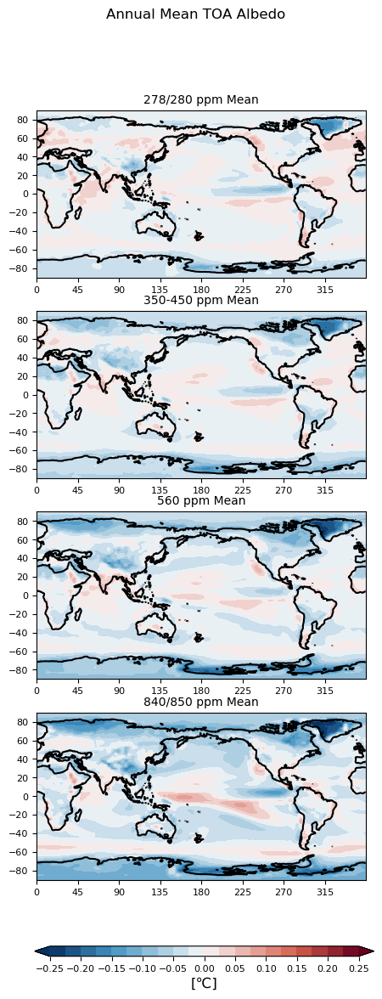

In [43]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-0.25,0.25,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_278and280_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
            elif i == 1:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_350to450_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            elif i == 2:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_560_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)  
            elif i == 3:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_840and850_MEAN, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)     
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(11)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean TOA Albedo')

   
plt.savefig('MioceneALL_ByCO2_TOAalbedo.pdf', format='pdf')    
plt.savefig('MioceneALL_ByCO2_TOAalbedo.eps', format='eps')
plt.savefig('MioceneALL_ByCO2_TOAalbedo.png', format='png')    

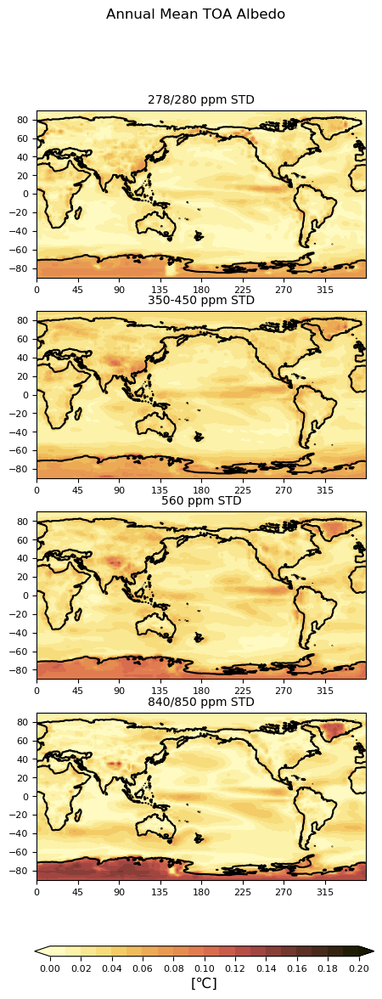

In [44]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(0,0.2,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_seq_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_278and280_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('278/280 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
            elif i == 1:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_350to450_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('350-450 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            elif i == 2:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_560_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('560 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)  
            elif i == 3:
                cf = plt.contourf(lon,lat,TOAalbedo_ANO_MIO_ALL_EXPS_840and850_STD, contour_levels, cmap=my_colormap, extend="both")
                ax.set_title('840/850 ppm STD', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)     
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks

#colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.locator = matplotlib.ticker.MaxNLocator(11)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean TOA Albedo')


plt.savefig('MioceneALL_ByCO2STD_TOAalbedo.pdf', format='pdf')    
plt.savefig('MioceneALL_ByCO2STD_TOAalbedo.eps', format='eps')
plt.savefig('MioceneALL_ByCO2STD_TOAalbedo.png', format='png')    

EMB plots

In [45]:
# exclude Farnsworth runs with no clear sky and therefore EBM
LATE_MIO_EXPS_CO2ppm[6:8]=0

In [46]:
ppm280Index_latemio=np.asarray(np.where((LATE_MIO_EXPS_CO2ppm>150) & (LATE_MIO_EXPS_CO2ppm<300)))
ppm400Index_latemio=np.asarray(np.where((LATE_MIO_EXPS_CO2ppm>300) & (LATE_MIO_EXPS_CO2ppm<500)))
ppm560Index_latemio=np.asarray(np.where(LATE_MIO_EXPS_CO2ppm==560))
ppm850Index_latemio=np.asarray(np.where(LATE_MIO_EXPS_CO2ppm>560))

<Figure size 600x1200 with 0 Axes>

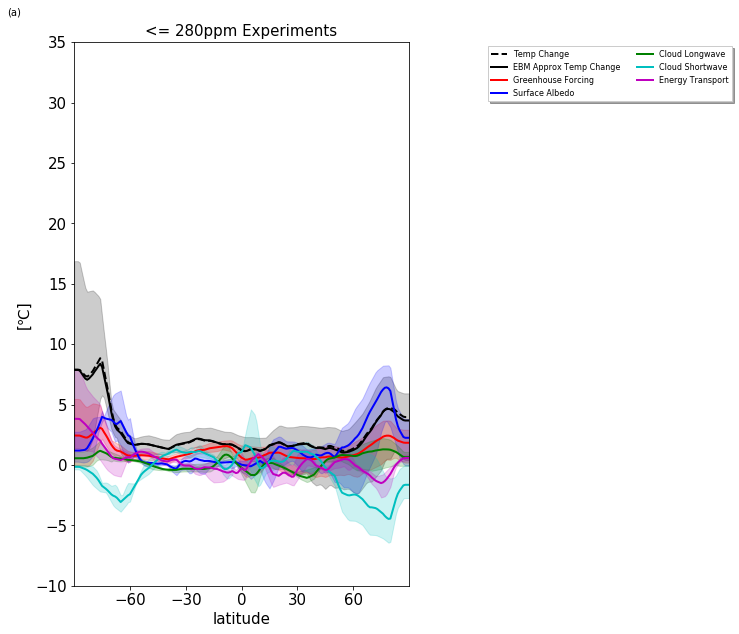

In [47]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_gg_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_salb_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_lwc_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_swc_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_tran_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_LATE_MIO_EXPS[ppm280Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('<= 280ppm Experiments', fontsize=15)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('280ppm_LateMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('280ppm_LateMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('280ppm_LateMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

<Figure size 600x1200 with 0 Axes>

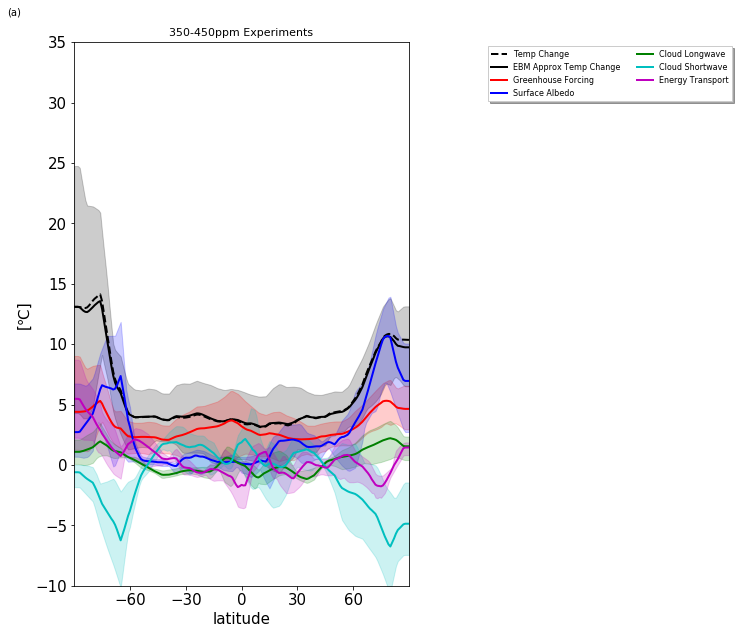

In [48]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_gg_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_salb_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_lwc_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_swc_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_tran_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_LATE_MIO_EXPS[ppm400Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('350-450ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('400ppm_LateMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('400ppm_LateMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('400ppm_LateMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

<Figure size 600x1200 with 0 Axes>

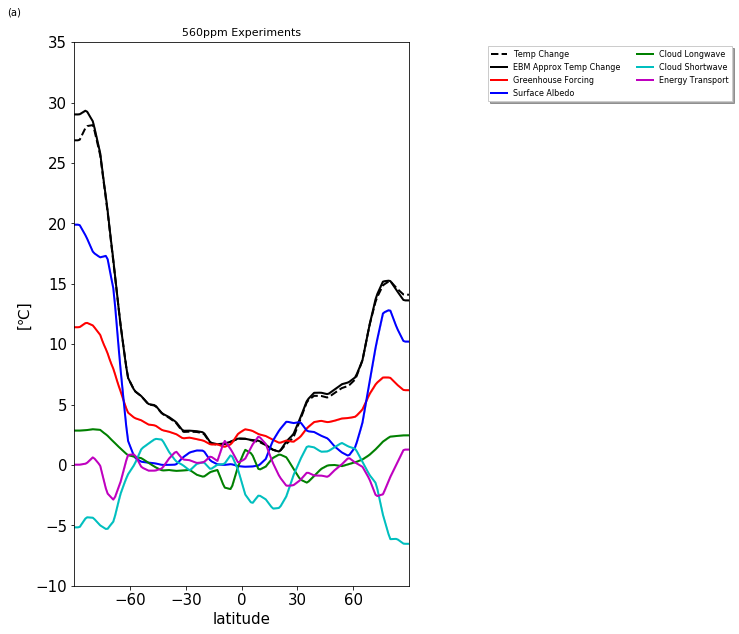

In [49]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_gg_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_salb_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_lwc_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_swc_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), np.nanmax(deltaT_tran_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_LATE_MIO_EXPS[ppm560Index_latemio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('560ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('560ppm_LateMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('560ppm_LateMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('560ppm_LateMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

In [50]:
# exclude Farnsworth runs with no clear sky and therefore EBM
MID_MIO_EXPS_CO2ppm[22:25]=0

In [51]:
ppm280Index_midmio=np.asarray(np.where((MID_MIO_EXPS_CO2ppm>150) & (MID_MIO_EXPS_CO2ppm<300)))

ppm400Index_midmio=np.asarray(np.where((MID_MIO_EXPS_CO2ppm>300) & (MID_MIO_EXPS_CO2ppm<500)))
ppm560Index_midmio=np.asarray(np.where(MID_MIO_EXPS_CO2ppm==560))
ppm850Index_midmio=np.asarray(np.where(MID_MIO_EXPS_CO2ppm>560))

<Figure size 600x1200 with 0 Axes>

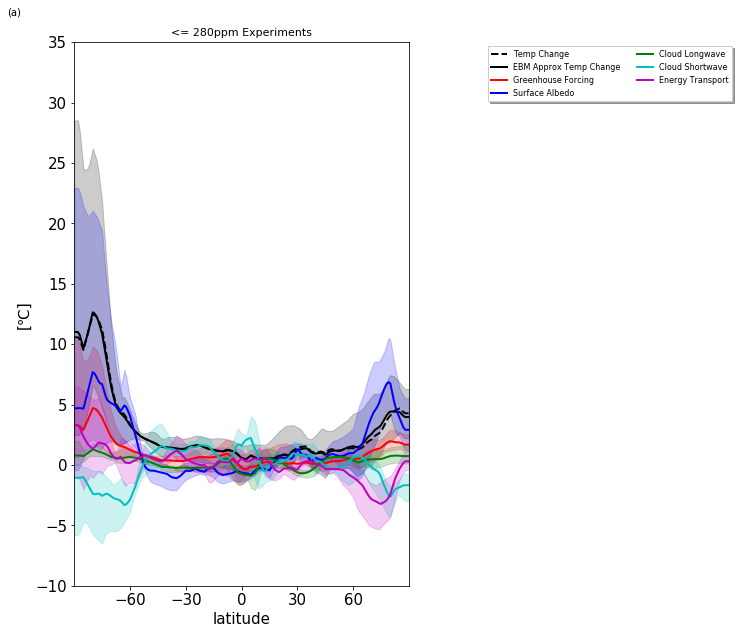

In [52]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_gg_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_salb_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_lwc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_swc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_tran_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

#plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm280Index_midmio[0,:],:]+deltaT_salb_MID_MIO_EXPS[ppm280Index_midmio[0,:],:]+deltaT_tran_MID_MIO_EXPS[ppm280Index_midmio[0,:],:]+deltaT_lwc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:]+deltaT_swc_MID_MIO_EXPS[ppm280Index_midmio[0,:],:], axis=0),linestyle='-',color='y',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('<= 280ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('280ppm_MIDMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('280ppm_MIDMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('280ppm_MIDMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

<Figure size 600x1200 with 0 Axes>

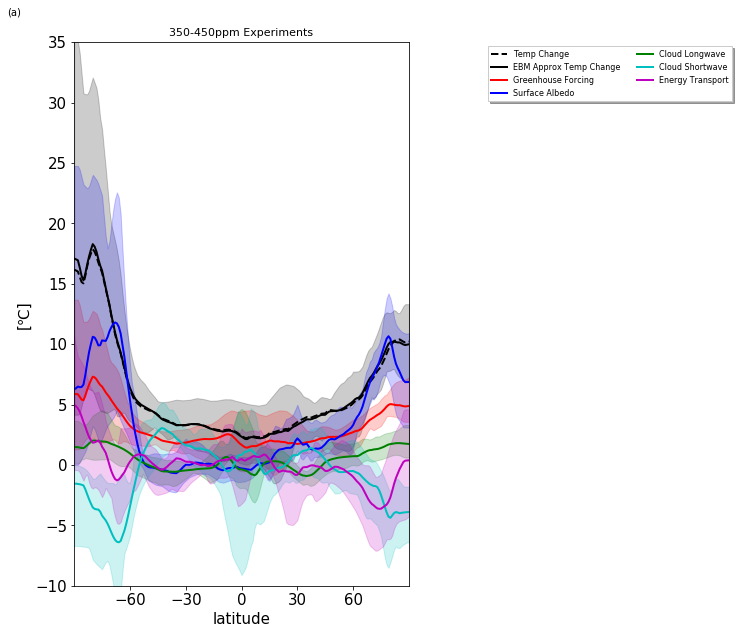

In [53]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_gg_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_salb_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_lwc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_swc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_tran_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

#plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm400Index_midmio[0,:],:]+deltaT_salb_MID_MIO_EXPS[ppm400Index_midmio[0,:],:]+deltaT_tran_MID_MIO_EXPS[ppm400Index_midmio[0,:],:]+deltaT_lwc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:]+deltaT_swc_MID_MIO_EXPS[ppm400Index_midmio[0,:],:], axis=0),linestyle='-',color='y',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('350-450ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)


plt.savefig('400ppm_MIDMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('400ppm_MIDMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('400ppm_MIDMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

<Figure size 600x1200 with 0 Axes>

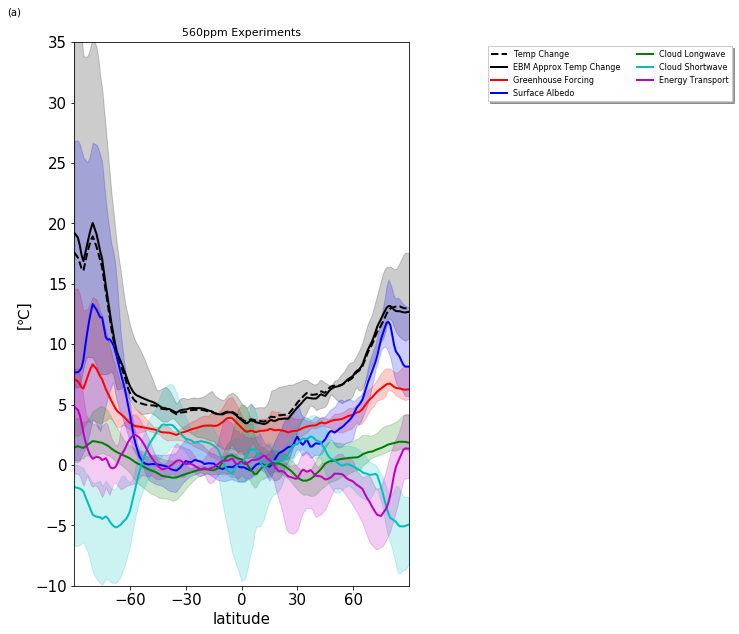

In [54]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_gg_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_salb_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_lwc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_swc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_tran_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

#plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm560Index_midmio[0,:],:]+deltaT_salb_MID_MIO_EXPS[ppm560Index_midmio[0,:],:]+deltaT_tran_MID_MIO_EXPS[ppm560Index_midmio[0,:],:]+deltaT_lwc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:]+deltaT_swc_MID_MIO_EXPS[ppm560Index_midmio[0,:],:], axis=0),linestyle='-',color='y',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('560ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)


plt.savefig('560ppm_MIDMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('560ppm_MIDMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('560ppm_MIDMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

<Figure size 600x1200 with 0 Axes>

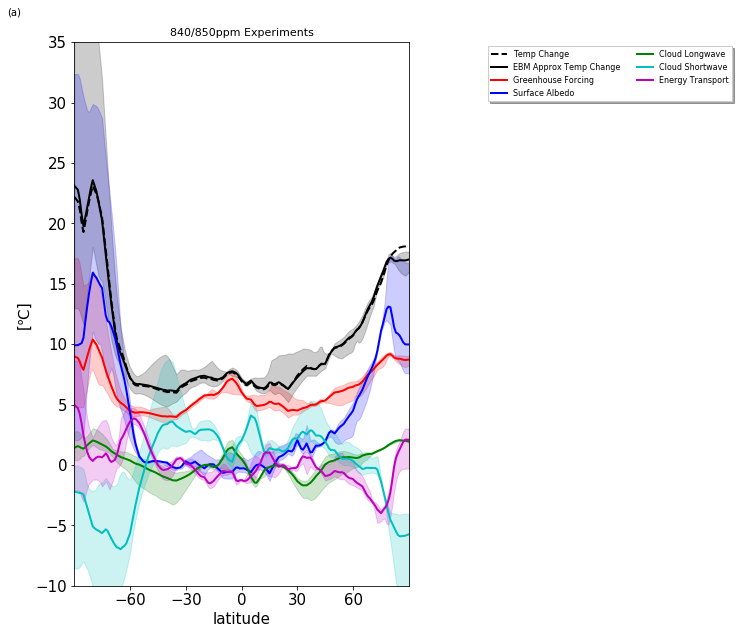

In [55]:
fig = plt.figure(figsize=(6, 12), dpi=100) #figsize(weight,height)
fig,ax=plt.subplots(figsize=(6, 10))

#ax.fill_between(lat,np.nanmin(TS_ANO_ZM_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(TS_ANO_ZM_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(TS_ANO_ZM_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='--',linewidth=2,color='k',label='Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='k', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='k',label='EBM Approx Temp Change')

ax.fill_between(lat,np.nanmin(deltaT_gg_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_gg_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='r', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

ax.fill_between(lat,np.nanmin(deltaT_salb_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_salb_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='b', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_salb_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='b',label='Surface Albedo')

ax.fill_between(lat,np.nanmin(deltaT_lwc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_lwc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='g', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_lwc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

ax.fill_between(lat,np.nanmin(deltaT_swc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_swc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='c', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_swc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

ax.fill_between(lat,np.nanmin(deltaT_tran_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), np.nanmax(deltaT_tran_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0), color='m', alpha=0.2)
plt.plot(lat,np.nanmean(deltaT_tran_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',linewidth=2,color='m',label='Energy Transport')

#plt.plot(lat,np.nanmean(deltaT_gg_MID_MIO_EXPS[ppm850Index_midmio[0,:],:]+deltaT_salb_MID_MIO_EXPS[ppm850Index_midmio[0,:],:]+deltaT_tran_MID_MIO_EXPS[ppm850Index_midmio[0,:],:]+deltaT_lwc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:]+deltaT_swc_MID_MIO_EXPS[ppm850Index_midmio[0,:],:], axis=0),linestyle='-',color='y',label='Energy Transport')

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "(a)", transform=ax.transAxes)

#create a title
plt.title('840/850ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]', fontsize=15)
plt.xlabel('latitude', fontsize=15)

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,35))

xtick_levels = np.linspace(-60,60,5)
ax.set_xticks(xtick_levels)

ax.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('850ppm_MIDMio_EBM.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('850ppm_MIDMio_EBM.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('850ppm_MIDMio_EBM.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

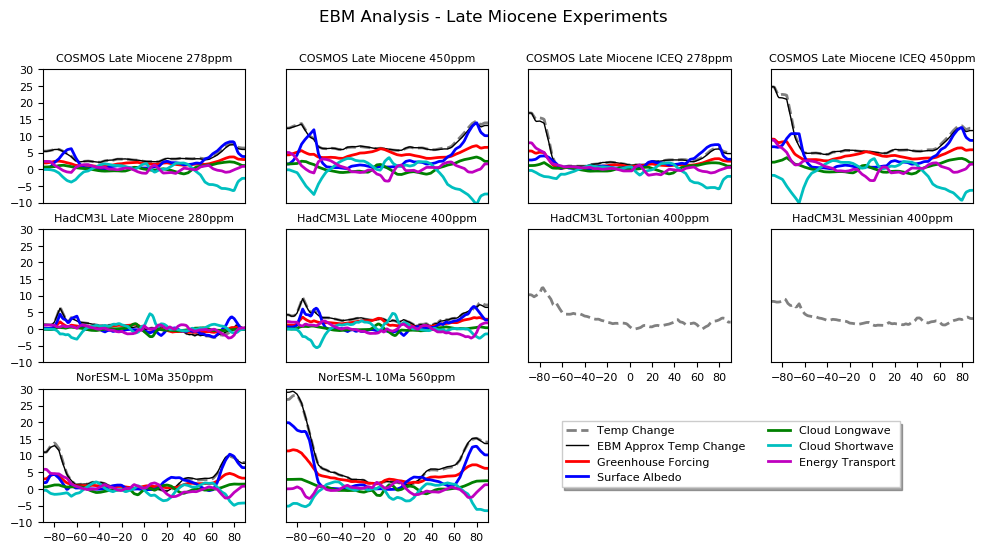

In [56]:
  
ncols = 4
nrows = 3

ytick_levels = np.linspace(-10,30,9)
xtick_levels = np.linspace(-80,80,9)

# create the plots
fig = plt.figure(figsize=(12, 6), dpi=100) #figsize(weight,height)

for i in range(0, len(LATE_MIO_EXPS_NAMES)):
    # iterate over all of the Late Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            plt.plot(lat,TS_ANO_ZM_LATE_MIO_EXPS[i,:],linestyle='--',linewidth=2,color='gray',label='Temp Change')

            plt.plot(lat,deltaT_LATE_MIO_EXPS[i,:],linestyle='-',linewidth=1,color='k',label='EBM Approx Temp Change')

            plt.plot(lat,deltaT_gg_LATE_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

            plt.plot(lat,deltaT_salb_LATE_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='b',label='Surface Albedo')

            plt.plot(lat,deltaT_lwc_LATE_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

            plt.plot(lat,deltaT_swc_LATE_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

            plt.plot(lat,deltaT_tran_LATE_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='m',label='Energy Transport')

            ax.set_title(LATE_MIO_EXPS_NAMES[i], fontsize=8)
            if i == 9 or i == 6 or i == 7:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i == 0 or i== 4:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 8:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)
            plt.xlim((-90,90))
            plt.ylim((-10,30))
 
lgd = plt.legend(loc="upper center", bbox_to_anchor=(2.2,0.8), fancybox=False, shadow=True, ncol=2, fontsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('EBM Analysis - Late Miocene Experiments')

# plt.tight_layout()
#plt.show()
   
plt.savefig('LateMiocene_EBM.pdf', format='pdf')    
#plt.savefig('LateMiocene_EBM.eps', format='eps')
plt.savefig('LateMiocene_EBM.png', format='png')    

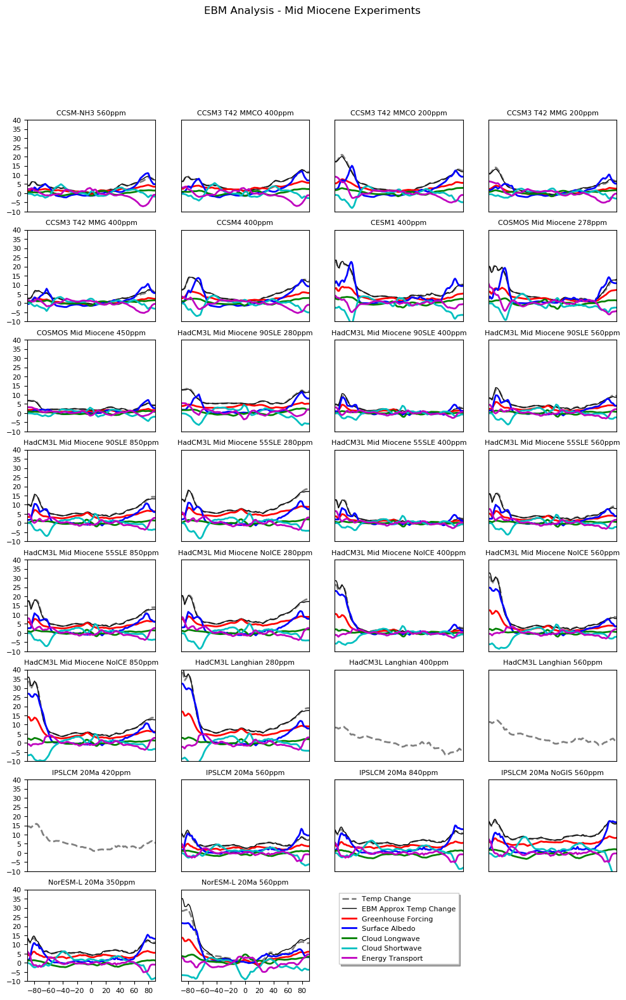

In [57]:
  
ncols = 4
nrows = 8

ytick_levels = np.linspace(-10,40,11)
xtick_levels = np.linspace(-80,80,9)

fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            plt.plot(lat,TS_ANO_ZM_MID_MIO_EXPS[i,:],linestyle='--',linewidth=2,color='gray',label='Temp Change')
            #TS_ANO_ZM_MIO_ALL_EXPS

            plt.plot(lat,deltaT_MID_MIO_EXPS[i,:],linestyle='-',linewidth=1,color='k',label='EBM Approx Temp Change')

            plt.plot(lat,deltaT_gg_MID_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='r',label='Greenhouse Forcing')

            plt.plot(lat,deltaT_salb_MID_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='b',label='Surface Albedo')

            plt.plot(lat,deltaT_lwc_MID_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='g',label='Cloud Longwave')

            plt.plot(lat,deltaT_swc_MID_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='c',label='Cloud Shortwave')

            plt.plot(lat,deltaT_tran_MID_MIO_EXPS[i,:],linestyle='-',linewidth=2,color='m',label='Energy Transport')

            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)
            plt.xlim((-90,90))
            plt.ylim((-10,40))
       
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.7,1), fancybox=False, shadow=True, ncol=1, fontsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('EBM Analysis - Mid Miocene Experiments')
   
plt.savefig('MidMiocene_EBM.pdf', format='pdf')    
#plt.savefig('MidMiocene_EBM.eps', format='eps')
plt.savefig('MidMiocene_EBM.png', format='png')    

**Data Model Comparision Plots**

In [58]:
filename='Bradshaw2012_LateMiocene_MAT_Adjusted.csv'
LATEMIO_MAT = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#LATEMIO_MAT

In [59]:
LATEMIO_MAT2=LATEMIO_MAT.values[0:-1,:]
PalLatMin=np.asarray(LATEMIO_MAT2[:,0],dtype=np.float64)
PalLatMax=np.asarray(LATEMIO_MAT2[:,1],dtype=np.float64)
PalLonMin=np.asarray(LATEMIO_MAT2[:,2],dtype=np.float64)
PalLonMax=np.asarray(LATEMIO_MAT2[:,3],dtype=np.float64)
OriginalMATmin=np.asarray(LATEMIO_MAT2[:,4],dtype=np.float64)
OriginalMATmax=np.asarray(LATEMIO_MAT2[:,5],dtype=np.float64)

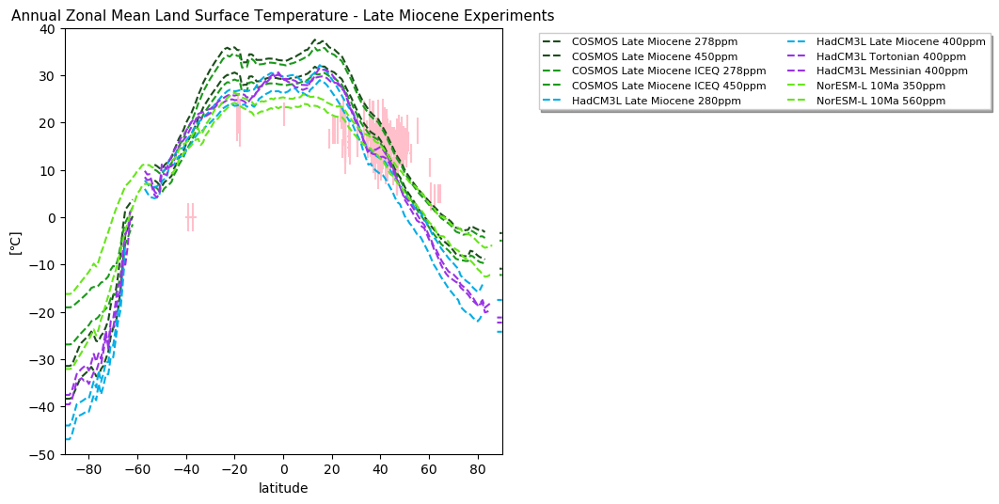

In [60]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in range(0, len(LATE_MIO_EXPS_NAMES)):  
            if i <= 9:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='--',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('Annual Zonal Mean Land Surface Temperature - Late Miocene Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-50,40))

midpoint_lat=(PalLatMax+PalLatMin)/2
midpoint_MAT=(OriginalMATmax+OriginalMATmin)/2

plt.errorbar(midpoint_lat, midpoint_MAT, xerr=[midpoint_lat-PalLatMin, PalLatMax-midpoint_lat], yerr=[midpoint_MAT-OriginalMATmin, OriginalMATmax-midpoint_MAT], ls='none', color='pink')

#add grid lines
#plt.grid()

plt.savefig('LateMiocene_ZonalMeanMAT.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('LateMiocene_ZonalMeanMAT.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('LateMiocene_ZonalMeanMAT.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

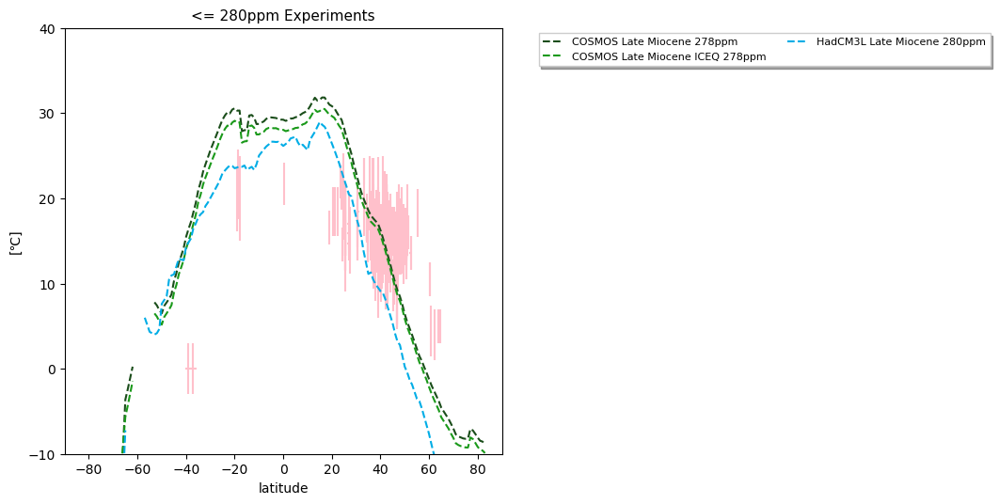

In [61]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm280Index[0,:]):  
            if i <= 9:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='--',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else: 
                continue

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('<= 280ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

midpoint_lat=(PalLatMax+PalLatMin)/2
midpoint_MAT=(OriginalMATmax+OriginalMATmin)/2

plt.errorbar(midpoint_lat, midpoint_MAT, xerr=[midpoint_lat-PalLatMin, PalLatMax-midpoint_lat], yerr=[midpoint_MAT-OriginalMATmin, OriginalMATmax-midpoint_MAT], ls='none', color='pink')

plt.savefig('280ppm_LateMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('280ppm_LateMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('280ppm_LateMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

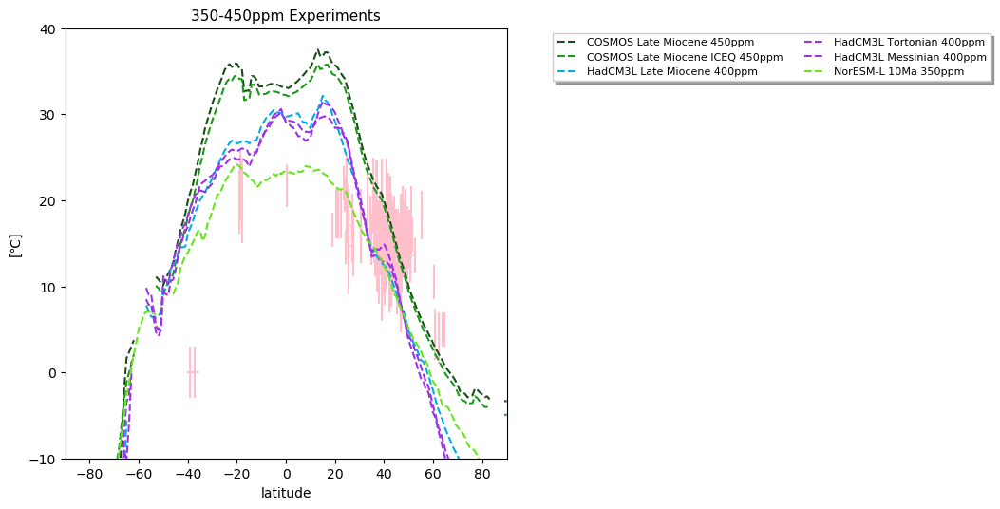

In [62]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm400Index[0,:]):  
            if i <= 9:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='--',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('350-450ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

midpoint_lat=(PalLatMax+PalLatMin)/2
midpoint_MAT=(OriginalMATmax+OriginalMATmin)/2

plt.errorbar(midpoint_lat, midpoint_MAT, xerr=[midpoint_lat-PalLatMin, PalLatMax-midpoint_lat], yerr=[midpoint_MAT-OriginalMATmin, OriginalMATmax-midpoint_MAT], ls='none', color='pink')

plt.savefig('400ppm_LateMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('400ppm_LateMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('400ppm_LateMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

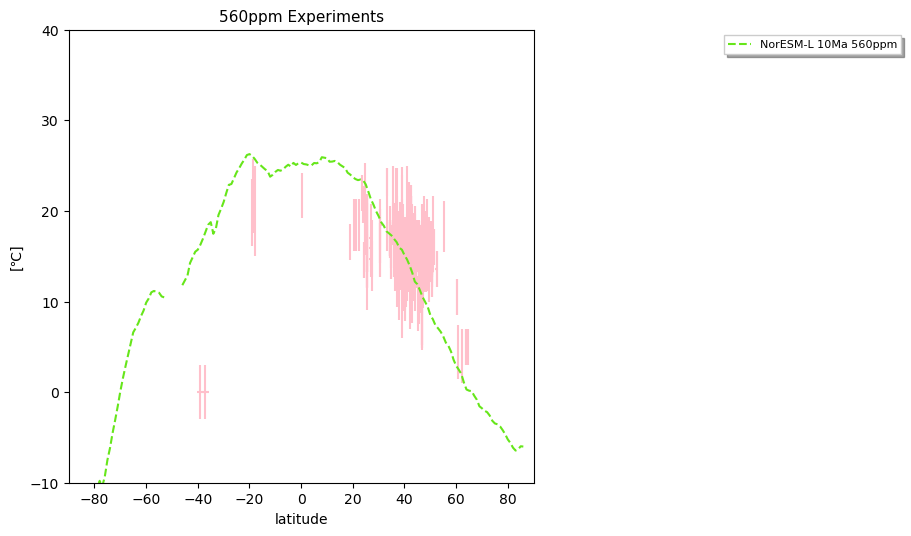

In [63]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm560Index[0,:]):  
            if i <= 9:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='--',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('560ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

midpoint_lat=(PalLatMax+PalLatMin)/2
midpoint_MAT=(OriginalMATmax+OriginalMATmin)/2

plt.errorbar(midpoint_lat, midpoint_MAT, xerr=[midpoint_lat-PalLatMin, PalLatMax-midpoint_lat], yerr=[midpoint_MAT-OriginalMATmin, OriginalMATmax-midpoint_MAT], ls='none', color='pink')

plt.savefig('560ppm_LateMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('560ppm_LateMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('560ppm_LateMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

No handles with labels found to put in legend.


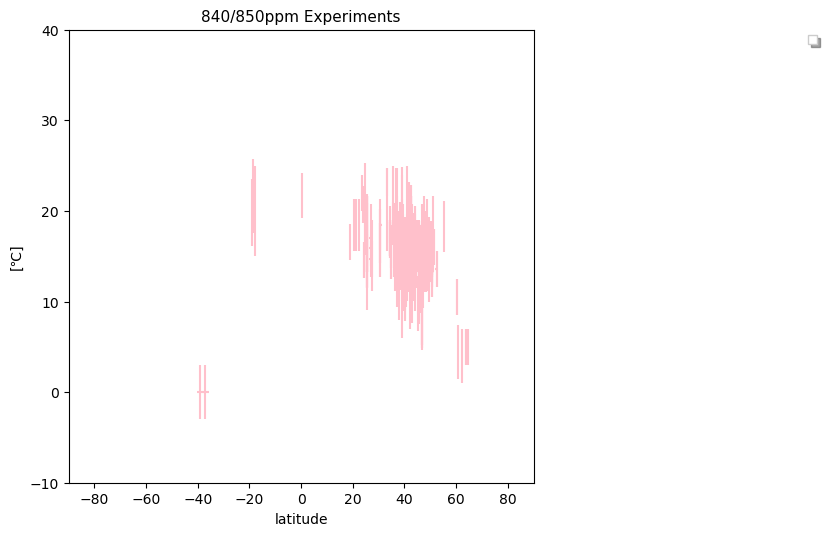

In [64]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)
#ax = fig.add_subplot(2, 1, 1+1)

for i in (ppm850Index[0,:]):  
            if i <= 9:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='--',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('840/850ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

midpoint_lat=(PalLatMax+PalLatMin)/2
midpoint_MAT=(OriginalMATmax+OriginalMATmin)/2

plt.errorbar(midpoint_lat, midpoint_MAT, xerr=[midpoint_lat-PalLatMin, PalLatMax-midpoint_lat], yerr=[midpoint_MAT-OriginalMATmin, OriginalMATmax-midpoint_MAT], ls='none', color='pink')

plt.savefig('850ppm_LateMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('850ppm_LateMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('850ppm_LateMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

In [65]:
filename='Data_02_28_20_clean_MidMioceneSlab_MAT.csv'
MIDMIO_MAT = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')

In [66]:
MIDMIO_MAT2=MIDMIO_MAT.values[0:-1,:]
MidMioLat=np.asarray(MIDMIO_MAT2[:,0],dtype=np.float64)
MidMioLon=np.asarray(MIDMIO_MAT2[:,1],dtype=np.float64)
MidMioMAT=np.asarray(MIDMIO_MAT2[:,2],dtype=np.float64)
MidMioMATUncert=np.asarray(MIDMIO_MAT2[:,3],dtype=np.float64)

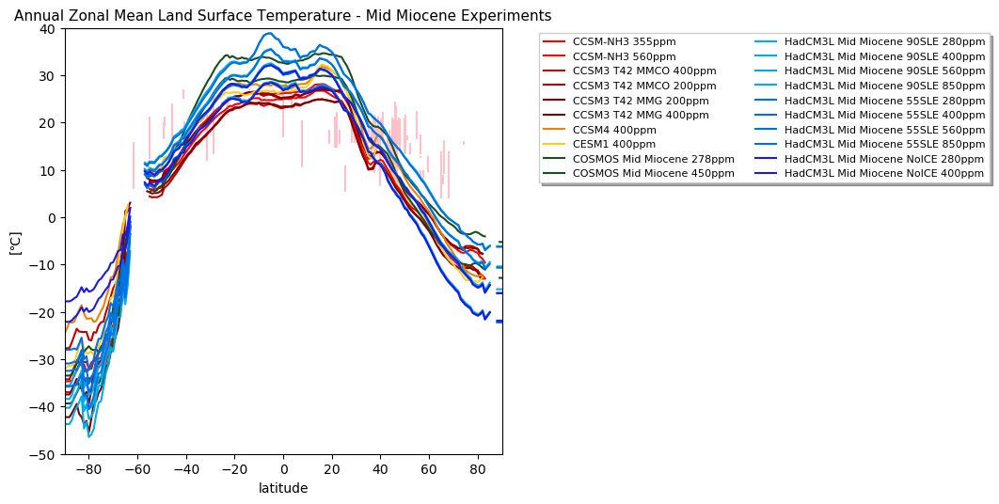

In [67]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in range(0, len(MID_MIO_EXPS_NAMES)):  
            if i >= 10:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('Annual Zonal Mean Land Surface Temperature - Mid Miocene Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-50,40))

plt.errorbar(MidMioLat, MidMioMAT, yerr=[MidMioMATUncert, MidMioMATUncert], ls='none', color='pink')

#add grid lines
#plt.grid()

plt.savefig('MidMiocene_ZonalMeanMAT.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('LateMiocene_ZonalMeanMAT.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('MidMiocene_ZonalMeanMAT.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

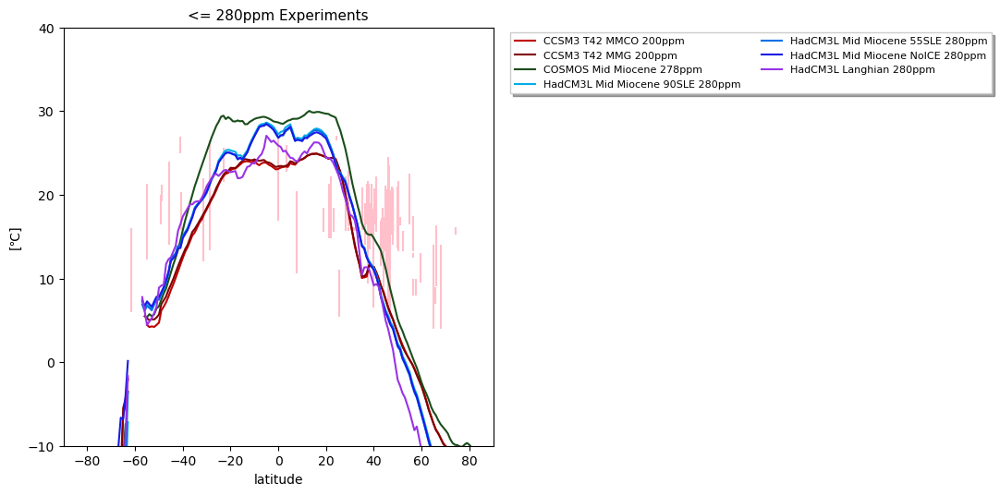

In [68]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)
#ax = fig.add_subplot(2, 1, 1+1)

for i in (ppm280Index[0,:]):  
            if i >= 10:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
                
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('<= 280ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

plt.errorbar(MidMioLat, MidMioMAT, yerr=[MidMioMATUncert, MidMioMATUncert], ls='none', color='pink')

#add grid lines
#plt.grid()

plt.savefig('280ppm_MidMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('280ppm_MidMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('280ppm_MidMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

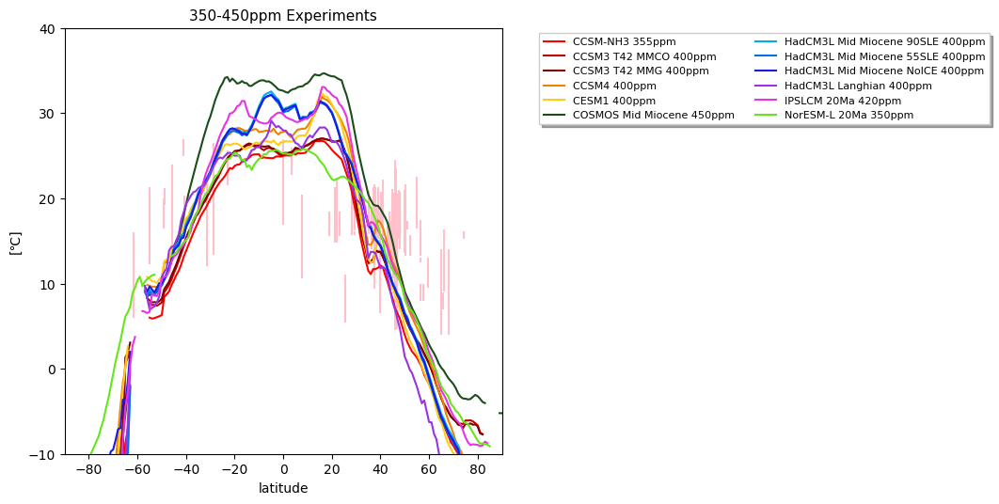

In [69]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm400Index[0,:]):  
            if i >= 10:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
                
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('350-450ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

plt.errorbar(MidMioLat, MidMioMAT, yerr=[MidMioMATUncert, MidMioMATUncert], ls='none', color='pink')

#add grid lines
#plt.grid()

plt.savefig('400ppm_MidMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('400ppm_MidMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('400ppm_MidMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

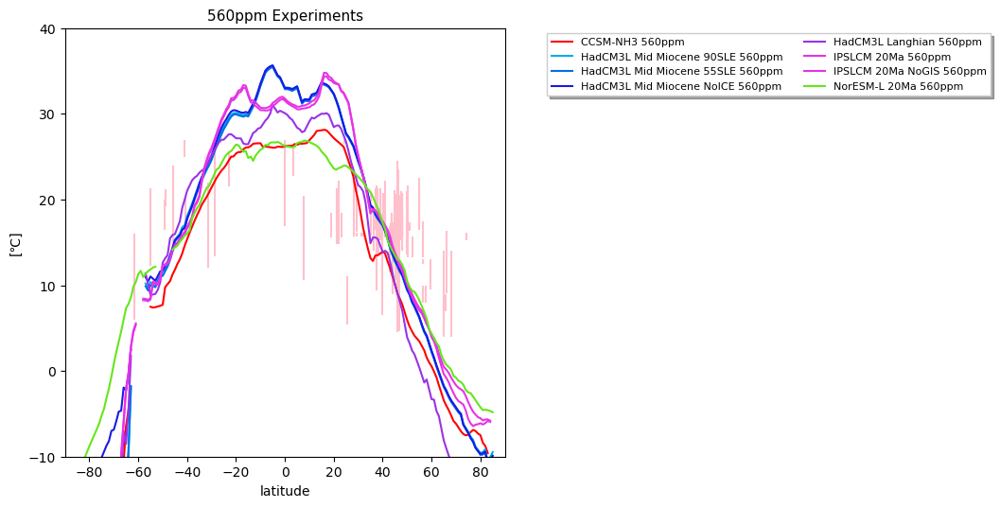

In [70]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm560Index[0,:]):  
            if i >= 10:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('560ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

plt.errorbar(MidMioLat, MidMioMAT, yerr=[MidMioMATUncert, MidMioMATUncert], ls='none', color='pink')

#add grid lines
#plt.grid()

plt.savefig('560ppm_MidMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('560ppm_MidMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('560ppm_MidMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

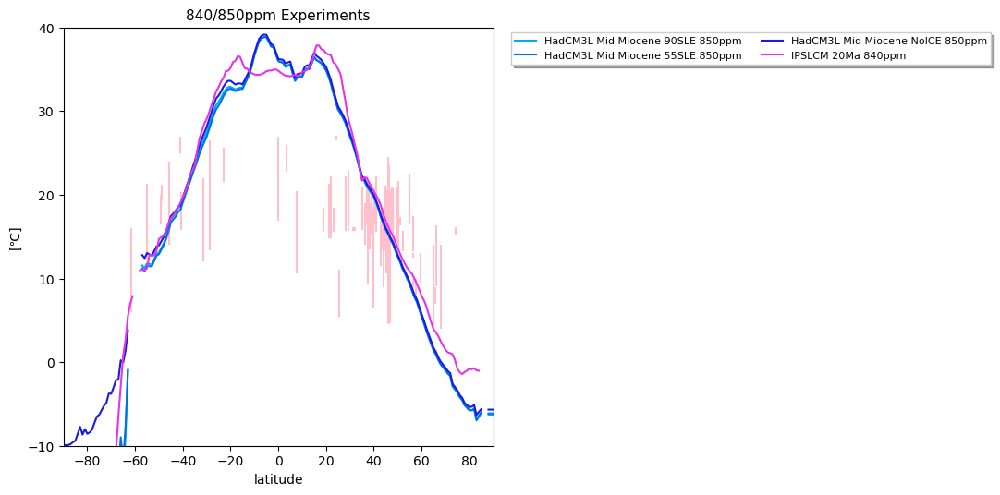

In [71]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm850Index[0,:]):  
            if i >= 10:
                plt.plot(lat,LTS_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('840/850ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-10,40))

plt.errorbar(MidMioLat, MidMioMAT, yerr=[MidMioMATUncert, MidMioMATUncert], ls='none', color='pink')

#add grid lines
#plt.grid()

plt.savefig('850ppm_MidMio_ZonalMeanLTS.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('850ppm_MidMio_ZonalMeanLTS.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('850ppm_MidMio_ZonalMeanLTS.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

In [72]:
filename='LateMiocene_SST_v2.csv'
LATEMIO_SST = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#LATEMIO_SST

In [73]:
LATEMIO_SST2=LATEMIO_SST.values[:,:]
LateMioSSTLat=np.asarray(LATEMIO_SST2[:,3],dtype=np.float64)
LateMioSST=np.asarray(LATEMIO_SST2[:,1],dtype=np.float64)
LateMioSST_ucert=np.asarray(LATEMIO_SST2[:,2],dtype=np.float64)

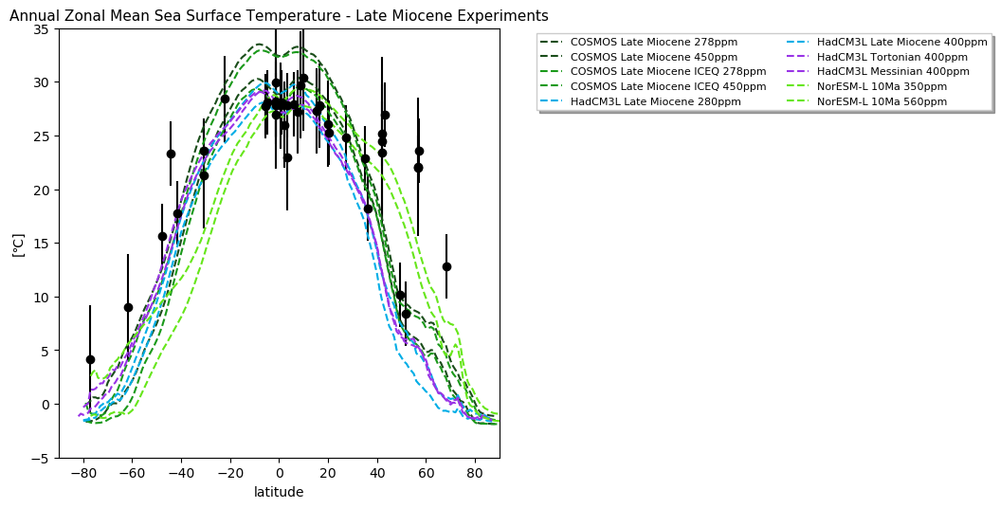

In [74]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in range(0, len(LATE_MIO_EXPS_NAMES)):  
            if i <= 9:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='--',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 

lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('Annual Zonal Mean Sea Surface Temperature - Late Miocene Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(LateMioSSTLat, LateMioSST, yerr=LateMioSST_ucert, ls='none', color='black')
plt.plot(LateMioSSTLat, LateMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('LateMiocene_ZonalMeanSST.pdf', forSST='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('LateMiocene_ZonalMeanSST.eps', forSST='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('LateMiocene_ZonalMeanSST.png', forSST='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

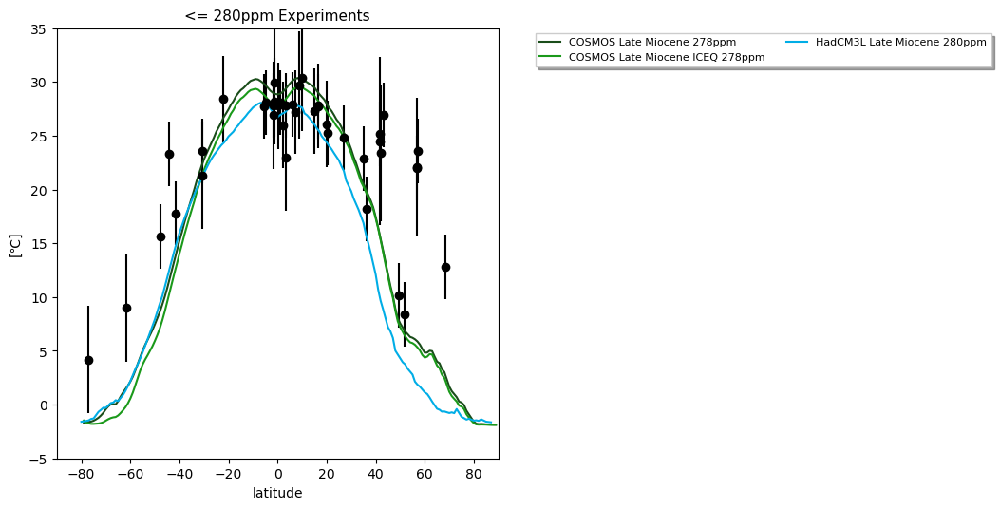

In [75]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm280Index[0,:]):  
            if i <= 9:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('<= 280ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(LateMioSSTLat, LateMioSST, yerr=LateMioSST_ucert, ls='none', color='black')
plt.plot(LateMioSSTLat, LateMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('280ppm_LateMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('280ppm_LateMio_ZonalMeanSST.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('280ppm_LateMio_ZonalMeanSST.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

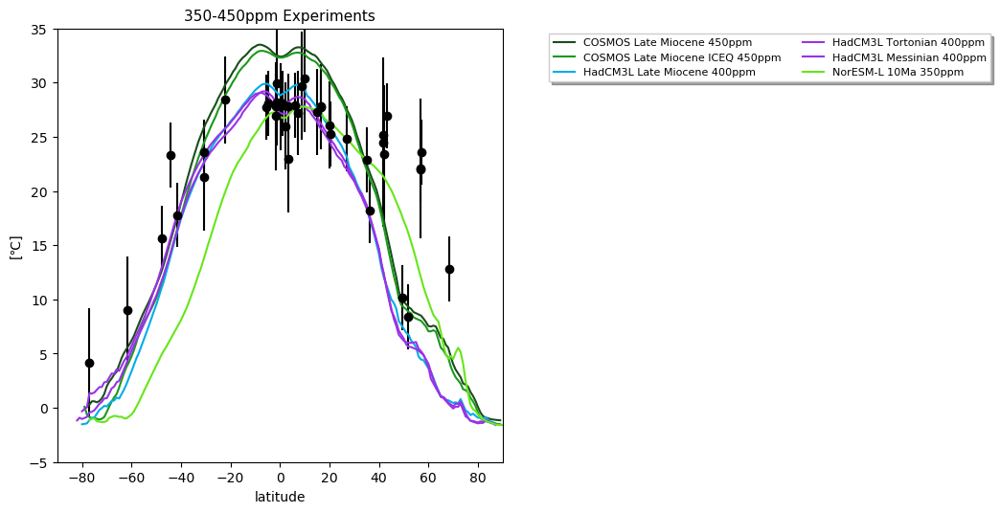

In [76]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm400Index[0,:]):  
            if i <= 9:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('350-450ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(LateMioSSTLat, LateMioSST, yerr=LateMioSST_ucert, ls='none', color='black')
plt.plot(LateMioSSTLat, LateMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('400ppm_LateMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('400ppm_LateMio_ZonalMeanSST.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('400ppm_LateMio_ZonalMeanSST.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

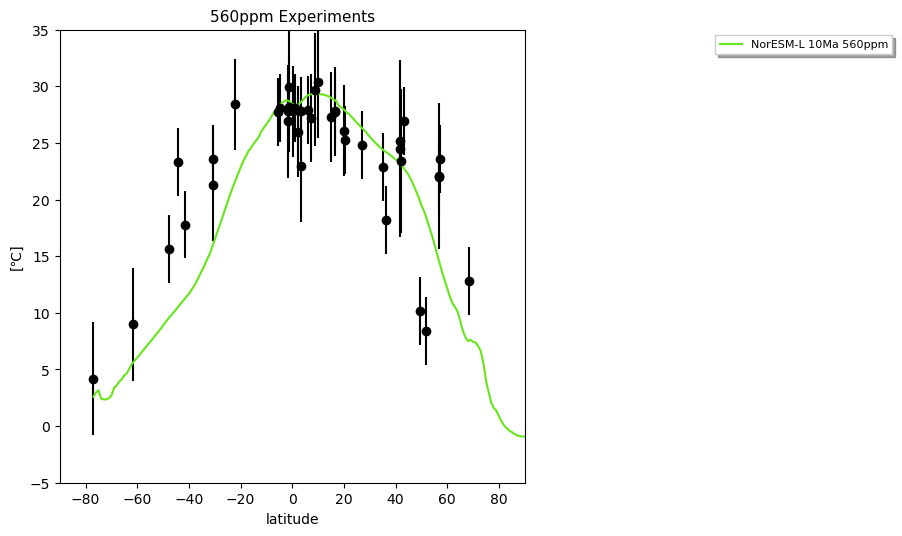

In [77]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm560Index[0,:]):  
            if i <= 9:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('560ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(LateMioSSTLat, LateMioSST, yerr=LateMioSST_ucert, ls='none', color='black')
plt.plot(LateMioSSTLat, LateMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('560ppm_LateMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('560ppm_LateMio_ZonalMeanSST.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('560ppm_LateMio_ZonalMeanSST.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

No handles with labels found to put in legend.


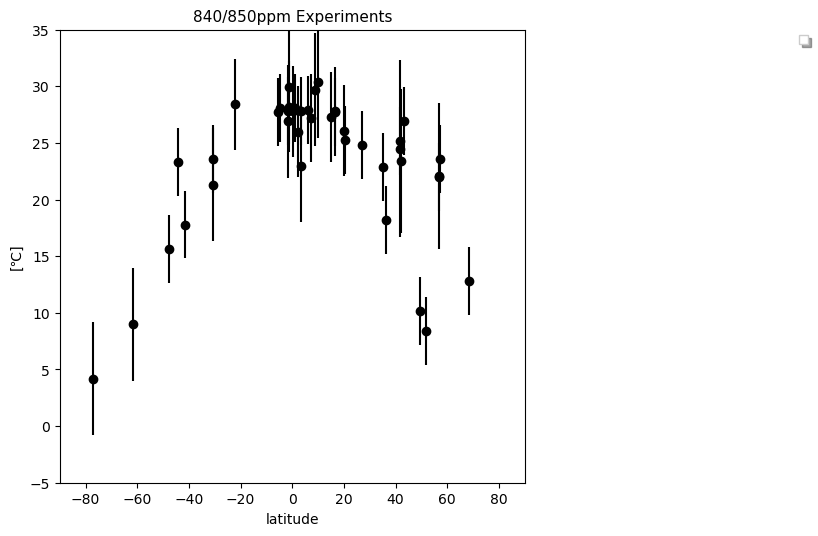

In [78]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm850Index[0,:]):  
            if i <= 9:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
#create a legend and set its location to under the graph
#plt.legend(loc="upper center", bbox_to_anchor=(0.6,1), fancybox=False, shadow=True, ncol=2, fontsize=6)
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('840/850ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(LateMioSSTLat, LateMioSST, yerr=LateMioSST_ucert, ls='none', color='black')
plt.plot(LateMioSSTLat, LateMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('850ppm_LateMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')
#plt.savefig('850ppm_LateMio_ZonalMeanSST.eps', format='eps', bbox_extra_artists=(lgd,text), bbox_inches='tight')
plt.savefig('850ppm_LateMio_ZonalMeanSST.png', format='png', bbox_extra_artists=(lgd,text), bbox_inches='tight') 

In [79]:
filename='MidMiocene_SST_v2.csv'
MIDMIO_SST = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#MIDMIO_SST

In [80]:
MIDMIO_SST2=MIDMIO_SST.values[:,:]
MidMioSSTLat=np.asarray(MIDMIO_SST2[:,3],dtype=np.float64)
MidMioSST=np.asarray(MIDMIO_SST2[:,1],dtype=np.float64)
MidMioSST_ucert=np.asarray(MIDMIO_SST2[:,2],dtype=np.float64)

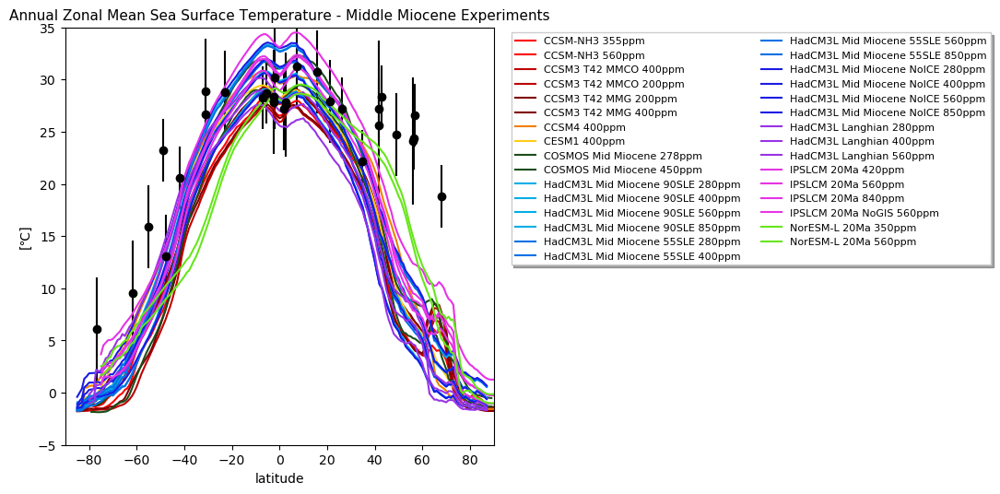

In [81]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)


for i in range(0, len(MIO_ALL_EXPS_NAMES)):  
            if i >= 10:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 


lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('Annual Zonal Mean Sea Surface Temperature - Middle Miocene Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(MidMioSSTLat, MidMioSST, yerr=MidMioSST_ucert, ls='none', color='black')
plt.plot(MidMioSSTLat, MidMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('MidMiocene_ZonalMeanSST.pdf', forSST='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')

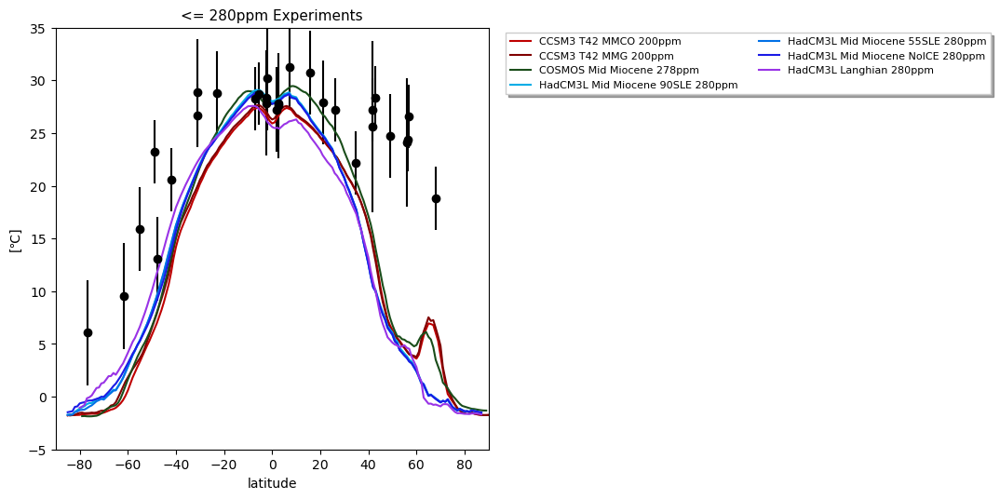

In [82]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm280Index[0,:]):  
            if i >= 10:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
                
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('<= 280ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(MidMioSSTLat, MidMioSST, yerr=MidMioSST_ucert, ls='none', color='black')
plt.plot(MidMioSSTLat, MidMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('280ppm_MidMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')

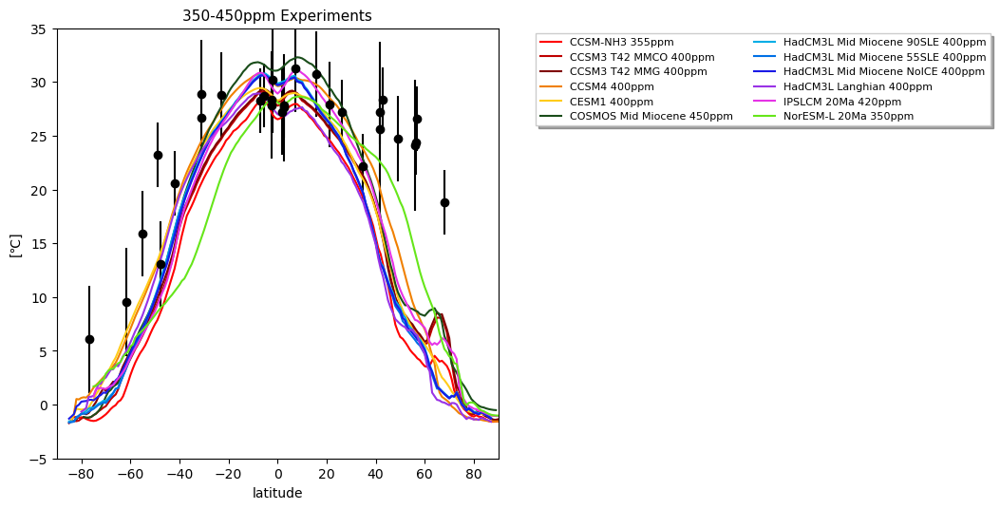

In [83]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm400Index[0,:]):  
            if i >= 10:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('350-450ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(MidMioSSTLat, MidMioSST, yerr=MidMioSST_ucert, ls='none', color='black')
plt.plot(MidMioSSTLat, MidMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('400ppm_MidMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')

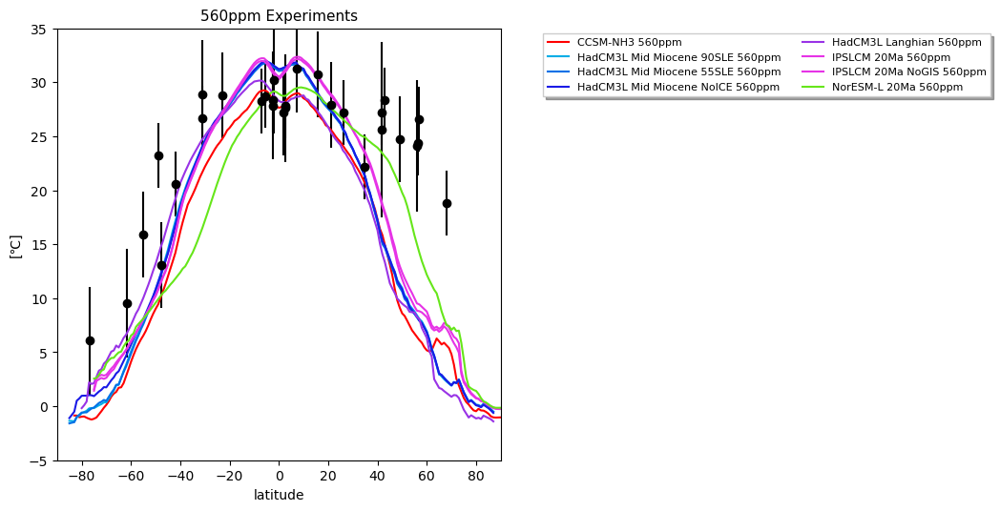

In [84]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm560Index[0,:]):  
            if i >= 10:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('560ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(MidMioSSTLat, MidMioSST, yerr=MidMioSST_ucert, ls='none', color='black')
plt.plot(MidMioSSTLat, MidMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('560ppm_MidMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')

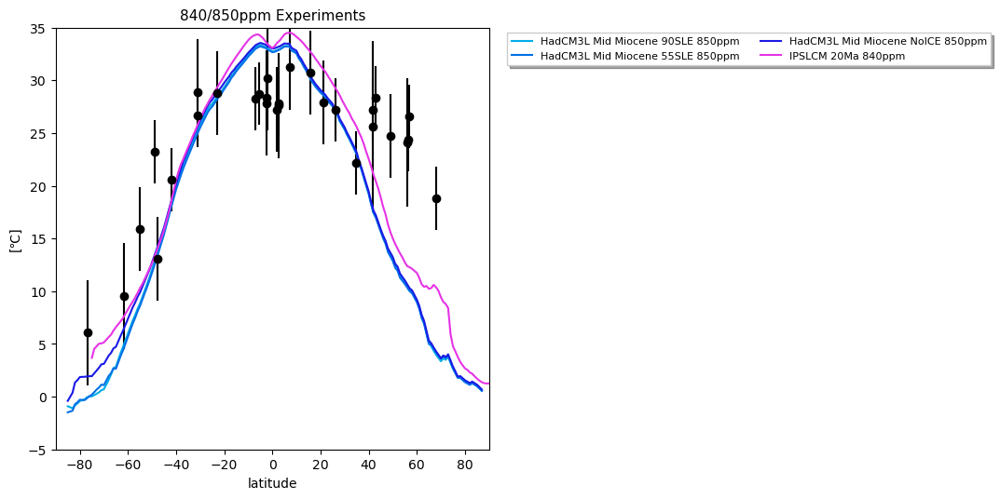

In [85]:
fig = plt.figure(figsize=(6, 6), dpi=100) #figsize(weight,height)

for i in (ppm850Index[0,:]):  
            if i >= 10:
                plt.plot(lat,SST_ZM_MIO_ALL_EXPS[i,:],linestyle='-',color=(MioStudyR[i],MioStudyG[i],MioStudyB[i]),label=MIO_ALL_EXPS_NAMES[i])                 
            else:
                continue
    
lgd = plt.legend(loc="upper center", bbox_to_anchor=(1.6,1), fancybox=False, shadow=True, ncol=2, fontsize=8)
text = ax.text(-0.2,1.05, "Aribitrary text", transform=ax.transAxes)

#create a title
plt.title('840/850ppm Experiments', fontsize=11)   
plt.ylabel('[\u2103]')
plt.xlabel('latitude')

#set axis limits
plt.xlim((-90,90))
plt.ylim((-5,35))

Uk37_uncert=1.5
plt.errorbar(MidMioSSTLat, MidMioSST, yerr=MidMioSST_ucert, ls='none', color='black')
plt.plot(MidMioSSTLat, MidMioSST, 'ok')

#add grid lines
#plt.grid()

plt.savefig('850ppm_MidMio_ZonalMeanSST.pdf', format='pdf', bbox_extra_artists=(lgd,text), bbox_inches='tight')

**Lat - Lon model-data comparision plots**

**Plot Mid Miocene SST bias**

In [86]:
filename='MidMiocene_SST_v2.csv'
MIDMIO_SST = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#MIDMIO_SST

In [87]:
MIDMIO_SST2=MIDMIO_SST.values[:,:]
MidMioSSTLat=np.asarray(MIDMIO_SST2[:,3],dtype=np.float64)
MidMioSSTLon180=np.asarray(MIDMIO_SST2[:,4],dtype=np.float64)
MidMioSSTLon=np.asarray(MIDMIO_SST2[:,5],dtype=np.float64)
MidMioSST=np.asarray(MIDMIO_SST2[:,1],dtype=np.float64)
MidMioSST_ucert=np.asarray(MIDMIO_SST2[:,2],dtype=np.float64)

In [88]:
# For these plots use the 1 standard deviation uncertainty 
MidMioSST_max=MidMioSST+MidMioSST_ucert/2
MidMioSST_min=MidMioSST-MidMioSST_ucert/2

In [89]:
MidMioSSTSiteName=MIDMIO_SST2[:,0]

In [90]:
# Adjusted lat and lon to avoid overlap in plots
MidMioSSTLon180_plot=np.asarray(MIDMIO_SST2[:,4],dtype=np.float64)
MidMioSSTLon_plot=np.asarray(MIDMIO_SST2[:,5],dtype=np.float64)

MidMioSSTLon_plot[13]=MidMioSSTLon[13]-8 #926
MidMioSSTLon_plot[11]=MidMioSSTLon[11]+8 #925Uk37
#MidMioSSTLon_plot[4]=MidMioSSTLon[4]+8 #ANDA2
MidMioSSTLon_plot[2]=MidMioSSTLon[2]+8 # 608Uk37
MidMioSSTLon_plot[8]=MidMioSSTLon[8]+8 # 850Tex86
MidMioSSTLon_plot[15]=MidMioSSTLon[15]+8 # 982Uk37Super
MidMioSSTLon_plot[16]=MidMioSSTLon[16]-8 # 982Tex86

MidMioSSTLon180_plot[13]=MidMioSSTLon180[13]-8 #926
MidMioSSTLon180_plot[11]=MidMioSSTLon180[11]+8 #925Uk37
#MidMioSSTLon180_plot[4]=MidMioSSTLon180[4]+8 #ANDA2
MidMioSSTLon180_plot[2]=MidMioSSTLon180[2]+8 #608Uk37
MidMioSSTLon180_plot[8]=MidMioSSTLon180[8]+8 #850Tex86
MidMioSSTLon180_plot[15]=MidMioSSTLon180[15]+8 #982Uk37Super
MidMioSSTLon180_plot[16]=MidMioSSTLon180[16]-8 # 982Tex86


MidMioSSTLat_plot=np.asarray(MIDMIO_SST2[:,3],dtype=np.float64)
MidMioSSTLat_plot[9]=MidMioSSTLat[9]+3 #850Uk37
MidMioSSTLat_plot[10]=MidMioSSTLat[10]+3 #907Uk37

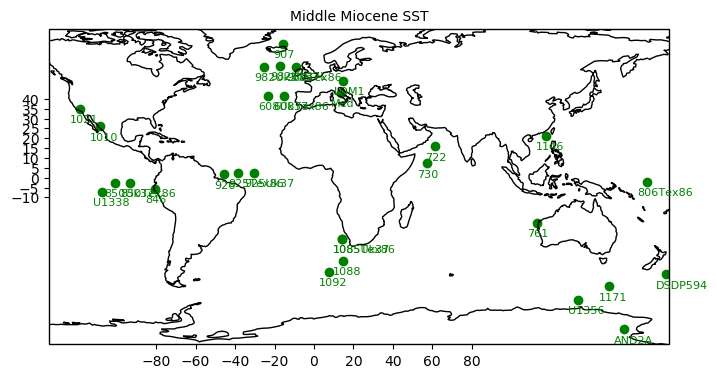

In [91]:
# info plot on site locations
fig = plt.figure(figsize=(8, 6), dpi=100)

Site_lon=MidMioSSTLon180_plot
Site_lat=MidMioSSTLat
Site_Name=MidMioSSTSiteName

ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_title('Middle Miocene SST', fontsize=10)
ax.set_xticks(xtick_levels)
ax.set_yticks(ytick_levels)                

ax.coastlines()

#Add site locations
ax.scatter(Site_lon, Site_lat, c='g', marker='o', edgecolors='g')
for i, txt in enumerate(Site_Name):
    ax.annotate(txt, (Site_lon[i]-5, Site_lat[i]-7), fontsize=8, color='g')
   
plt.savefig('MidMioSSTSiteLocations.pdf', format='pdf')    
plt.savefig('MidMioSSTSiteLocations.eps', format='eps')
plt.savefig('MidMioSSTSiteLocations.png', format='png')    

In [92]:
Lon_index_midmiosst=[]
Lat_index_midmiosst=[]
for i in range(0, len(MidMioSST)):
            Lon_temp=np.where((lon>=MidMioSSTLon[i]-0.5) & (lon<=MidMioSSTLon[i]+0.5))[0]
            Lon_index_midmiosst.append(Lon_temp)
            Lat_temp=np.where((lat>=MidMioSSTLat[i]-0.5) & (lat<=MidMioSSTLat[i]+0.5))[0]
            Lat_index_midmiosst.append(Lat_temp)

In [93]:
# -1,1  0,1  1,1
# -1,0  0,0  1,0
# -1,-1 0,-1 1,-1
SST_MID_MIO_EXPS_max=np.empty([0,len(MidMioSST)])
SST_MID_MIO_EXPS_min=np.empty([0,len(MidMioSST)])
for j in range(0, len(SST_MID_MIO_EXPS)):
    SST_MID_MIO_EXPS_max_run=[]
    SST_MID_MIO_EXPS_min_run=[]
    for i in range(0, len(MidMioSST)):
                SST_MID_MIO_EXPS_min_temp=np.nanmin([SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]+1,Lon_index_midmiosst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]+1,Lon_index_midmiosst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]+1,Lon_index_midmiosst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i],Lon_index_midmiosst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i],Lon_index_midmiosst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i],Lon_index_midmiosst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]-1,Lon_index_midmiosst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]-1,Lon_index_midmiosst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]-1,Lon_index_midmiosst[i]+1], \
                ])
                SST_MID_MIO_EXPS_max_temp=np.nanmax([SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]+1,Lon_index_midmiosst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]+1,Lon_index_midmiosst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]+1,Lon_index_midmiosst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i],Lon_index_midmiosst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i],Lon_index_midmiosst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i],Lon_index_midmiosst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]-1,Lon_index_midmiosst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]-1,Lon_index_midmiosst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_midmiosst[i]-1,Lon_index_midmiosst[i]+1], \
                ])
        
                SST_MID_MIO_EXPS_max_run.append(SST_MID_MIO_EXPS_max_temp)
                SST_MID_MIO_EXPS_min_run.append(SST_MID_MIO_EXPS_min_temp)
    del SST_MID_MIO_EXPS_max_temp
    del SST_MID_MIO_EXPS_min_temp
    SST_MID_MIO_EXPS_max = np.append(SST_MID_MIO_EXPS_max,[SST_MID_MIO_EXPS_max_run], axis=0)
    SST_MID_MIO_EXPS_min = np.append(SST_MID_MIO_EXPS_min,[SST_MID_MIO_EXPS_min_run], axis=0)

In [94]:
#np.mean(SST_MID_MIO_EXPS_max[:,:], axis=0)

In [95]:
MID_MIO_SSTbias=np.empty([0,len(MidMioSST)])
for j in range(0, len(SST_MID_MIO_EXPS)):
    SSTbias_run=[]
    for i in range(0, len(MidMioSST)):
        diff1=MidMioSST_min[i]-SST_MID_MIO_EXPS_max[j,i]
        diff2=SST_MID_MIO_EXPS_min[j,i]-MidMioSST_max[i]
        if diff1>0:
            SSTbias_temp=-diff1 
        elif diff2>0:
            SSTbias_temp=diff2
        elif np.isnan(diff2)==True:
            SSTbias_temp=float('nan')    
        else:
            SSTbias_temp=0
        SSTbias_run.append(SSTbias_temp)
    del SSTbias_temp
    MID_MIO_SSTbias=np.append(MID_MIO_SSTbias,[SSTbias_run], axis=0)

In [96]:
MID_MIO_SSTbias_mean=np.nanmean(MID_MIO_SSTbias, axis=1)

In [97]:
MID_MIO_SSTbias_rmse=np.sqrt(np.nanmean(np.square(MID_MIO_SSTbias), axis=1))

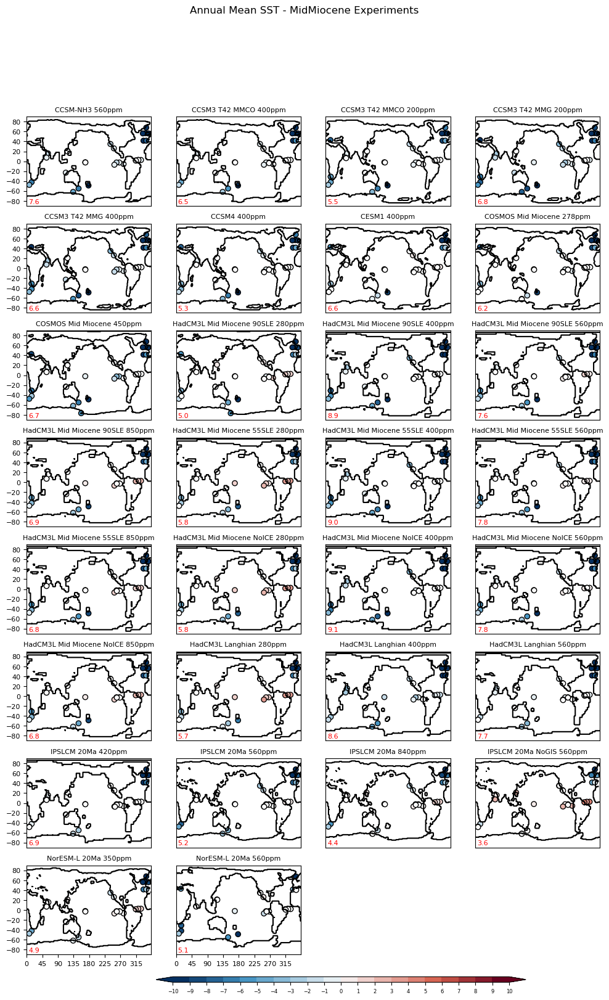

In [98]:
  
ncols = 4
nrows = 8

# set contour levels
#contour_levels = np.linspace(-30,30,30)
contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)


markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
            ax = fig.add_subplot(nrows, ncols, i+1)
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

                        
            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            ax.contour(TS_ANO_MID_MIO_EXPS.lon, TS_ANO_MID_MIO_EXPS.lat, MIDMIO_coast, levels=[0], colors='k', linestyles='-')
            

            cf=plt.scatter(MidMioSSTLon_plot, MidMioSSTLat, c=MID_MIO_SSTbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap)

            for j in range(0, len(MID_MIO_SSTbias[i,:])):
                if MID_MIO_SSTbias[i,j]==0:
                    cf2=plt.scatter(MidMioSSTLon_plot[j], MidMioSSTLat[j],facecolor='white',edgecolors='k')

            ax.text(5, -85, np.around(MID_MIO_SSTbias_rmse[i], decimals=1), fontsize=8, color='red')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal', extend='both')


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST - MidMiocene Experiments')
   
plt.savefig('MidMiocene_SST_bias.pdf', format='pdf')    
#plt.savefig('MCOMiocene_SST_bias.eps', format='eps')
#plt.savefig('MCOMiocene_SST_bias.png', format='png')    

**Plot MMM Bias in Late Miocene SST as a function of CO2**

In [99]:
ppm278_index = np.where(MID_MIO_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
SST_MID_MIO_EXPS_278=SST_MID_MIO_EXPS[ppm278_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_278.shape
SSTbias_MID_MIO_EXPS_278=MID_MIO_SSTbias[ppm278_indexls[0,:],:]
SST_MID_MIO_EXPS_max_278=SST_MID_MIO_EXPS_max[ppm278_indexls[0,:],:]
SST_MID_MIO_EXPS_min_278=SST_MID_MIO_EXPS_min[ppm278_indexls[0,:],:]

ppm280_index = np.where(MID_MIO_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
SST_MID_MIO_EXPS_280=SST_MID_MIO_EXPS[ppm280_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_280.shape
SSTbias_MID_MIO_EXPS_280=MID_MIO_SSTbias[ppm280_indexls[0,:],:]
SST_MID_MIO_EXPS_max_280=SST_MID_MIO_EXPS_max[ppm280_indexls[0,:],:]
SST_MID_MIO_EXPS_min_280=SST_MID_MIO_EXPS_min[ppm280_indexls[0,:],:]

SST_MID_MIO_EXPS_278and280 = np.concatenate((SST_MID_MIO_EXPS_278, SST_MID_MIO_EXPS_280),  axis=0)
SST_MID_MIO_EXPS_278and280_MEAN = np.nanmean(SST_MID_MIO_EXPS_278and280, axis=0)
SST_MID_MIO_EXPS_278and280_STD = np.std(SST_MID_MIO_EXPS_278and280, axis=0)
#SST_MID_MIO_EXPS_278and280.shape
SSTbias_MID_MIO_EXPS_278and280 = np.concatenate((SSTbias_MID_MIO_EXPS_278, SSTbias_MID_MIO_EXPS_280),  axis=0)
SSTbias_MID_MIO_EXPS_278and280_MEAN = np.nanmean(SSTbias_MID_MIO_EXPS_278and280, axis=0)
SSTbias_MID_MIO_EXPS_278and280_STD = np.std(SSTbias_MID_MIO_EXPS_278and280, axis=0)
SST_MID_MIO_EXPS_max_278and280 = np.concatenate((SST_MID_MIO_EXPS_max_278, SST_MID_MIO_EXPS_max_280),  axis=0)
SST_MID_MIO_EXPS_min_278and280 = np.concatenate((SST_MID_MIO_EXPS_min_278, SST_MID_MIO_EXPS_min_280),  axis=0)


ppm350_index = np.where(MID_MIO_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
SST_MID_MIO_EXPS_350=SST_MID_MIO_EXPS[ppm350_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_350.shape
SSTbias_MID_MIO_EXPS_350=MID_MIO_SSTbias[ppm350_indexls[0,:],:]
SST_MID_MIO_EXPS_max_350=SST_MID_MIO_EXPS_max[ppm350_indexls[0,:],:]
SST_MID_MIO_EXPS_min_350=SST_MID_MIO_EXPS_min[ppm350_indexls[0,:],:]

ppm400_index = np.where(MID_MIO_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
SST_MID_MIO_EXPS_400=SST_MID_MIO_EXPS[ppm400_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_400.shape
SSTbias_MID_MIO_EXPS_400=MID_MIO_SSTbias[ppm400_indexls[0,:],:]
SST_MID_MIO_EXPS_max_400=SST_MID_MIO_EXPS_max[ppm400_indexls[0,:],:]
SST_MID_MIO_EXPS_min_400=SST_MID_MIO_EXPS_min[ppm400_indexls[0,:],:]

ppm450_index = np.where(MID_MIO_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
SST_MID_MIO_EXPS_450=SST_MID_MIO_EXPS[ppm450_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_450.shape
#plt.contourf(SST_MID_MIO_EXPS_450[0,:,:])
SSTbias_MID_MIO_EXPS_450=MID_MIO_SSTbias[ppm450_indexls[0,:],:]
SST_MID_MIO_EXPS_max_450=SST_MID_MIO_EXPS_max[ppm450_indexls[0,:],:]
SST_MID_MIO_EXPS_min_450=SST_MID_MIO_EXPS_min[ppm450_indexls[0,:],:]

SST_MID_MIO_EXPS_350and450 = np.concatenate((SST_MID_MIO_EXPS_350, SST_MID_MIO_EXPS_400, SST_MID_MIO_EXPS_450),  axis=0)
SST_MID_MIO_EXPS_350and450_MEAN = np.nanmean(SST_MID_MIO_EXPS_350and450, axis=0)
SST_MID_MIO_EXPS_350and450_STD = np.std(SST_MID_MIO_EXPS_350and450, axis=0)
#SST_MID_MIO_EXPS_350and400.shape
SSTbias_MID_MIO_EXPS_350and450 = np.concatenate((SSTbias_MID_MIO_EXPS_350, SSTbias_MID_MIO_EXPS_400, SSTbias_MID_MIO_EXPS_450),  axis=0)
SSTbias_MID_MIO_EXPS_350and450_MEAN = np.nanmean(SSTbias_MID_MIO_EXPS_350and450, axis=0)
SSTbias_MID_MIO_EXPS_350and450_STD = np.std(SSTbias_MID_MIO_EXPS_350and450, axis=0)
SST_MID_MIO_EXPS_max_350and450 = np.concatenate((SST_MID_MIO_EXPS_max_350, SST_MID_MIO_EXPS_max_400, SST_MID_MIO_EXPS_max_450),  axis=0)
SST_MID_MIO_EXPS_min_350and450 = np.concatenate((SST_MID_MIO_EXPS_min_350, SST_MID_MIO_EXPS_min_400, SST_MID_MIO_EXPS_max_450),  axis=0)

ppm560_index = np.where(MID_MIO_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
SST_MID_MIO_EXPS_560=SST_MID_MIO_EXPS[ppm560_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_560.shape
#plt.contourf(SST_MID_MIO_EXPS_560[0,:,:])
SSTbias_MID_MIO_EXPS_560=MID_MIO_SSTbias[ppm560_indexls[0,:],:]
SST_MID_MIO_EXPS_max_560=SST_MID_MIO_EXPS_max[ppm560_indexls[0,:],:]
SST_MID_MIO_EXPS_min_560=SST_MID_MIO_EXPS_min[ppm560_indexls[0,:],:]

SST_MID_MIO_EXPS_560_MEAN = np.nanmean(SST_MID_MIO_EXPS_560, axis=0)
SST_MID_MIO_EXPS_560_STD = np.std(SST_MID_MIO_EXPS_560, axis=0)
SSTbias_MID_MIO_EXPS_560_MEAN = np.nanmean(SSTbias_MID_MIO_EXPS_560, axis=0)
SSTbias_MID_MIO_EXPS_560_STD = np.std(SSTbias_MID_MIO_EXPS_560, axis=0)

ppm840_index = np.where(MID_MIO_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
SST_MID_MIO_EXPS_840=SST_MID_MIO_EXPS[ppm840_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_840.shape
#plt.contourf(SST_MID_MIO_EXPS_840[0,:,:])
SSTbias_MID_MIO_EXPS_840=MID_MIO_SSTbias[ppm840_indexls[0,:],:]
SST_MID_MIO_EXPS_max_840=SST_MID_MIO_EXPS_max[ppm840_indexls[0,:],:]
SST_MID_MIO_EXPS_min_840=SST_MID_MIO_EXPS_min[ppm840_indexls[0,:],:]

ppm850_index = np.where(MID_MIO_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
SST_MID_MIO_EXPS_850=SST_MID_MIO_EXPS[ppm850_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_850.shape
SSTbias_MID_MIO_EXPS_850=MID_MIO_SSTbias[ppm850_indexls[0,:],:]
SST_MID_MIO_EXPS_max_850=SST_MID_MIO_EXPS_max[ppm850_indexls[0,:],:]
SST_MID_MIO_EXPS_min_850=SST_MID_MIO_EXPS_min[ppm850_indexls[0,:],:]

SST_MID_MIO_EXPS_840and850 = np.concatenate((SST_MID_MIO_EXPS_840, SST_MID_MIO_EXPS_850),  axis=0)
SST_MID_MIO_EXPS_840and850_MEAN = np.nanmean(SST_MID_MIO_EXPS_840and850, axis=0)
SST_MID_MIO_EXPS_840and850_STD = np.std(SST_MID_MIO_EXPS_840and850, axis=0)
SSTbias_MID_MIO_EXPS_840and850 = np.concatenate((SSTbias_MID_MIO_EXPS_840, SSTbias_MID_MIO_EXPS_850),  axis=0)
SSTbias_MID_MIO_EXPS_840and850_MEAN = np.nanmean(SSTbias_MID_MIO_EXPS_840and850, axis=0)
SSTbias_MID_MIO_EXPS_840and850_STD = np.std(SSTbias_MID_MIO_EXPS_840and850, axis=0)
#SST_MID_MIO_EXPS_840and850.shape
SST_MID_MIO_EXPS_max_840and850 = np.concatenate((SST_MID_MIO_EXPS_max_840, SST_MID_MIO_EXPS_max_850),  axis=0)
SST_MID_MIO_EXPS_min_840and850 = np.concatenate((SST_MID_MIO_EXPS_min_840, SST_MID_MIO_EXPS_min_850),  axis=0)

In [100]:
MID_MIO_SSTbias_EXPS_278and280_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MID_MIO_EXPS_278and280_MEAN), axis=0))
MID_MIO_SSTbias_EXPS_350and450_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MID_MIO_EXPS_350and450_MEAN), axis=0))
MID_MIO_SSTbias_EXPS_560_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MID_MIO_EXPS_560_MEAN), axis=0))
MID_MIO_SSTbias_EXPS_840and850_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MID_MIO_EXPS_840and850_MEAN), axis=0))

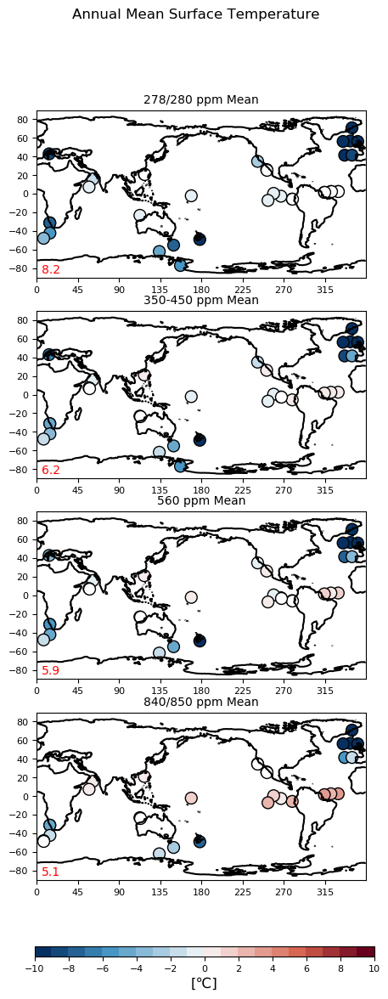

In [101]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-10,10,21)


ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf=plt.scatter(MidMioSSTLon_plot, MidMioSSTLat_plot, 100, c=SSTbias_MID_MIO_EXPS_278and280_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MID_MIO_EXPS_278and280_MEAN)):
                        if SSTbias_MID_MIO_EXPS_278and280_MEAN[j]==0:
                            cf2=plt.scatter(MidMioSSTLon_plot[j], MidMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
                ax.text(5, -85, np.around(MID_MIO_SSTbias_EXPS_278and280_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 1:
                cf=plt.scatter(MidMioSSTLon_plot, MidMioSSTLat_plot, 100, c=SSTbias_MID_MIO_EXPS_350and450_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MID_MIO_EXPS_350and450_MEAN)):
                        if SSTbias_MID_MIO_EXPS_350and450_MEAN[j]==0:
                            cf2=plt.scatter(MidMioSSTLon_plot[j], MidMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MID_MIO_SSTbias_EXPS_350and450_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 2:
                cf=plt.scatter(MidMioSSTLon_plot, MidMioSSTLat_plot, 100, c=SSTbias_MID_MIO_EXPS_560_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MID_MIO_EXPS_560_MEAN)):
                        if SSTbias_MID_MIO_EXPS_560_MEAN[j]==0:
                            cf2=plt.scatter(MidMioSSTLon_plot[j], MidMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MID_MIO_SSTbias_EXPS_560_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 3:
                cf=plt.scatter(MidMioSSTLon_plot, MidMioSSTLat_plot, 100, c=SSTbias_MID_MIO_EXPS_840and850_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MID_MIO_EXPS_840and850_MEAN)):
                        if SSTbias_MID_MIO_EXPS_840and850_MEAN[j]==0:
                            cf2=plt.scatter(MidMioSSTLon_plot[j], MidMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
                ax.text(5, -85, np.around(MID_MIO_SSTbias_EXPS_840and850_MEAN_rmse, decimals=1), fontsize=10, color='red')
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')

   
plt.savefig('MidMioceneSSTbias_ByCO2_SurfaceTemp.pdf', format='pdf')      

**Plot Mid Miocene Surface Temperature bias**

In [102]:
filename='Data_02_28_20_clean_MidMioceneSlab_MAT.csv'
MIDMIO_MAT = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#MIDMIO_MAT

In [103]:
MIDMIO_MAT2=MIDMIO_MAT.values[0:-1,:]
MidMioMATLat=np.asarray(MIDMIO_MAT2[:,0],dtype=np.float64)
MidMioMATLon=np.asarray(MIDMIO_MAT2[:,4],dtype=np.float64)
MidMioMAT=np.asarray(MIDMIO_MAT2[:,2],dtype=np.float64)
MidMioMAT_uncert=np.asarray(MIDMIO_MAT2[:,3],dtype=np.float64)

In [104]:
MidMioMAT_max=MidMioMAT+MidMioMAT_uncert
MidMioMAT_min=MidMioMAT-MidMioMAT_uncert

In [105]:
Lon_index_midmioMAT=[]
Lat_index_midmioMAT=[]
for i in range(0, len(MidMioMAT)):
            Lon_temp=np.where((lon>=MidMioMATLon[i]-0.5) & (lon<=MidMioMATLon[i]+0.5))[0]
            Lon_index_midmioMAT.append(Lon_temp)
            Lat_temp=np.where((lat>=MidMioMATLat[i]-0.5) & (lat<=MidMioMATLat[i]+0.5))[0]
            Lat_index_midmioMAT.append(Lat_temp)

In [106]:
LTS_MID_MIO_EXPS_C=LTS_MID_MIO_EXPS
#LTS_MID_MIO_EXPS_C=LTS_MID_MIO_EXPS-273.15
# Already in deg C
#plt.contourf(TS_ANO_MID_MIO_EXPS.lon, TS_ANO_MID_MIO_EXPS.lat,LTS_MID_MIO_EXPS[0,:,:])
#plt.colorbar(fraction=0.02)

In [107]:
# -1,1  0,1  1,1
# -1,0  0,0  1,0
# -1,-1 0,-1 1,-1
LTS_MID_MIO_EXPS_max=np.empty([0,len(MidMioMAT)])
LTS_MID_MIO_EXPS_min=np.empty([0,len(MidMioMAT)])
for j in range(0, len(LTS_MID_MIO_EXPS)):
    LTS_MID_MIO_EXPS_max_run=[]
    LTS_MID_MIO_EXPS_min_run=[]
    for i in range(0, len(MidMioMAT)):
                LTS_MID_MIO_EXPS_min_temp=np.nanmin([LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]+1,Lon_index_midmioMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]+1,Lon_index_midmioMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]+1,Lon_index_midmioMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i],Lon_index_midmioMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i],Lon_index_midmioMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i],Lon_index_midmioMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]-1,Lon_index_midmioMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]-1,Lon_index_midmioMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]-1,Lon_index_midmioMAT[i]+1], \
                ])
                LTS_MID_MIO_EXPS_max_temp=np.nanmax([LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]+1,Lon_index_midmioMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]+1,Lon_index_midmioMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]+1,Lon_index_midmioMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i],Lon_index_midmioMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i],Lon_index_midmioMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i],Lon_index_midmioMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]-1,Lon_index_midmioMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]-1,Lon_index_midmioMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_midmioMAT[i]-1,Lon_index_midmioMAT[i]+1], \
                ])
        
                LTS_MID_MIO_EXPS_max_run.append(LTS_MID_MIO_EXPS_max_temp)
                LTS_MID_MIO_EXPS_min_run.append(LTS_MID_MIO_EXPS_min_temp)
    del LTS_MID_MIO_EXPS_max_temp
    del LTS_MID_MIO_EXPS_min_temp
    LTS_MID_MIO_EXPS_max = np.append(LTS_MID_MIO_EXPS_max,[LTS_MID_MIO_EXPS_max_run], axis=0)
    LTS_MID_MIO_EXPS_min = np.append(LTS_MID_MIO_EXPS_min,[LTS_MID_MIO_EXPS_min_run], axis=0)
    

In [108]:
MID_MIO_LTSbias=np.empty([0,len(MidMioMAT)])
for j in range(0, len(LTS_MID_MIO_EXPS)):
    LTSbias_run=[]
    for i in range(0, len(MidMioMAT)):
        diff1=MidMioMAT_min[i]-LTS_MID_MIO_EXPS_max[j,i]
        diff2=LTS_MID_MIO_EXPS_min[j,i]-MidMioMAT_max[i]
        if diff1>0:
            LTSbias_temp=-diff1 
        elif diff2>0:
            LTSbias_temp=diff2
        elif np.isnan(diff2)==True:
            LTSbias_temp=float('nan')
        else:
            LTSbias_temp=0
        LTSbias_run.append(LTSbias_temp)
    del LTSbias_temp
    MID_MIO_LTSbias=np.append(MID_MIO_LTSbias,[LTSbias_run], axis=0)

In [109]:
MID_MIO_LTSbias_mean=np.nanmean(MID_MIO_LTSbias, axis=1)
MID_MIO_LTSbias_rmse=np.sqrt(np.nanmean(np.square(MID_MIO_LTSbias), axis=1))

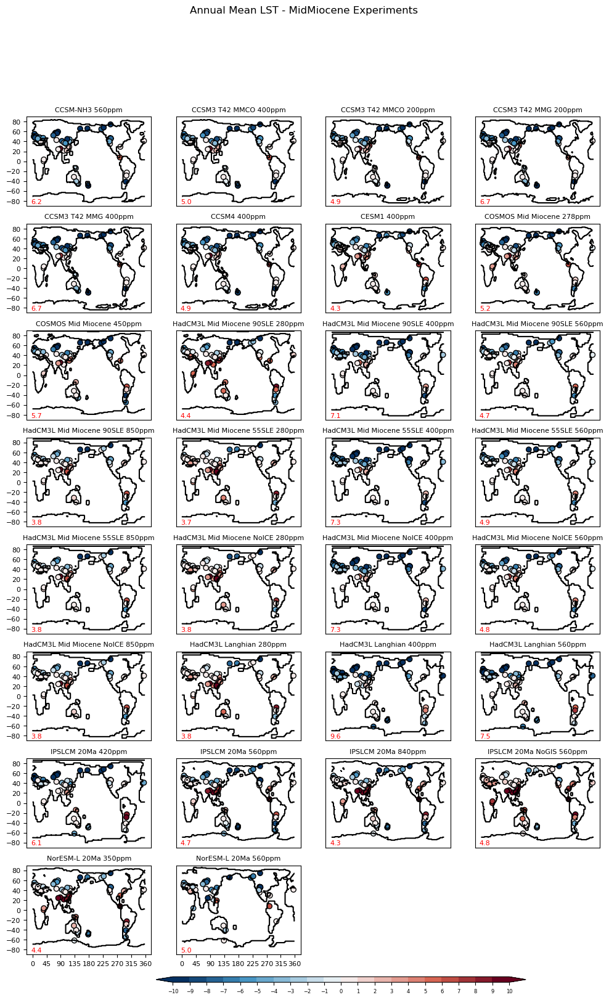

In [110]:
  
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
            ax = fig.add_subplot(nrows, ncols, i+1)
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            ax.contour(TS_ANO_MID_MIO_EXPS.lon, TS_ANO_MID_MIO_EXPS.lat, MIDMIO_coast, levels=[0], colors='k', linestyles='-')
            
            cf=plt.scatter(MidMioMATLon, MidMioMATLat, c=MID_MIO_LTSbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap)
                    
            ax.text(-5, -85, np.around(MID_MIO_LTSbias_rmse[i], decimals=1), fontsize=8, color='red')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal', extend='both')
#colorbar.set_label('%s' % '[\u2103]',size=12)

# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean LST - MidMiocene Experiments')

   
plt.savefig('MidMiocene_LTS_bias.pdf', format='pdf')    
plt.savefig('MidMiocene_LTS_bias.eps', format='eps')
plt.savefig('MidMiocene_LTS.png', format='png')    

**Plot MMM Bias in Mid Miocene Surface Temperature as a function of CO2**

In [111]:
ppm278_index = np.where(MID_MIO_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
LTS_MID_MIO_EXPS_278=LTS_MID_MIO_EXPS[ppm278_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_278.shape
LTSbias_MID_MIO_EXPS_278=MID_MIO_LTSbias[ppm278_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_278=LTS_MID_MIO_EXPS_max[ppm278_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_278=LTS_MID_MIO_EXPS_min[ppm278_indexls[0,:],:]

ppm280_index = np.where(MID_MIO_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
LTS_MID_MIO_EXPS_280=LTS_MID_MIO_EXPS[ppm280_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_280.shape
LTSbias_MID_MIO_EXPS_280=MID_MIO_LTSbias[ppm280_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_280=LTS_MID_MIO_EXPS_max[ppm280_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_280=LTS_MID_MIO_EXPS_min[ppm280_indexls[0,:],:]

LTS_MID_MIO_EXPS_278and280 = np.concatenate((LTS_MID_MIO_EXPS_278, LTS_MID_MIO_EXPS_280),  axis=0)
LTS_MID_MIO_EXPS_278and280_MEAN = np.nanmean(LTS_MID_MIO_EXPS_278and280, axis=0)
LTS_MID_MIO_EXPS_278and280_STD = np.std(LTS_MID_MIO_EXPS_278and280, axis=0)
#LTS_MID_MIO_EXPS_278and280.shape
LTSbias_MID_MIO_EXPS_278and280 = np.concatenate((LTSbias_MID_MIO_EXPS_278, LTSbias_MID_MIO_EXPS_280),  axis=0)
LTSbias_MID_MIO_EXPS_278and280_MEAN = np.nanmean(LTSbias_MID_MIO_EXPS_278and280, axis=0)
LTSbias_MID_MIO_EXPS_278and280_STD = np.std(LTSbias_MID_MIO_EXPS_278and280, axis=0)
LTS_MID_MIO_EXPS_max_278and280 = np.concatenate((LTS_MID_MIO_EXPS_max_278, LTS_MID_MIO_EXPS_max_280),  axis=0)
LTS_MID_MIO_EXPS_min_278and280 = np.concatenate((LTS_MID_MIO_EXPS_min_278, LTS_MID_MIO_EXPS_min_280),  axis=0)


ppm350_index = np.where(MID_MIO_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
LTS_MID_MIO_EXPS_350=LTS_MID_MIO_EXPS[ppm350_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_350.shape
LTSbias_MID_MIO_EXPS_350=MID_MIO_LTSbias[ppm350_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_350=LTS_MID_MIO_EXPS_max[ppm350_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_350=LTS_MID_MIO_EXPS_min[ppm350_indexls[0,:],:]

ppm400_index = np.where(MID_MIO_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
LTS_MID_MIO_EXPS_400=LTS_MID_MIO_EXPS[ppm400_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_400.shape
LTSbias_MID_MIO_EXPS_400=MID_MIO_LTSbias[ppm400_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_400=LTS_MID_MIO_EXPS_max[ppm400_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_400=LTS_MID_MIO_EXPS_min[ppm400_indexls[0,:],:]

ppm450_index = np.where(MID_MIO_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
LTS_MID_MIO_EXPS_450=LTS_MID_MIO_EXPS[ppm450_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_450.shape
LTSbias_MID_MIO_EXPS_450=MID_MIO_LTSbias[ppm450_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_450=LTS_MID_MIO_EXPS_max[ppm450_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_450=LTS_MID_MIO_EXPS_min[ppm450_indexls[0,:],:]

LTS_MID_MIO_EXPS_350and450 = np.concatenate((LTS_MID_MIO_EXPS_350, LTS_MID_MIO_EXPS_400, LTS_MID_MIO_EXPS_450),  axis=0)
LTS_MID_MIO_EXPS_350and450_MEAN = np.nanmean(LTS_MID_MIO_EXPS_350and450, axis=0)
LTS_MID_MIO_EXPS_350and450_STD = np.std(LTS_MID_MIO_EXPS_350and450, axis=0)
#LTS_MID_MIO_EXPS_350and400.shape
LTSbias_MID_MIO_EXPS_350and450 = np.concatenate((LTSbias_MID_MIO_EXPS_350, LTSbias_MID_MIO_EXPS_400, LTSbias_MID_MIO_EXPS_450),  axis=0)
LTSbias_MID_MIO_EXPS_350and450_MEAN = np.nanmean(LTSbias_MID_MIO_EXPS_350and450, axis=0)
LTSbias_MID_MIO_EXPS_350and450_STD = np.std(LTSbias_MID_MIO_EXPS_350and450, axis=0)
LTS_MID_MIO_EXPS_max_350and450 = np.concatenate((LTS_MID_MIO_EXPS_max_350, LTS_MID_MIO_EXPS_max_400, LTS_MID_MIO_EXPS_max_450),  axis=0)
LTS_MID_MIO_EXPS_min_350and450 = np.concatenate((LTS_MID_MIO_EXPS_min_350, LTS_MID_MIO_EXPS_min_400, LTS_MID_MIO_EXPS_max_450),  axis=0)

ppm560_index = np.where(MID_MIO_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
LTS_MID_MIO_EXPS_560=LTS_MID_MIO_EXPS[ppm560_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_560.shape
LTSbias_MID_MIO_EXPS_560=MID_MIO_LTSbias[ppm560_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_560=LTS_MID_MIO_EXPS_max[ppm560_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_560=LTS_MID_MIO_EXPS_min[ppm560_indexls[0,:],:]

LTS_MID_MIO_EXPS_560_MEAN = np.nanmean(LTS_MID_MIO_EXPS_560, axis=0)
LTS_MID_MIO_EXPS_560_STD = np.std(LTS_MID_MIO_EXPS_560, axis=0)
LTSbias_MID_MIO_EXPS_560_MEAN = np.nanmean(LTSbias_MID_MIO_EXPS_560, axis=0)
LTSbias_MID_MIO_EXPS_560_STD = np.std(LTSbias_MID_MIO_EXPS_560, axis=0)

ppm840_index = np.where(MID_MIO_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
LTS_MID_MIO_EXPS_840=LTS_MID_MIO_EXPS[ppm840_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_840.shape
LTSbias_MID_MIO_EXPS_840=MID_MIO_LTSbias[ppm840_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_840=LTS_MID_MIO_EXPS_max[ppm840_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_840=LTS_MID_MIO_EXPS_min[ppm840_indexls[0,:],:]

ppm850_index = np.where(MID_MIO_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
LTS_MID_MIO_EXPS_850=LTS_MID_MIO_EXPS[ppm850_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_850.shape
LTSbias_MID_MIO_EXPS_850=MID_MIO_LTSbias[ppm850_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_850=LTS_MID_MIO_EXPS_max[ppm850_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_850=LTS_MID_MIO_EXPS_min[ppm850_indexls[0,:],:]

LTS_MID_MIO_EXPS_840and850 = np.concatenate((LTS_MID_MIO_EXPS_840, LTS_MID_MIO_EXPS_850),  axis=0)
LTS_MID_MIO_EXPS_840and850_MEAN = np.nanmean(LTS_MID_MIO_EXPS_840and850, axis=0)
LTS_MID_MIO_EXPS_840and850_STD = np.std(LTS_MID_MIO_EXPS_840and850, axis=0)
LTSbias_MID_MIO_EXPS_840and850 = np.concatenate((LTSbias_MID_MIO_EXPS_840, LTSbias_MID_MIO_EXPS_850),  axis=0)
LTSbias_MID_MIO_EXPS_840and850_MEAN = np.nanmean(LTSbias_MID_MIO_EXPS_840and850, axis=0)
LTSbias_MID_MIO_EXPS_840and850_STD = np.std(LTSbias_MID_MIO_EXPS_840and850, axis=0)
#LTS_MID_MIO_EXPS_840and850.shape
LTS_MID_MIO_EXPS_max_840and850 = np.concatenate((LTS_MID_MIO_EXPS_max_840, LTS_MID_MIO_EXPS_max_850),  axis=0)
LTS_MID_MIO_EXPS_min_840and850 = np.concatenate((LTS_MID_MIO_EXPS_min_840, LTS_MID_MIO_EXPS_min_850),  axis=0)

In [112]:
MID_MIO_LTSbias_EXPS_278and280_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MID_MIO_EXPS_278and280_MEAN), axis=0))
MID_MIO_LTSbias_EXPS_350and450_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MID_MIO_EXPS_350and450_MEAN), axis=0))
MID_MIO_LTSbias_EXPS_560_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MID_MIO_EXPS_560_MEAN), axis=0))
MID_MIO_LTSbias_EXPS_840and850_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MID_MIO_EXPS_840and850_MEAN), axis=0))

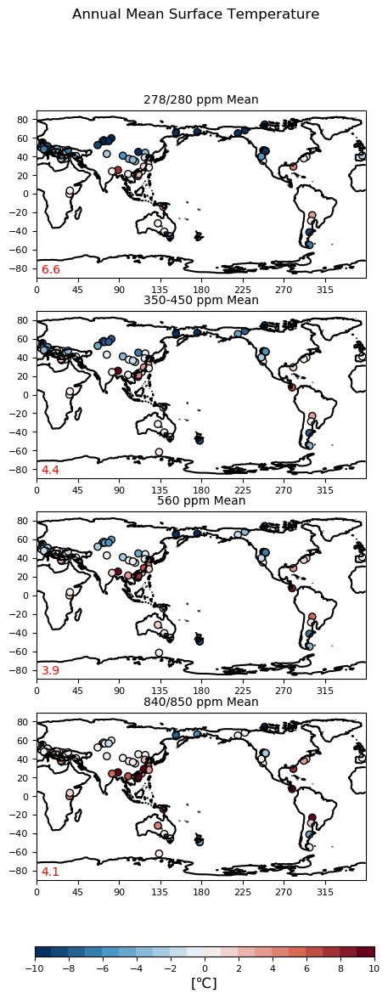

In [113]:
  
ncols = 1
nrows = 4

contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf=plt.scatter(MidMioMATLon, MidMioMATLat, c=LTSbias_MID_MIO_EXPS_278and280_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
                ax.text(5, -85, np.around(MID_MIO_LTSbias_EXPS_278and280_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 1:
                cf=plt.scatter(MidMioMATLon, MidMioMATLat, c=LTSbias_MID_MIO_EXPS_350and450_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MID_MIO_LTSbias_EXPS_350and450_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 2:
                cf=plt.scatter(MidMioMATLon, MidMioMATLat, c=LTSbias_MID_MIO_EXPS_560_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MID_MIO_LTSbias_EXPS_560_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 3:
                cf=plt.scatter(MidMioMATLon, MidMioMATLat, c=LTSbias_MID_MIO_EXPS_840and850_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
                ax.text(5, -85, np.around(MID_MIO_LTSbias_EXPS_840and850_MEAN_rmse, decimals=1), fontsize=10, color='red')
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            #ax.contour(Frigola_MMCO.topo.lon,Frigola_MMCO.topo.lat,Frigola_MMCO.topo, levels=[0], colors='k', linestyles='-')
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')

   
plt.savefig('MidMioceneLSTbias_ByCO2_SurfaceTemp.pdf', format='pdf')      

**Plot Late Miocene SST bias**

In [114]:
filename='LateMiocene_SST_v2.csv'
LATEMIO_SST = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#LATEMIO_SST

In [115]:
LATEMIO_SST2=LATEMIO_SST.values[:,:]
LATEMioSSTLat=np.asarray(LATEMIO_SST2[:,3],dtype=np.float64)
LATEMioSSTLon180=np.asarray(LATEMIO_SST2[:,4],dtype=np.float64)
LATEMioSSTLon=np.asarray(LATEMIO_SST2[:,5],dtype=np.float64)
LATEMioSST=np.asarray(LATEMIO_SST2[:,1],dtype=np.float64)
LATEMioSST_ucert=np.asarray(LATEMIO_SST2[:,2],dtype=np.float64)

In [116]:
LATEMioSST_max=LATEMioSST+LATEMioSST_ucert/2
LATEMioSST_min=LATEMioSST-LATEMioSST_ucert/2

In [117]:
LateMioSSTSiteName=LATEMIO_SST2[:,0]

In [118]:
# Adjust to avoid overlap in plots
LATEMioSSTLon180_plot=np.asarray(LATEMIO_SST2[:,4],dtype=np.float64)
LATEMioSSTLon_plot=np.asarray(LATEMIO_SST2[:,5],dtype=np.float64)

LATEMioSSTLon_plot[0]=LATEMioSSTLon[0]+5 #DSDP594Uk37
LATEMioSSTLon_plot[12]=LATEMioSSTLon[12]+8 # 850Tex86
LATEMioSSTLon_plot[29]=LATEMioSSTLon[29]+10 #1125Uk37
LATEMioSSTLon_plot[2]=LATEMioSSTLon[2]+8 #608Tex862018
LATEMioSSTLon_plot[3]=LATEMioSSTLon[3]-8 #608Tex862020
LATEMioSSTLon_plot[21]=LATEMioSSTLon[21]+8 #982Tex86
LATEMioSSTLon_plot[22]=LATEMioSSTLon[22]-8 #982Uk37Super
LATEMioSSTLon_plot[31]=LATEMioSSTLon[31]+8 #1146MgCASteinke
#LATEMioSSTLon_plot[37]=LATEMioSSTLon[37]-8 #U1338MgCa
LATEMioSSTLon_plot[18]=LATEMioSSTLon[18]-8 #925Tex86
LATEMioSSTLon_plot[10]=LATEMioSSTLon[10]-8 #806MgCa
LATEMioSSTLon_plot[19]=LATEMioSSTLon[19]+8 #926

LATEMioSSTLon180_plot[0]=LATEMioSSTLon180[0]+5 #DSDP594Uk37
LATEMioSSTLon180_plot[12]=LATEMioSSTLon180[12]+8 # 850Tex86
LATEMioSSTLon180_plot[29]=LATEMioSSTLon180[29]+10 #1125Uk37
LATEMioSSTLon180_plot[2]=LATEMioSSTLon180[2]+10 #608Tex862018
LATEMioSSTLon180_plot[3]=LATEMioSSTLon180[3]-10 #608Tex862020
LATEMioSSTLon180_plot[21]=LATEMioSSTLon180[21]+9 #982Tex86
LATEMioSSTLon180_plot[22]=LATEMioSSTLon180[22]-9 #982Uk37Super
LATEMioSSTLon180_plot[31]=LATEMioSSTLon180[31]+8 #1146MgCASteinke
#LATEMioSSTLon180_plot[37]=LATEMioSSTLon180[37]-8 #U1338MgCa
LATEMioSSTLon180_plot[18]=LATEMioSSTLon180[18]-8 #925Tex86
LATEMioSSTLon180_plot[10]=LATEMioSSTLon180[10]-8 #806MgCa
LATEMioSSTLon180_plot[19]=LATEMioSSTLon180[19]+8 #926

LATEMioSSTLat_plot=np.asarray(LATEMIO_SST2[:,3],dtype=np.float64)
LATEMioSSTLat_plot[11]=LATEMioSSTLat[11]-5 #846Uk37
LATEMioSSTLat_plot[34]=LATEMioSSTLat[34]+5 #1241Uk37
LATEMioSSTLat_plot[8]=LATEMioSSTLat[8]-2 #769Tex86

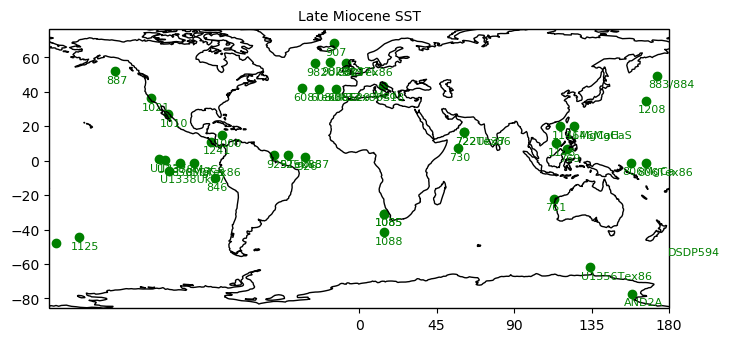

In [119]:
fig = plt.figure(figsize=(8, 6), dpi=100)

Site_lon=LATEMioSSTLon180_plot
Site_lat=LATEMioSSTLat_plot
Site_Name=LateMioSSTSiteName

ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_title('Late Miocene SST', fontsize=10)
ax.set_xticks(xtick_levels)
ax.set_yticks(ytick_levels)                
ax.coastlines()


#Add site locations
ax.scatter(Site_lon, Site_lat, c='g', marker='o', edgecolors='g')
for i, txt in enumerate(Site_Name):
    ax.annotate(txt, (Site_lon[i]-5, Site_lat[i]-7), fontsize=8, color='g')

   
plt.savefig('LateMioSSTSiteLocations.pdf', format='pdf')    
plt.savefig('LateioSSTSiteLocations.eps', format='eps')
plt.savefig('LateMioSSTSiteLocations.png', format='png')    

In [120]:
Lon_index_LATEmiosst=[]
Lat_index_LATEmiosst=[]
for i in range(0, len(LATEMioSST)):
            Lon_temp=np.where((lon>=LATEMioSSTLon[i]-0.5) & (lon<=LATEMioSSTLon[i]+0.5))[0]
            Lon_index_LATEmiosst.append(Lon_temp)
            Lat_temp=np.where((lat>=LATEMioSSTLat[i]-0.5) & (lat<=LATEMioSSTLat[i]+0.5))[0]
            Lat_index_LATEmiosst.append(Lat_temp)

In [121]:
# -1,1  0,1  1,1
# -1,0  0,0  1,0
# -1,-1 0,-1 1,-1
SST_LATE_MIO_EXPS_max=np.empty([0,len(LATEMioSST)])
SST_LATE_MIO_EXPS_min=np.empty([0,len(LATEMioSST)])
for j in range(0, len(SST_LATE_MIO_EXPS)):
    SST_LATE_MIO_EXPS_max_run=[]
    SST_LATE_MIO_EXPS_min_run=[]
    for i in range(0, len(LATEMioSST)):
                SST_LATE_MIO_EXPS_min_temp=np.nanmin([SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]+1,Lon_index_LATEmiosst[i]-1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]+1,Lon_index_LATEmiosst[i]], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]+1,Lon_index_LATEmiosst[i]+1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i],Lon_index_LATEmiosst[i]-1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i],Lon_index_LATEmiosst[i]], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i],Lon_index_LATEmiosst[i]+1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]-1,Lon_index_LATEmiosst[i]-1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]-1,Lon_index_LATEmiosst[i]], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]-1,Lon_index_LATEmiosst[i]+1], \
                ])
                SST_LATE_MIO_EXPS_max_temp=np.nanmax([SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]+1,Lon_index_LATEmiosst[i]-1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]+1,Lon_index_LATEmiosst[i]], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]+1,Lon_index_LATEmiosst[i]+1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i],Lon_index_LATEmiosst[i]-1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i],Lon_index_LATEmiosst[i]], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i],Lon_index_LATEmiosst[i]+1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]-1,Lon_index_LATEmiosst[i]-1], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]-1,Lon_index_LATEmiosst[i]], \
                SST_LATE_MIO_EXPS[j,Lat_index_LATEmiosst[i]-1,Lon_index_LATEmiosst[i]+1], \
                ])
        
                SST_LATE_MIO_EXPS_max_run.append(SST_LATE_MIO_EXPS_max_temp)
                SST_LATE_MIO_EXPS_min_run.append(SST_LATE_MIO_EXPS_min_temp)
    del SST_LATE_MIO_EXPS_max_temp
    del SST_LATE_MIO_EXPS_min_temp
    SST_LATE_MIO_EXPS_max = np.append(SST_LATE_MIO_EXPS_max,[SST_LATE_MIO_EXPS_max_run], axis=0)
    SST_LATE_MIO_EXPS_min = np.append(SST_LATE_MIO_EXPS_min,[SST_LATE_MIO_EXPS_min_run], axis=0)
    

In [122]:
LATE_MIO_SSTbias=np.empty([0,len(LATEMioSST)])
for j in range(0, len(SST_LATE_MIO_EXPS)):
    SSTbias_run=[]
    for i in range(0, len(LATEMioSST)):
        diff1=LATEMioSST_min[i]-SST_LATE_MIO_EXPS_max[j,i]
        diff2=SST_LATE_MIO_EXPS_min[j,i]-LATEMioSST_max[i]
        if diff1>0:
            SSTbias_temp=-diff1 
        elif diff2>0:
            SSTbias_temp=diff2 
        elif np.isnan(diff2)==True:
            SSTbias_temp=float('nan')
        else:
            SSTbias_temp=0
        SSTbias_run.append(SSTbias_temp)
    del SSTbias_temp
    LATE_MIO_SSTbias=np.append(LATE_MIO_SSTbias,[SSTbias_run], axis=0)

In [123]:
LATE_MIO_SSTbias_mean=np.nanmean(LATE_MIO_SSTbias, axis=1)

In [124]:
LATE_MIO_SSTbias_rmse=np.sqrt(np.nanmean(np.square(LATE_MIO_SSTbias), axis=1))

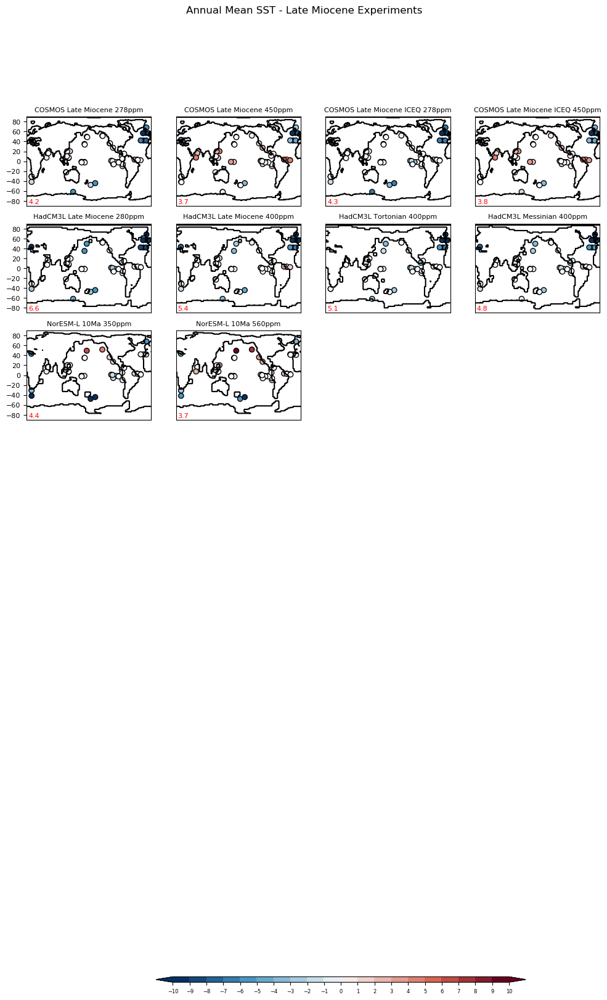

In [125]:
  
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(LATE_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the LATE Miocene Experiments
            ax = fig.add_subplot(nrows, ncols, i+1)
            ax.set_title(LATE_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)
                       
            LATEMIO_coast=landmask_LATE_MIO_EXPS[i,:,:]*1
            ax.contour(TS_ANO_LATE_MIO_EXPS.lon, TS_ANO_LATE_MIO_EXPS.lat, LATEMIO_coast, levels=[0], colors='k', linestyles='-')
            
            cf=plt.scatter(LATEMioSSTLon_plot, LATEMioSSTLat_plot, c=LATE_MIO_SSTbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap)

            for j in range(0, len(LATE_MIO_SSTbias[i,:])):
                if LATE_MIO_SSTbias[i,j]==0:
                    cf2=plt.scatter(LATEMioSSTLon_plot[j], LATEMioSSTLat[j],facecolor='white',edgecolors='k')
                    
            ax.text(5, -85, np.around(LATE_MIO_SSTbias_rmse[i], decimals=1), fontsize=8, color='red')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal', extend='both')


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST - Late Miocene Experiments')
   
plt.savefig('LATEMiocene_SST_bias.pdf', format='pdf')    
plt.savefig('LATEMiocene_SST_bias.eps', format='eps')
plt.savefig('LATEMiocene_SST_bias.png', format='png')    

**Plot MMM Bias in Late Miocene SST as a function of CO2**

In [126]:
ppm278_index = np.where(LATE_MIO_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
SST_LATE_MIO_EXPS_278=SST_LATE_MIO_EXPS[ppm278_indexls[0,:],:,:]
#SST_LATE_MIO_EXPS_278.shape
SSTbias_LATE_MIO_EXPS_278=LATE_MIO_SSTbias[ppm278_indexls[0,:],:]
SST_LATE_MIO_EXPS_max_278=SST_LATE_MIO_EXPS_max[ppm278_indexls[0,:],:]
SST_LATE_MIO_EXPS_min_278=SST_LATE_MIO_EXPS_min[ppm278_indexls[0,:],:]

ppm280_index = np.where(LATE_MIO_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
SST_LATE_MIO_EXPS_280=SST_LATE_MIO_EXPS[ppm280_indexls[0,:],:,:]
#SST_LATE_MIO_EXPS_280.shape
SSTbias_LATE_MIO_EXPS_280=LATE_MIO_SSTbias[ppm280_indexls[0,:],:]
SST_LATE_MIO_EXPS_max_280=SST_LATE_MIO_EXPS_max[ppm280_indexls[0,:],:]
SST_LATE_MIO_EXPS_min_280=SST_LATE_MIO_EXPS_min[ppm280_indexls[0,:],:]

SST_LATE_MIO_EXPS_278and280 = np.concatenate((SST_LATE_MIO_EXPS_278, SST_LATE_MIO_EXPS_280),  axis=0)
SST_LATE_MIO_EXPS_278and280_MEAN = np.nanmean(SST_LATE_MIO_EXPS_278and280, axis=0)
SST_LATE_MIO_EXPS_278and280_STD = np.std(SST_LATE_MIO_EXPS_278and280, axis=0)
#SST_LATE_MIO_EXPS_278and280.shape
SSTbias_LATE_MIO_EXPS_278and280 = np.concatenate((SSTbias_LATE_MIO_EXPS_278, SSTbias_LATE_MIO_EXPS_280),  axis=0)
SSTbias_LATE_MIO_EXPS_278and280_MEAN = np.nanmean(SSTbias_LATE_MIO_EXPS_278and280, axis=0)
SSTbias_LATE_MIO_EXPS_278and280_STD = np.std(SSTbias_LATE_MIO_EXPS_278and280, axis=0)
SST_LATE_MIO_EXPS_max_278and280 = np.concatenate((SST_LATE_MIO_EXPS_max_278, SST_LATE_MIO_EXPS_max_280),  axis=0)
SST_LATE_MIO_EXPS_min_278and280 = np.concatenate((SST_LATE_MIO_EXPS_min_278, SST_LATE_MIO_EXPS_min_280),  axis=0)


ppm350_index = np.where(LATE_MIO_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
SST_LATE_MIO_EXPS_350=SST_LATE_MIO_EXPS[ppm350_indexls[0,:],:,:]
#SST_LATE_MIO_EXPS_350.shape
#plt.contourf(SST_LATE_MIO_EXPS_350[0,:,:])
SSTbias_LATE_MIO_EXPS_350=LATE_MIO_SSTbias[ppm350_indexls[0,:],:]
SST_LATE_MIO_EXPS_max_350=SST_LATE_MIO_EXPS_max[ppm350_indexls[0,:],:]
SST_LATE_MIO_EXPS_min_350=SST_LATE_MIO_EXPS_min[ppm350_indexls[0,:],:]

ppm400_index = np.where(LATE_MIO_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
SST_LATE_MIO_EXPS_400=SST_LATE_MIO_EXPS[ppm400_indexls[0,:],:,:]
#SST_LATE_MIO_EXPS_400.shape
SSTbias_LATE_MIO_EXPS_400=LATE_MIO_SSTbias[ppm400_indexls[0,:],:]
SST_LATE_MIO_EXPS_max_400=SST_LATE_MIO_EXPS_max[ppm400_indexls[0,:],:]
SST_LATE_MIO_EXPS_min_400=SST_LATE_MIO_EXPS_min[ppm400_indexls[0,:],:]

ppm450_index = np.where(LATE_MIO_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
SST_LATE_MIO_EXPS_450=SST_LATE_MIO_EXPS[ppm450_indexls[0,:],:,:]
#SST_LATE_MIO_EXPS_450.shape
#plt.contourf(SST_LATE_MIO_EXPS_450[0,:,:])
SSTbias_LATE_MIO_EXPS_450=LATE_MIO_SSTbias[ppm450_indexls[0,:],:]
SST_LATE_MIO_EXPS_max_450=SST_LATE_MIO_EXPS_max[ppm450_indexls[0,:],:]
SST_LATE_MIO_EXPS_min_450=SST_LATE_MIO_EXPS_min[ppm450_indexls[0,:],:]

SST_LATE_MIO_EXPS_350and450 = np.concatenate((SST_LATE_MIO_EXPS_350, SST_LATE_MIO_EXPS_400, SST_LATE_MIO_EXPS_450),  axis=0)
SST_LATE_MIO_EXPS_350and450_MEAN = np.nanmean(SST_LATE_MIO_EXPS_350and450, axis=0)
SST_LATE_MIO_EXPS_350and450_STD = np.std(SST_LATE_MIO_EXPS_350and450, axis=0)
#SST_LATE_MIO_EXPS_350and400.shape
SSTbias_LATE_MIO_EXPS_350and450 = np.concatenate((SSTbias_LATE_MIO_EXPS_350, SSTbias_LATE_MIO_EXPS_400, SSTbias_LATE_MIO_EXPS_450),  axis=0)
SSTbias_LATE_MIO_EXPS_350and450_MEAN = np.nanmean(SSTbias_LATE_MIO_EXPS_350and450, axis=0)
SSTbias_LATE_MIO_EXPS_350and450_STD = np.std(SSTbias_LATE_MIO_EXPS_350and450, axis=0)
SST_LATE_MIO_EXPS_max_350and450 = np.concatenate((SST_LATE_MIO_EXPS_max_350, SST_LATE_MIO_EXPS_max_400, SST_LATE_MIO_EXPS_max_450),  axis=0)
SST_LATE_MIO_EXPS_min_350and450 = np.concatenate((SST_LATE_MIO_EXPS_min_350, SST_LATE_MIO_EXPS_min_400, SST_LATE_MIO_EXPS_max_450),  axis=0)

ppm560_index = np.where(LATE_MIO_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
SST_LATE_MIO_EXPS_560=SST_LATE_MIO_EXPS[ppm560_indexls[0,:],:,:]
#SST_LATE_MIO_EXPS_560.shape
#plt.contourf(SST_LATE_MIO_EXPS_560[0,:,:])
SSTbias_LATE_MIO_EXPS_560=LATE_MIO_SSTbias[ppm560_indexls[0,:],:]
SST_LATE_MIO_EXPS_max_560=SST_LATE_MIO_EXPS_max[ppm560_indexls[0,:],:]
SST_LATE_MIO_EXPS_min_560=SST_LATE_MIO_EXPS_min[ppm560_indexls[0,:],:]

SST_LATE_MIO_EXPS_560_MEAN = np.nanmean(SST_LATE_MIO_EXPS_560, axis=0)
SST_LATE_MIO_EXPS_560_STD = np.std(SST_LATE_MIO_EXPS_560, axis=0)
SSTbias_LATE_MIO_EXPS_560_MEAN = np.nanmean(SSTbias_LATE_MIO_EXPS_560, axis=0)
SSTbias_LATE_MIO_EXPS_560_STD = np.std(SSTbias_LATE_MIO_EXPS_560, axis=0)

In [127]:
LATE_MIO_SSTbias_EXPS_278and280_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_LATE_MIO_EXPS_278and280_MEAN), axis=0))
LATE_MIO_SSTbias_EXPS_350and450_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_LATE_MIO_EXPS_350and450_MEAN), axis=0))
LATE_MIO_SSTbias_EXPS_560_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_LATE_MIO_EXPS_560_MEAN), axis=0))

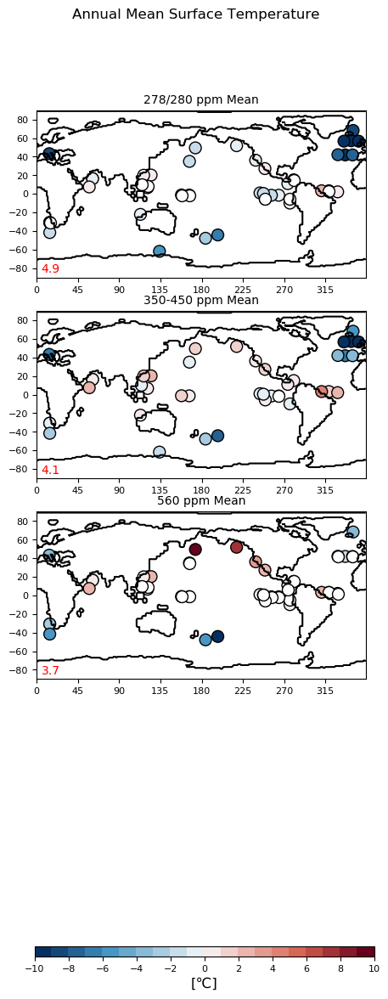

In [128]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-10,10,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

for i in range(0, 3): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf=plt.scatter(LATEMioSSTLon_plot, LATEMioSSTLat_plot, 100, c=SSTbias_LATE_MIO_EXPS_278and280_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_LATE_MIO_EXPS_278and280_MEAN)):
                        if SSTbias_LATE_MIO_EXPS_278and280_MEAN[j]==0:
                            cf2=plt.scatter(LATEMioSSTLon_plot[j], LATEMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
                ax.text(5, -85, np.around(LATE_MIO_SSTbias_EXPS_278and280_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 1:
                cf=plt.scatter(LATEMioSSTLon_plot, LATEMioSSTLat_plot, 100, c=SSTbias_LATE_MIO_EXPS_350and450_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_LATE_MIO_EXPS_350and450_MEAN)):
                        if SSTbias_LATE_MIO_EXPS_350and450_MEAN[j]==0:
                            cf2=plt.scatter(LATEMioSSTLon_plot[j], LATEMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(LATE_MIO_SSTbias_EXPS_350and450_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 2:
                cf=plt.scatter(LATEMioSSTLon_plot, LATEMioSSTLat_plot, 100, c=SSTbias_LATE_MIO_EXPS_560_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_LATE_MIO_EXPS_560_MEAN)):
                        if SSTbias_LATE_MIO_EXPS_560_MEAN[j]==0:
                            cf2=plt.scatter(LATEMioSSTLon_plot[j], LATEMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(LATE_MIO_SSTbias_EXPS_560_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 3:
                cf=plt.scatter(LATEMioSSTLon_plot, LATEMioSSTLat_plot, 100, c=SSTbias_LATE_MIO_EXPS_840and850_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_LATE_MIO_EXPS_840and850_MEAN)):
                        if SSTbias_LATE_MIO_EXPS_840and850_MEAN[j]==0:
                            cf2=plt.scatter(LATEMioSSTLon_plot[j], LATEMioSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
                ax.text(5, -85, np.around(LATE_MIO_SSTbias_EXPS_840and850_MEAN_rmse, decimals=1), fontsize=10, color='red')
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            LATEMIO_coast=landmask_LATE_MIO_EXPS[0,:,:]*1
            ax.contour(TS_ANO_LATE_MIO_EXPS.lon, TS_ANO_LATE_MIO_EXPS.lat, LATEMIO_coast, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')

   
plt.savefig('LateMioceneSSTbias_ByCO2_SurfaceTemp.pdf', format='pdf')      

**Plot Late Miocene Surface Temperature bias**

In [129]:
filename='Bradshaw2012_LateMiocene_MAT_Adjusted.csv'
LATEMIO_MAT = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#LATEMIO_MAT

In [130]:
LATEMIO_MAT2=LATEMIO_MAT.values[0:-1,:]
PalLatMin=np.asarray(LATEMIO_MAT2[:,0],dtype=np.float64)
PalLatMax=np.asarray(LATEMIO_MAT2[:,1],dtype=np.float64)
PalLonMin=np.asarray(LATEMIO_MAT2[:,2],dtype=np.float64)
PalLonMax=np.asarray(LATEMIO_MAT2[:,3],dtype=np.float64)

LateMioMAT_min=np.asarray(LATEMIO_MAT2[:,4],dtype=np.float64)
LateMioMAT_max=np.asarray(LATEMIO_MAT2[:,5],dtype=np.float64)

In [131]:
for i in range(0, len(PalLonMin)):
            if PalLonMin[i]<0:
               PalLonMin[i]=PalLonMin[i]+360
            else:
                continue
                
for i in range(0, len(PalLonMax)):
            if PalLonMax[i]<0:
               PalLonMax[i]=PalLonMax[i]+360
            else:
                continue

In [132]:
LateMioMATLon=(PalLonMax+PalLonMin)/2
LateMioMATLat=(PalLatMax+PalLatMin)/2

In [133]:
LateMioMATLon[32]=LateMioMATLon[32]+0.1

In [134]:
LateMioMATLon[282]=LateMioMATLon[282]-0.2

In [135]:
LateMioMATLon[289]=LateMioMATLon[289]-1.5

In [136]:
LateMioMATLon[279]=LateMioMATLon[279]-0.9

In [137]:
LateMioMATLon[280]=LateMioMATLon[280]-0.7

In [138]:
Lon_index_LatemioMAT=[]
Lat_index_LatemioMAT=[]
for i in range(0, len(LateMioMAT_min)):
            #Lon_temp=np.asarray(np.where((lon>LateMioMATLon[i]-0.5) & (lon<LateMioMATLon[i]+0.5)))
            Lon_temp=np.where((lon>=LateMioMATLon[i]-0.5) & (lon<=LateMioMATLon[i]+0.5))[0]
            Lon_index_LatemioMAT.append(Lon_temp)
            Lat_temp=np.where((lat>=LateMioMATLat[i]-0.5) & (lat<=LateMioMATLat[i]+0.5))[0]
            Lat_index_LatemioMAT.append(Lat_temp)

In [139]:
LTS_LATE_MIO_EXPS_C=LTS_LATE_MIO_EXPS-273.15

In [140]:
LTS_LATE_MIO_EXPS_C=LTS_LATE_MIO_EXPS
#LTS_LATE_MIO_EXPS_C=LTS_LATE_MIO_EXPS-273.15
# Already in deg C
#plt.contourf(TS_ANO_LATE_MIO_EXPS.lon, TS_ANO_LATE_MIO_EXPS.lat,LTS_LATE_MIO_EXPS[0,:,:])
#plt.colorbar(fraction=0.02)

In [141]:
# -1,1  0,1  1,1
# -1,0  0,0  1,0
# -1,-1 0,-1 1,-1
LTS_LATE_MIO_EXPS_max=np.empty([0,len(LateMioMAT_min)])
LTS_LATE_MIO_EXPS_min=np.empty([0,len(LateMioMAT_min)])
for j in range(0, len(LTS_LATE_MIO_EXPS)):
    LTS_LATE_MIO_EXPS_max_run=[]
    LTS_LATE_MIO_EXPS_min_run=[]
    for i in range(0, len(LateMioMAT_min)):
                LTS_LATE_MIO_EXPS_min_temp=np.nanmin([LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]+1,Lon_index_LatemioMAT[i]-1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]+1,Lon_index_LatemioMAT[i]], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]+1,Lon_index_LatemioMAT[i]+1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i],Lon_index_LatemioMAT[i]-1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i],Lon_index_LatemioMAT[i]], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i],Lon_index_LatemioMAT[i]+1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]-1,Lon_index_LatemioMAT[i]-1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]-1,Lon_index_LatemioMAT[i]], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]-1,Lon_index_LatemioMAT[i]+1], \
                ])
                LTS_LATE_MIO_EXPS_max_temp=np.nanmax([LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]+1,Lon_index_LatemioMAT[i]-1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]+1,Lon_index_LatemioMAT[i]], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]+1,Lon_index_LatemioMAT[i]+1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i],Lon_index_LatemioMAT[i]-1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i],Lon_index_LatemioMAT[i]], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i],Lon_index_LatemioMAT[i]+1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]-1,Lon_index_LatemioMAT[i]-1], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]-1,Lon_index_LatemioMAT[i]], \
                LTS_LATE_MIO_EXPS_C[j,Lat_index_LatemioMAT[i]-1,Lon_index_LatemioMAT[i]+1], \
                ])
        
                LTS_LATE_MIO_EXPS_max_run.append(LTS_LATE_MIO_EXPS_max_temp)
                LTS_LATE_MIO_EXPS_min_run.append(LTS_LATE_MIO_EXPS_min_temp)
    del LTS_LATE_MIO_EXPS_max_temp
    del LTS_LATE_MIO_EXPS_min_temp
    LTS_LATE_MIO_EXPS_max = np.append(LTS_LATE_MIO_EXPS_max,[LTS_LATE_MIO_EXPS_max_run], axis=0)
    LTS_LATE_MIO_EXPS_min = np.append(LTS_LATE_MIO_EXPS_min,[LTS_LATE_MIO_EXPS_min_run], axis=0)
    

In [142]:
LATE_MIO_LTSbias=np.empty([0,len(LateMioMAT_min)])
for j in range(0, len(LTS_LATE_MIO_EXPS)):
    LTSbias_run=[]
    for i in range(0, len(LateMioMAT_min)):
        diff1=LateMioMAT_min[i]-LTS_LATE_MIO_EXPS_max[j,i]
        diff2=LTS_LATE_MIO_EXPS_min[j,i]-LateMioMAT_max[i]
        if diff1>0:
            LTSbias_temp=-diff1 
        elif diff2>0:
            LTSbias_temp=diff2
        elif np.isnan(diff2)==True:
            LTSbias_temp=float('nan')
        else:
            LTSbias_temp=0
        LTSbias_run.append(LTSbias_temp)
    del LTSbias_temp
    LATE_MIO_LTSbias=np.append(LATE_MIO_LTSbias,[LTSbias_run], axis=0)

In [143]:
LATE_MIO_LTSbias_mean=np.nanmean(LATE_MIO_LTSbias, axis=1)

In [144]:
LATE_MIO_LTSbias_rmse=np.sqrt(np.nanmean(np.square(LATE_MIO_LTSbias), axis=1))

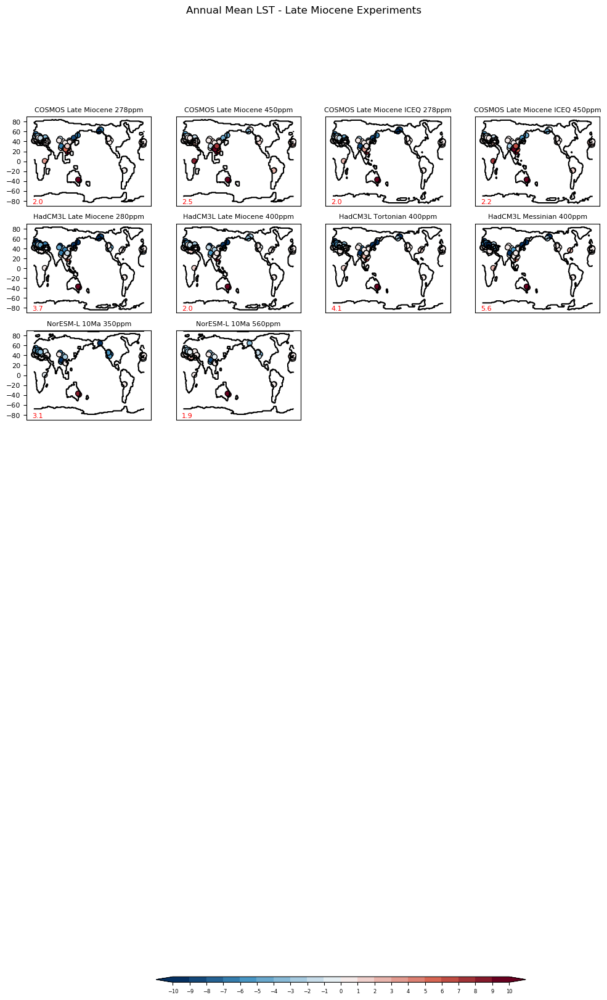

In [145]:
  
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
bounds = np.linspace(-1, 1, 10)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(LATE_MIO_EXPS_NAMES)):
            ax = fig.add_subplot(nrows, ncols, i+1)
            ax.set_title(LATE_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            ax.contour(TS_ANO_MID_MIO_EXPS.lon, TS_ANO_MID_MIO_EXPS.lat, MIDMIO_coast, levels=[0], colors='k', linestyles='-')
            
            cf=plt.scatter(LateMioMATLon, LateMioMATLat, c=LATE_MIO_LTSbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
            
            ax.text(-5, -85, np.around(LATE_MIO_LTSbias_rmse[i], decimals=1), fontsize=8, color='red')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal', extend='both')

# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean LST - Late Miocene Experiments')
   
plt.savefig('LateMiocene_LTS_bias.pdf', format='pdf')    
plt.savefig('LateMiocene_LTS_bias.eps', format='eps')
plt.savefig('LateMiocene_LTS.png', format='png')    

**Plot MMM Bias in Late Miocene Surface Temperature as a function of CO2**

In [146]:
ppm278_index = np.where(LATE_MIO_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
LTS_LATE_MIO_EXPS_278=LTS_LATE_MIO_EXPS[ppm278_indexls[0,:],:,:]
#LTS_LATE_MIO_EXPS_278.shape
LTSbias_LATE_MIO_EXPS_278=LATE_MIO_LTSbias[ppm278_indexls[0,:],:]
LTS_LATE_MIO_EXPS_max_278=LTS_LATE_MIO_EXPS_max[ppm278_indexls[0,:],:]
LTS_LATE_MIO_EXPS_min_278=LTS_LATE_MIO_EXPS_min[ppm278_indexls[0,:],:]

ppm280_index = np.where(LATE_MIO_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
LTS_LATE_MIO_EXPS_280=LTS_LATE_MIO_EXPS[ppm280_indexls[0,:],:,:]
#LTS_LATE_MIO_EXPS_280.shape
LTSbias_LATE_MIO_EXPS_280=LATE_MIO_LTSbias[ppm280_indexls[0,:],:]
LTS_LATE_MIO_EXPS_max_280=LTS_LATE_MIO_EXPS_max[ppm280_indexls[0,:],:]
LTS_LATE_MIO_EXPS_min_280=LTS_LATE_MIO_EXPS_min[ppm280_indexls[0,:],:]

LTS_LATE_MIO_EXPS_278and280 = np.concatenate((LTS_LATE_MIO_EXPS_278, LTS_LATE_MIO_EXPS_280),  axis=0)
LTS_LATE_MIO_EXPS_278and280_MEAN = np.nanmean(LTS_LATE_MIO_EXPS_278and280, axis=0)
LTS_LATE_MIO_EXPS_278and280_STD = np.std(LTS_LATE_MIO_EXPS_278and280, axis=0)
#LTS_LATE_MIO_EXPS_278and280.shape
LTSbias_LATE_MIO_EXPS_278and280 = np.concatenate((LTSbias_LATE_MIO_EXPS_278, LTSbias_LATE_MIO_EXPS_280),  axis=0)
LTSbias_LATE_MIO_EXPS_278and280_MEAN = np.nanmean(LTSbias_LATE_MIO_EXPS_278and280, axis=0)
LTSbias_LATE_MIO_EXPS_278and280_STD = np.std(LTSbias_LATE_MIO_EXPS_278and280, axis=0)
LTS_LATE_MIO_EXPS_max_278and280 = np.concatenate((LTS_LATE_MIO_EXPS_max_278, LTS_LATE_MIO_EXPS_max_280),  axis=0)
LTS_LATE_MIO_EXPS_min_278and280 = np.concatenate((LTS_LATE_MIO_EXPS_min_278, LTS_LATE_MIO_EXPS_min_280),  axis=0)


ppm350_index = np.where(LATE_MIO_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
LTS_LATE_MIO_EXPS_350=LTS_LATE_MIO_EXPS[ppm350_indexls[0,:],:,:]
#LTS_LATE_MIO_EXPS_350.shape
LTSbias_LATE_MIO_EXPS_350=LATE_MIO_LTSbias[ppm350_indexls[0,:],:]
LTS_LATE_MIO_EXPS_max_350=LTS_LATE_MIO_EXPS_max[ppm350_indexls[0,:],:]
LTS_LATE_MIO_EXPS_min_350=LTS_LATE_MIO_EXPS_min[ppm350_indexls[0,:],:]

ppm400_index = np.where(LATE_MIO_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
LTS_LATE_MIO_EXPS_400=LTS_LATE_MIO_EXPS[ppm400_indexls[0,:],:,:]
#LTS_LATE_MIO_EXPS_400.shape
LTSbias_LATE_MIO_EXPS_400=LATE_MIO_LTSbias[ppm400_indexls[0,:],:]
LTS_LATE_MIO_EXPS_max_400=LTS_LATE_MIO_EXPS_max[ppm400_indexls[0,:],:]
LTS_LATE_MIO_EXPS_min_400=LTS_LATE_MIO_EXPS_min[ppm400_indexls[0,:],:]

ppm450_index = np.where(LATE_MIO_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
LTS_LATE_MIO_EXPS_450=LTS_LATE_MIO_EXPS[ppm450_indexls[0,:],:,:]
#LTS_LATE_MIO_EXPS_450.shape
LTSbias_LATE_MIO_EXPS_450=LATE_MIO_LTSbias[ppm450_indexls[0,:],:]
LTS_LATE_MIO_EXPS_max_450=LTS_LATE_MIO_EXPS_max[ppm450_indexls[0,:],:]
LTS_LATE_MIO_EXPS_min_450=LTS_LATE_MIO_EXPS_min[ppm450_indexls[0,:],:]

LTS_LATE_MIO_EXPS_350and450 = np.concatenate((LTS_LATE_MIO_EXPS_350, LTS_LATE_MIO_EXPS_400, LTS_LATE_MIO_EXPS_450),  axis=0)
LTS_LATE_MIO_EXPS_350and450_MEAN = np.nanmean(LTS_LATE_MIO_EXPS_350and450, axis=0)
LTS_LATE_MIO_EXPS_350and450_STD = np.std(LTS_LATE_MIO_EXPS_350and450, axis=0)
#LTS_LATE_MIO_EXPS_350and400.shape
LTSbias_LATE_MIO_EXPS_350and450 = np.concatenate((LTSbias_LATE_MIO_EXPS_350, LTSbias_LATE_MIO_EXPS_400, LTSbias_LATE_MIO_EXPS_450),  axis=0)
LTSbias_LATE_MIO_EXPS_350and450_MEAN = np.nanmean(LTSbias_LATE_MIO_EXPS_350and450, axis=0)
LTSbias_LATE_MIO_EXPS_350and450_STD = np.std(LTSbias_LATE_MIO_EXPS_350and450, axis=0)
LTS_LATE_MIO_EXPS_max_350and450 = np.concatenate((LTS_LATE_MIO_EXPS_max_350, LTS_LATE_MIO_EXPS_max_400, LTS_LATE_MIO_EXPS_max_450),  axis=0)
LTS_LATE_MIO_EXPS_min_350and450 = np.concatenate((LTS_LATE_MIO_EXPS_min_350, LTS_LATE_MIO_EXPS_min_400, LTS_LATE_MIO_EXPS_max_450),  axis=0)

ppm560_index = np.where(LATE_MIO_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
LTS_LATE_MIO_EXPS_560=LTS_LATE_MIO_EXPS[ppm560_indexls[0,:],:,:]
#LTS_LATE_MIO_EXPS_560.shape
LTSbias_LATE_MIO_EXPS_560=LATE_MIO_LTSbias[ppm560_indexls[0,:],:]
LTS_LATE_MIO_EXPS_max_560=LTS_LATE_MIO_EXPS_max[ppm560_indexls[0,:],:]
LTS_LATE_MIO_EXPS_min_560=LTS_LATE_MIO_EXPS_min[ppm560_indexls[0,:],:]

LTS_LATE_MIO_EXPS_560_MEAN = np.nanmean(LTS_LATE_MIO_EXPS_560, axis=0)
LTS_LATE_MIO_EXPS_560_STD = np.std(LTS_LATE_MIO_EXPS_560, axis=0)
LTSbias_LATE_MIO_EXPS_560_MEAN = np.mean(LTSbias_LATE_MIO_EXPS_560, axis=0)
LTSbias_LATE_MIO_EXPS_560_STD = np.std(LTSbias_LATE_MIO_EXPS_560, axis=0)

In [147]:
LATE_MIO_LTSbias_EXPS_278and280_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_LATE_MIO_EXPS_278and280_MEAN), axis=0))
LATE_MIO_LTSbias_EXPS_350and450_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_LATE_MIO_EXPS_350and450_MEAN), axis=0))
LATE_MIO_LTSbias_EXPS_560_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_LATE_MIO_EXPS_560_MEAN), axis=0))

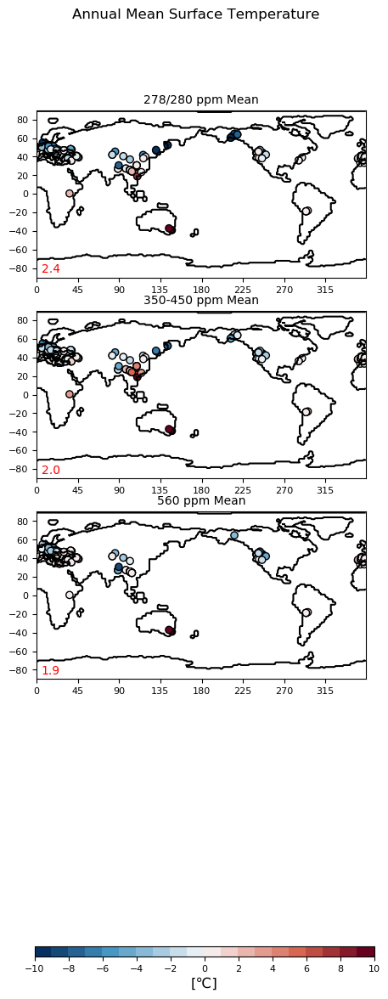

In [148]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-10,10,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

for i in range(0, 3): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf=plt.scatter(LateMioMATLon, LateMioMATLat, c=LTSbias_LATE_MIO_EXPS_278and280_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
                ax.text(5, -85, np.around(LATE_MIO_LTSbias_EXPS_278and280_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 1:
                cf=plt.scatter(LateMioMATLon, LateMioMATLat, c=LTSbias_LATE_MIO_EXPS_350and450_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(LATE_MIO_LTSbias_EXPS_350and450_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 2:
                cf=plt.scatter(LateMioMATLon, LateMioMATLat, c=LTSbias_LATE_MIO_EXPS_560_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(LATE_MIO_LTSbias_EXPS_560_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 3:
                cf=plt.scatter(LateMioMATLon, LateMioMATLat, c=LTSbias_LATE_MIO_EXPS_840and850_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
                ax.text(5, -85, np.around(LATE_MIO_LTSbias_EXPS_840and850_MEAN_rmse, decimals=1), fontsize=10, color='red')
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            #ax.contour(Frigola_MMCO.topo.lon,Frigola_MMCO.topo.lat,Frigola_MMCO.topo, levels=[0], colors='k', linestyles='-')
            LATEMIO_coast=landmask_LATE_MIO_EXPS[0,:,:]*1
            ax.contour(TS_ANO_LATE_MIO_EXPS.lon, TS_ANO_LATE_MIO_EXPS.lat, LATEMIO_coast, levels=[0], colors='k', linestyles='-')

            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')

plt.savefig('LateMioceneLSTbias_ByCO2_SurfaceTemp.pdf', format='pdf')      

**Plot MCO Miocene SST bias**

In [149]:
filename='MCOMiocene_SST_v2.csv'
MCOMIO_SST = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#MCOMIO_SST

In [150]:
MCOMIO_SST2=MCOMIO_SST.values[:,:]
MCOMIOSSTLat=np.asarray(MCOMIO_SST2[:,3],dtype=np.float64)
MCOMIOSSTLon180=np.asarray(MCOMIO_SST2[:,4],dtype=np.float64)
MCOMIOSSTLon=np.asarray(MCOMIO_SST2[:,5],dtype=np.float64)
MCOMIOSST=np.asarray(MCOMIO_SST2[:,1],dtype=np.float64)
MCOMIOSST_ucert=np.asarray(MCOMIO_SST2[:,2],dtype=np.float64)

In [151]:
# For these plots use the 1 standard deviation uncertainty 
MCOMIOSST_max=MCOMIOSST+MCOMIOSST_ucert/2
MCOMIOSST_min=MCOMIOSST-MCOMIOSST_ucert/2

In [152]:
MCOMIOSSTSiteName=MCOMIO_SST2[:,0]

In [153]:
# Adjusted lat and lon "plot" to avoid overlap in plots
MCOMIOSSTLon180_plot=np.asarray(MCOMIO_SST2[:,4],dtype=np.float64)
MCOMIOSSTLon_plot=np.asarray(MCOMIO_SST2[:,5],dtype=np.float64)

MCOMIOSSTLon_plot[6]=MCOMIOSSTLon[6]-8 #926
MCOMIOSSTLon_plot[4]=MCOMIOSSTLon[4]+8 #925Uk37
#MCOMIOSSTLon_plot[4]=MCOMIOSSTLon[4]+8 #ANDA2
MCOMIOSSTLon_plot[0]=MCOMIOSSTLon[0]+8 # 608Uk37
MCOMIOSSTLon_plot[8]=MCOMIOSSTLon[8]-8 # 982Tex86

MCOMIOSSTLon180_plot[6]=MCOMIOSSTLon180[6]-8 #926
MCOMIOSSTLon180_plot[11]=MCOMIOSSTLon180[11]+8 #925Uk37
#MCOMIOSSTLon180_plot[4]=MCOMIOSSTLon180[4]+8 #ANDA2
MCOMIOSSTLon180_plot[0]=MCOMIOSSTLon180[0]+8 #608Uk37
MCOMIOSSTLon180_plot[9]=MCOMIOSSTLon180[8]-8 # 982Tex86


MCOMIOSSTLat_plot=np.asarray(MCOMIO_SST2[:,3],dtype=np.float64)
#MCOMIOSSTLat_plot[10]=MCOMIOSSTLat[10]+3 #907Uk37

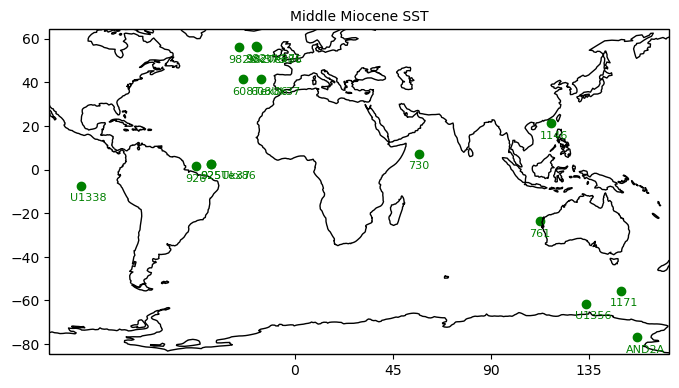

In [154]:
# info plot on site locations
fig = plt.figure(figsize=(8, 6), dpi=100)

Site_lon=MCOMIOSSTLon180_plot
Site_lat=MCOMIOSSTLat
Site_Name=MCOMIOSSTSiteName

ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_title('Middle Miocene SST', fontsize=10)
ax.set_xticks(xtick_levels)
ax.set_yticks(ytick_levels)                

ax.coastlines()

#Add site locations
ax.scatter(Site_lon, Site_lat, c='g', marker='o', edgecolors='g')
for i, txt in enumerate(Site_Name):
    ax.annotate(txt, (Site_lon[i]-5, Site_lat[i]-7), fontsize=8, color='g')
   
plt.savefig('MCOMIOSSTSiteLocations.pdf', format='pdf')    
plt.savefig('MCOMIOSSTSiteLocations.eps', format='eps')
plt.savefig('MCOMIOSSTSiteLocations.png', format='png')    

In [155]:
Lon_index_MCOMIOsst=[]
Lat_index_MCOMIOsst=[]
for i in range(0, len(MCOMIOSST)):
            Lon_temp=np.where((lon>=MCOMIOSSTLon[i]-0.5) & (lon<=MCOMIOSSTLon[i]+0.5))[0]
            Lon_index_MCOMIOsst.append(Lon_temp)
            Lat_temp=np.where((lat>=MCOMIOSSTLat[i]-0.5) & (lat<=MCOMIOSSTLat[i]+0.5))[0]
            Lat_index_MCOMIOsst.append(Lat_temp)

In [156]:
# -1,1  0,1  1,1
# -1,0  0,0  1,0
# -1,-1 0,-1 1,-1
SST_MID_MIO_EXPS_max=np.empty([0,len(MCOMIOSST)])
SST_MID_MIO_EXPS_min=np.empty([0,len(MCOMIOSST)])
for j in range(0, len(SST_MID_MIO_EXPS)):
    SST_MID_MIO_EXPS_max_run=[]
    SST_MID_MIO_EXPS_min_run=[]
    for i in range(0, len(MCOMIOSST)):
                SST_MID_MIO_EXPS_min_temp=np.nanmin([SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]+1,Lon_index_MCOMIOsst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]+1,Lon_index_MCOMIOsst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]+1,Lon_index_MCOMIOsst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i],Lon_index_MCOMIOsst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i],Lon_index_MCOMIOsst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i],Lon_index_MCOMIOsst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]-1,Lon_index_MCOMIOsst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]-1,Lon_index_MCOMIOsst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]-1,Lon_index_MCOMIOsst[i]+1], \
                ])
                SST_MID_MIO_EXPS_max_temp=np.nanmax([SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]+1,Lon_index_MCOMIOsst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]+1,Lon_index_MCOMIOsst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]+1,Lon_index_MCOMIOsst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i],Lon_index_MCOMIOsst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i],Lon_index_MCOMIOsst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i],Lon_index_MCOMIOsst[i]+1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]-1,Lon_index_MCOMIOsst[i]-1], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]-1,Lon_index_MCOMIOsst[i]], \
                SST_MID_MIO_EXPS[j,Lat_index_MCOMIOsst[i]-1,Lon_index_MCOMIOsst[i]+1], \
                ])
        
                SST_MID_MIO_EXPS_max_run.append(SST_MID_MIO_EXPS_max_temp)
                SST_MID_MIO_EXPS_min_run.append(SST_MID_MIO_EXPS_min_temp)
    del SST_MID_MIO_EXPS_max_temp
    del SST_MID_MIO_EXPS_min_temp
    SST_MID_MIO_EXPS_max = np.append(SST_MID_MIO_EXPS_max,[SST_MID_MIO_EXPS_max_run], axis=0)
    SST_MID_MIO_EXPS_min = np.append(SST_MID_MIO_EXPS_min,[SST_MID_MIO_EXPS_min_run], axis=0)

In [157]:
np.mean(SST_MID_MIO_EXPS_max[:,:], axis=0)

array([17.68183945, 17.68183945, 30.52137326,         nan, 29.51763565,
       29.51763565, 29.49694203,         nan,         nan,         nan,
       28.79672936, 28.69042446,         nan,  8.45976588,         nan])

In [158]:
MCO_MIO_SSTbias=np.empty([0,len(MCOMIOSST)])
for j in range(0, len(SST_MID_MIO_EXPS)):
    SSTbias_run=[]
    for i in range(0, len(MCOMIOSST)):
        diff1=MCOMIOSST_min[i]-SST_MID_MIO_EXPS_max[j,i]
        diff2=SST_MID_MIO_EXPS_min[j,i]-MCOMIOSST_max[i]
        if diff1>0:
            SSTbias_temp=-diff1 
        elif diff2>0:
            SSTbias_temp=diff2
        elif np.isnan(diff2)==True:
            SSTbias_temp=float('nan')    
        else:
            SSTbias_temp=0
        SSTbias_run.append(SSTbias_temp)
    del SSTbias_temp
    MCO_MIO_SSTbias=np.append(MCO_MIO_SSTbias,[SSTbias_run], axis=0)

In [159]:
MCO_MIO_SSTbias_mean=np.nanmean(MCO_MIO_SSTbias, axis=1)

In [160]:
MCO_MIO_SSTbias_rmse=np.sqrt(np.nanmean(np.square(MCO_MIO_SSTbias), axis=1))

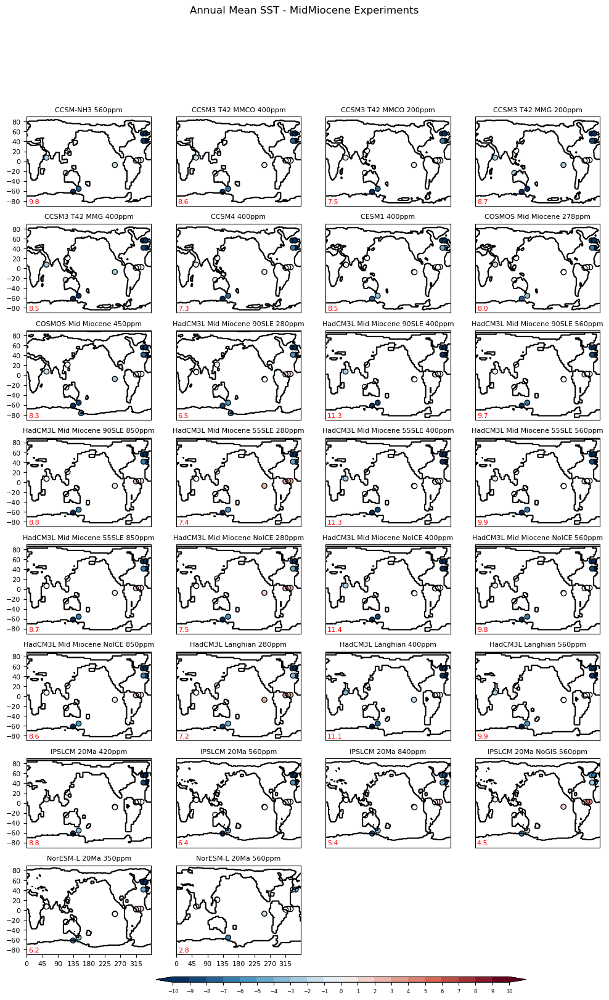

In [161]:
  
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)


markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

                        
            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            ax.contour(TS_ANO_MID_MIO_EXPS.lon, TS_ANO_MID_MIO_EXPS.lat, MIDMIO_coast, levels=[0], colors='k', linestyles='-')
            
            cf=plt.scatter(MCOMIOSSTLon_plot, MCOMIOSSTLat, c=MCO_MIO_SSTbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap)
            for j in range(0, len(MCO_MIO_SSTbias[i,:])):
                if MCO_MIO_SSTbias[i,j]==0:
                    cf2=plt.scatter(MCOMIOSSTLon_plot[j], MCOMIOSSTLat[j],facecolor='white',edgecolors='k')

            ax.text(5, -85, np.around(MCO_MIO_SSTbias_rmse[i], decimals=1), fontsize=8, color='red')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal', extend='both')

# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean SST - MidMiocene Experiments')

plt.savefig('MCOMiocene_SST_bias.pdf', format='pdf')    
#plt.savefig('MCOMiocene_SST_bias.eps', format='eps')
#plt.savefig('MCOMiocene_SST_bias.png', format='png')    

**Plot MMM Bias in MCO Miocene SST as a function of CO2**

In [162]:
ppm278_index = np.where(MID_MIO_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
SST_MID_MIO_EXPS_278=SST_MID_MIO_EXPS[ppm278_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_278.shape
SSTbias_MCO_MIO_EXPS_MEAN_278=MCO_MIO_SSTbias[ppm278_indexls[0,:],:]
SST_MID_MIO_EXPS_max_278=SST_MID_MIO_EXPS_max[ppm278_indexls[0,:],:]
SST_MID_MIO_EXPS_min_278=SST_MID_MIO_EXPS_min[ppm278_indexls[0,:],:]

ppm280_index = np.where(MID_MIO_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
SST_MID_MIO_EXPS_280=SST_MID_MIO_EXPS[ppm280_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_280.shape
SSTbias_MCO_MIO_EXPS_MEAN_280=MCO_MIO_SSTbias[ppm280_indexls[0,:],:]
SST_MID_MIO_EXPS_max_280=SST_MID_MIO_EXPS_max[ppm280_indexls[0,:],:]
SST_MID_MIO_EXPS_min_280=SST_MID_MIO_EXPS_min[ppm280_indexls[0,:],:]

SST_MID_MIO_EXPS_278and280 = np.concatenate((SST_MID_MIO_EXPS_278, SST_MID_MIO_EXPS_280),  axis=0)
SST_MID_MIO_EXPS_278and280_MEAN = np.nanmean(SST_MID_MIO_EXPS_278and280, axis=0)
SST_MID_MIO_EXPS_278and280_STD = np.std(SST_MID_MIO_EXPS_278and280, axis=0)
#SST_MID_MIO_EXPS_278and280.shape
SSTbias_MCO_MIO_EXPS_MEAN_278and280 = np.concatenate((SSTbias_MCO_MIO_EXPS_MEAN_278, SSTbias_MCO_MIO_EXPS_MEAN_280),  axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_278and280_MEAN = np.nanmean(SSTbias_MCO_MIO_EXPS_MEAN_278and280, axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_278and280_STD = np.std(SSTbias_MCO_MIO_EXPS_MEAN_278and280, axis=0)
SST_MID_MIO_EXPS_max_278and280 = np.concatenate((SST_MID_MIO_EXPS_max_278, SST_MID_MIO_EXPS_max_280),  axis=0)
SST_MID_MIO_EXPS_min_278and280 = np.concatenate((SST_MID_MIO_EXPS_min_278, SST_MID_MIO_EXPS_min_280),  axis=0)


ppm350_index = np.where(MID_MIO_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
SST_MID_MIO_EXPS_350=SST_MID_MIO_EXPS[ppm350_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_350.shape
SSTbias_MCO_MIO_EXPS_MEAN_350=MCO_MIO_SSTbias[ppm350_indexls[0,:],:]
SST_MID_MIO_EXPS_max_350=SST_MID_MIO_EXPS_max[ppm350_indexls[0,:],:]
SST_MID_MIO_EXPS_min_350=SST_MID_MIO_EXPS_min[ppm350_indexls[0,:],:]

ppm400_index = np.where(MID_MIO_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
SST_MID_MIO_EXPS_400=SST_MID_MIO_EXPS[ppm400_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_400.shape
SSTbias_MCO_MIO_EXPS_MEAN_400=MCO_MIO_SSTbias[ppm400_indexls[0,:],:]
SST_MID_MIO_EXPS_max_400=SST_MID_MIO_EXPS_max[ppm400_indexls[0,:],:]
SST_MID_MIO_EXPS_min_400=SST_MID_MIO_EXPS_min[ppm400_indexls[0,:],:]

ppm450_index = np.where(MID_MIO_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
SST_MID_MIO_EXPS_450=SST_MID_MIO_EXPS[ppm450_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_450.shape
#plt.contourf(SST_MID_MIO_EXPS_450[0,:,:])
SSTbias_MCO_MIO_EXPS_MEAN_450=MCO_MIO_SSTbias[ppm450_indexls[0,:],:]
SST_MID_MIO_EXPS_max_450=SST_MID_MIO_EXPS_max[ppm450_indexls[0,:],:]
SST_MID_MIO_EXPS_min_450=SST_MID_MIO_EXPS_min[ppm450_indexls[0,:],:]

SST_MID_MIO_EXPS_350and450 = np.concatenate((SST_MID_MIO_EXPS_350, SST_MID_MIO_EXPS_400, SST_MID_MIO_EXPS_450),  axis=0)
SST_MID_MIO_EXPS_350and450_MEAN = np.nanmean(SST_MID_MIO_EXPS_350and450, axis=0)
SST_MID_MIO_EXPS_350and450_STD = np.std(SST_MID_MIO_EXPS_350and450, axis=0)
#SST_MID_MIO_EXPS_350and400.shape
SSTbias_MCO_MIO_EXPS_MEAN_350and450 = np.concatenate((SSTbias_MCO_MIO_EXPS_MEAN_350, SSTbias_MCO_MIO_EXPS_MEAN_400, SSTbias_MCO_MIO_EXPS_MEAN_450),  axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_350and450_MEAN = np.nanmean(SSTbias_MCO_MIO_EXPS_MEAN_350and450, axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_350and450_STD = np.std(SSTbias_MCO_MIO_EXPS_MEAN_350and450, axis=0)
SST_MID_MIO_EXPS_max_350and450 = np.concatenate((SST_MID_MIO_EXPS_max_350, SST_MID_MIO_EXPS_max_400, SST_MID_MIO_EXPS_max_450),  axis=0)
SST_MID_MIO_EXPS_min_350and450 = np.concatenate((SST_MID_MIO_EXPS_min_350, SST_MID_MIO_EXPS_min_400, SST_MID_MIO_EXPS_max_450),  axis=0)

ppm560_index = np.where(MID_MIO_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
SST_MID_MIO_EXPS_560=SST_MID_MIO_EXPS[ppm560_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_560.shape
#plt.contourf(SST_MID_MIO_EXPS_560[0,:,:])
SSTbias_MCO_MIO_EXPS_MEAN_560=MCO_MIO_SSTbias[ppm560_indexls[0,:],:]
SST_MID_MIO_EXPS_max_560=SST_MID_MIO_EXPS_max[ppm560_indexls[0,:],:]
SST_MID_MIO_EXPS_min_560=SST_MID_MIO_EXPS_min[ppm560_indexls[0,:],:]

SST_MID_MIO_EXPS_560_MEAN = np.nanmean(SST_MID_MIO_EXPS_560, axis=0)
SST_MID_MIO_EXPS_560_STD = np.std(SST_MID_MIO_EXPS_560, axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_560_MEAN = np.nanmean(SSTbias_MCO_MIO_EXPS_MEAN_560, axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_560_STD = np.std(SSTbias_MCO_MIO_EXPS_MEAN_560, axis=0)

ppm840_index = np.where(MID_MIO_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
SST_MID_MIO_EXPS_840=SST_MID_MIO_EXPS[ppm840_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_840.shape
#plt.contourf(SST_MID_MIO_EXPS_840[0,:,:])
SSTbias_MCO_MIO_EXPS_MEAN_840=MCO_MIO_SSTbias[ppm840_indexls[0,:],:]
SST_MID_MIO_EXPS_max_840=SST_MID_MIO_EXPS_max[ppm840_indexls[0,:],:]
SST_MID_MIO_EXPS_min_840=SST_MID_MIO_EXPS_min[ppm840_indexls[0,:],:]

ppm850_index = np.where(MID_MIO_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
SST_MID_MIO_EXPS_850=SST_MID_MIO_EXPS[ppm850_indexls[0,:],:,:]
#SST_MID_MIO_EXPS_850.shape
SSTbias_MCO_MIO_EXPS_MEAN_850=MCO_MIO_SSTbias[ppm850_indexls[0,:],:]
SST_MID_MIO_EXPS_max_850=SST_MID_MIO_EXPS_max[ppm850_indexls[0,:],:]
SST_MID_MIO_EXPS_min_850=SST_MID_MIO_EXPS_min[ppm850_indexls[0,:],:]

SST_MID_MIO_EXPS_840and850 = np.concatenate((SST_MID_MIO_EXPS_840, SST_MID_MIO_EXPS_850),  axis=0)
SST_MID_MIO_EXPS_840and850_MEAN = np.nanmean(SST_MID_MIO_EXPS_840and850, axis=0)
SST_MID_MIO_EXPS_840and850_STD = np.std(SST_MID_MIO_EXPS_840and850, axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_840and850 = np.concatenate((SSTbias_MCO_MIO_EXPS_MEAN_840, SSTbias_MCO_MIO_EXPS_MEAN_850),  axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_840and850_MEAN = np.nanmean(SSTbias_MCO_MIO_EXPS_MEAN_840and850, axis=0)
SSTbias_MCO_MIO_EXPS_MEAN_840and850_STD = np.std(SSTbias_MCO_MIO_EXPS_MEAN_840and850, axis=0)
#SST_MID_MIO_EXPS_840and850.shape
SST_MID_MIO_EXPS_max_840and850 = np.concatenate((SST_MID_MIO_EXPS_max_840, SST_MID_MIO_EXPS_max_850),  axis=0)
SST_MID_MIO_EXPS_min_840and850 = np.concatenate((SST_MID_MIO_EXPS_min_840, SST_MID_MIO_EXPS_min_850),  axis=0)

In [163]:
MCO_MIO_SSTbias_EXPS_278and280_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MCO_MIO_EXPS_MEAN_278and280_MEAN), axis=0))
MCO_MIO_SSTbias_EXPS_350and450_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MCO_MIO_EXPS_MEAN_350and450_MEAN), axis=0))
MCO_MIO_SSTbias_EXPS_560_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MCO_MIO_EXPS_MEAN_560_MEAN), axis=0))
MCO_MIO_SSTbias_EXPS_840and850_MEAN_rmse=np.sqrt(np.nanmean(np.square(SSTbias_MCO_MIO_EXPS_MEAN_840and850_MEAN), axis=0))

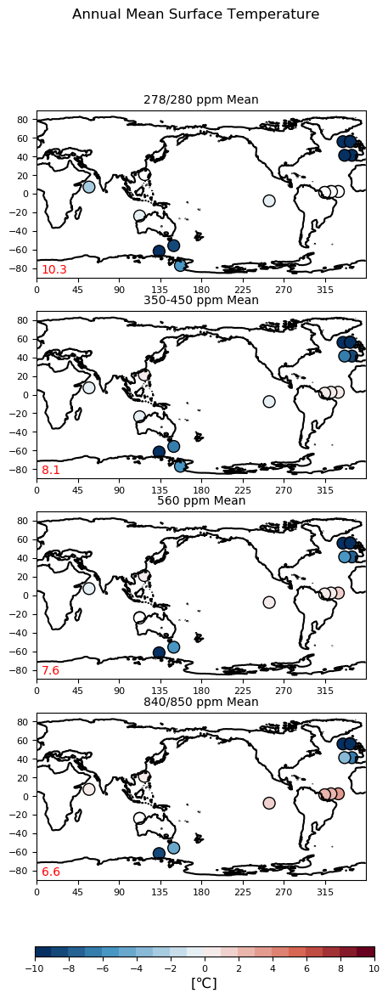

In [164]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-10,10,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf=plt.scatter(MCOMIOSSTLon_plot, MCOMIOSSTLat_plot, 100, c=SSTbias_MCO_MIO_EXPS_MEAN_278and280_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MCO_MIO_EXPS_MEAN_278and280_MEAN)):
                        if SSTbias_MCO_MIO_EXPS_MEAN_278and280_MEAN[j]==0:
                            cf2=plt.scatter(MCOMIOSSTLon_plot[j], MCOMIOSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
                ax.text(5, -85, np.around(MCO_MIO_SSTbias_EXPS_278and280_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 1:
                cf=plt.scatter(MCOMIOSSTLon_plot, MCOMIOSSTLat_plot, 100, c=SSTbias_MCO_MIO_EXPS_MEAN_350and450_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MCO_MIO_EXPS_MEAN_350and450_MEAN)):
                        if SSTbias_MCO_MIO_EXPS_MEAN_350and450_MEAN[j]==0:
                            cf2=plt.scatter(MCOMIOSSTLon_plot[j], MCOMIOSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MCO_MIO_SSTbias_EXPS_350and450_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 2:
                cf=plt.scatter(MCOMIOSSTLon_plot, MCOMIOSSTLat_plot, 100, c=SSTbias_MCO_MIO_EXPS_MEAN_560_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MCO_MIO_EXPS_MEAN_560_MEAN)):
                        if SSTbias_MCO_MIO_EXPS_MEAN_560_MEAN[j]==0:
                            cf2=plt.scatter(MCOMIOSSTLon_plot[j], MCOMIOSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MCO_MIO_SSTbias_EXPS_560_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 3:
                cf=plt.scatter(MCOMIOSSTLon_plot, MCOMIOSSTLat_plot, 100, c=SSTbias_MCO_MIO_EXPS_MEAN_840and850_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                for j in range(0, len(SSTbias_MCO_MIO_EXPS_MEAN_840and850_MEAN)):
                        if SSTbias_MCO_MIO_EXPS_MEAN_840and850_MEAN[j]==0:
                            cf2=plt.scatter(MCOMIOSSTLon_plot[j], MCOMIOSSTLat[j], 100, facecolor='white',edgecolors='k')
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
                ax.text(5, -85, np.around(MCO_MIO_SSTbias_EXPS_840and850_MEAN_rmse, decimals=1), fontsize=10, color='red')
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')

   
plt.savefig('MCOMioceneSSTbias_ByCO2_SurfaceTemp.pdf', format='pdf')      

**Plot MCO Miocene Surface Temperature bias**

In [165]:
filename='Data_02_28_20_clean_MidMioceneSlab_MAT_onlyMCOstrick.csv'
MCOMIO_MAT = pd.read_csv(filename, header=0, error_bad_lines=False, sep=',')
#MCOMIO_MAT

In [166]:
MCOMIO_MAT2=MCOMIO_MAT.values[0:-1,:]
MCOMIOMATLat=np.asarray(MCOMIO_MAT2[:,0],dtype=np.float64)
MCOMIOMATLon=np.asarray(MCOMIO_MAT2[:,4],dtype=np.float64)
MCOMIOMAT=np.asarray(MCOMIO_MAT2[:,2],dtype=np.float64)
MCOMIOMAT_uncert=np.asarray(MCOMIO_MAT2[:,3],dtype=np.float64)

In [167]:
MCOMIOMAT_max=MCOMIOMAT+MCOMIOMAT_uncert
MCOMIOMAT_min=MCOMIOMAT-MCOMIOMAT_uncert

In [168]:
Lon_index_MCOMIOMAT=[]
Lat_index_MCOMIOMAT=[]
for i in range(0, len(MCOMIOMAT)):
            Lon_temp=np.where((lon>=MCOMIOMATLon[i]-0.5) & (lon<=MCOMIOMATLon[i]+0.5))[0]
            Lon_index_MCOMIOMAT.append(Lon_temp)
            Lat_temp=np.where((lat>=MCOMIOMATLat[i]-0.5) & (lat<=MCOMIOMATLat[i]+0.5))[0]
            Lat_index_MCOMIOMAT.append(Lat_temp)

In [169]:
LTS_MID_MIO_EXPS_C=LTS_MID_MIO_EXPS #Already in deg C

In [170]:
# -1,1  0,1  1,1
# -1,0  0,0  1,0
# -1,-1 0,-1 1,-1
LTS_MID_MIO_EXPS_max=np.empty([0,len(MCOMIOMAT)])
LTS_MID_MIO_EXPS_min=np.empty([0,len(MCOMIOMAT)])
for j in range(0, len(LTS_MID_MIO_EXPS)):
    LTS_MID_MIO_EXPS_max_run=[]
    LTS_MID_MIO_EXPS_min_run=[]
    for i in range(0, len(MCOMIOMAT)):
                LTS_MID_MIO_EXPS_min_temp=np.nanmin([LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]+1,Lon_index_MCOMIOMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]+1,Lon_index_MCOMIOMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]+1,Lon_index_MCOMIOMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i],Lon_index_MCOMIOMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i],Lon_index_MCOMIOMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i],Lon_index_MCOMIOMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]-1,Lon_index_MCOMIOMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]-1,Lon_index_MCOMIOMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]-1,Lon_index_MCOMIOMAT[i]+1], \
                ])
                LTS_MID_MIO_EXPS_max_temp=np.nanmax([LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]+1,Lon_index_MCOMIOMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]+1,Lon_index_MCOMIOMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]+1,Lon_index_MCOMIOMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i],Lon_index_MCOMIOMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i],Lon_index_MCOMIOMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i],Lon_index_MCOMIOMAT[i]+1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]-1,Lon_index_MCOMIOMAT[i]-1], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]-1,Lon_index_MCOMIOMAT[i]], \
                LTS_MID_MIO_EXPS_C[j,Lat_index_MCOMIOMAT[i]-1,Lon_index_MCOMIOMAT[i]+1], \
                ])
        
                LTS_MID_MIO_EXPS_max_run.append(LTS_MID_MIO_EXPS_max_temp)
                LTS_MID_MIO_EXPS_min_run.append(LTS_MID_MIO_EXPS_min_temp)
    del LTS_MID_MIO_EXPS_max_temp
    del LTS_MID_MIO_EXPS_min_temp
    LTS_MID_MIO_EXPS_max = np.append(LTS_MID_MIO_EXPS_max,[LTS_MID_MIO_EXPS_max_run], axis=0)
    LTS_MID_MIO_EXPS_min = np.append(LTS_MID_MIO_EXPS_min,[LTS_MID_MIO_EXPS_min_run], axis=0)
    

In [171]:
MCO_MIO_LTSbias=np.empty([0,len(MCOMIOMAT)])
for j in range(0, len(LTS_MID_MIO_EXPS)):
    LTSbias_run=[]
    for i in range(0, len(MCOMIOMAT)):
        diff1=MCOMIOMAT_min[i]-LTS_MID_MIO_EXPS_max[j,i]
        diff2=LTS_MID_MIO_EXPS_min[j,i]-MCOMIOMAT_max[i]
        if diff1>0:
            LTSbias_temp=-diff1 
        elif diff2>0:
            LTSbias_temp=diff2
        elif np.isnan(diff2)==True:
            LTSbias_temp=float('nan')
        else:
            LTSbias_temp=0
        LTSbias_run.append(LTSbias_temp)
    del LTSbias_temp
    MCO_MIO_LTSbias=np.append(MCO_MIO_LTSbias,[LTSbias_run], axis=0)

In [172]:
MCO_MIO_LTSbias_mean=np.nanmean(MCO_MIO_LTSbias, axis=1)
MCO_MIO_LTSbias_rmse=np.sqrt(np.nanmean(np.square(MCO_MIO_LTSbias), axis=1))

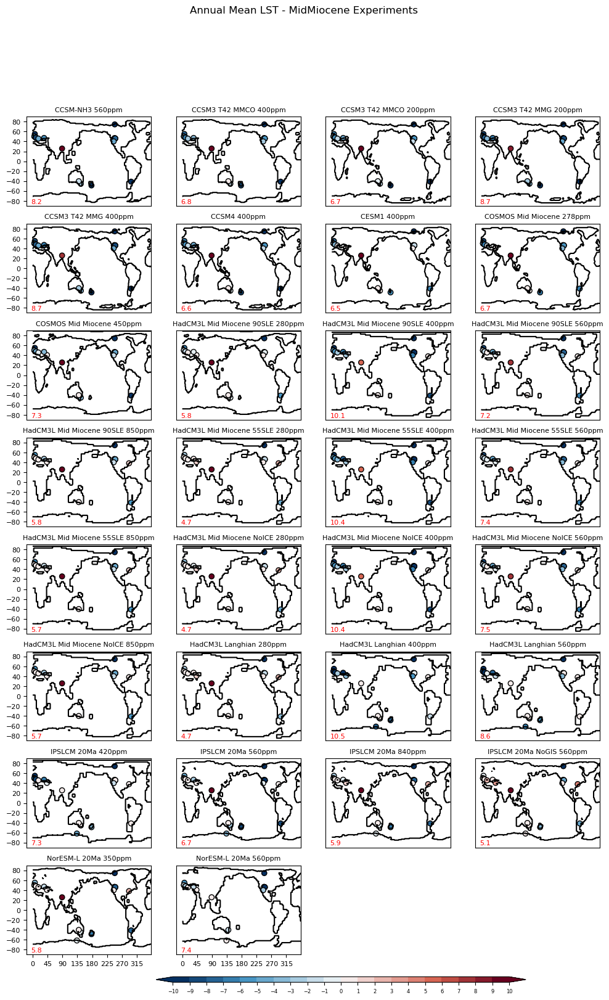

In [173]:
  
ncols = 4
nrows = 8

# set contour levels
contour_levels = np.linspace(-10,10,21)

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(12, 18), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
bounds = np.linspace(-1, 1, 10)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

markyaxis=np.array([0,4,8,12,16,20,24])

for i in range(0, len(MID_MIO_EXPS_NAMES)):
#for i in range(0, 27):
    # iterate over all of the Mid Miocene Experiments
           #ax = plt.subplot(nrows, ncols, i+1)
            ax = fig.add_subplot(nrows, ncols, i+1)
            ax.set_title(MID_MIO_EXPS_NAMES[i], fontsize=8)
            
            if  i == 29 or i == 30:
                ax.set_xticks(xtick_levels)
                ax.set_yticks([])
            elif i in markyaxis:
                ax.set_xticks([])
                ax.set_yticks(ytick_levels)  
            elif i == 28:
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
            else:
                ax.set_xticks([])
                ax.set_yticks([]) 
            ax.tick_params(axis='both', which='major', labelsize=8)

            MIDMIO_coast=landmask_MID_MIO_EXPS[i,:,:]*1
            ax.contour(TS_ANO_MID_MIO_EXPS.lon, TS_ANO_MID_MIO_EXPS.lat, MIDMIO_coast, levels=[0], colors='k', linestyles='-')
            
            #test11=np.linspace(-10,10,19)
            #ax.scatter(MCOMIOSSTLon, MCOMIOSSTLat, c=MCO_MIO_SSTbias[1,0], marker='o', edgecolors='k', cmap=plt.cm.jet)
            #ax.scatter(MCOMIOSSTLon, MCOMIOSSTLat, c=SST_MID_MIO_EXPS_min[i,:], marker='o', edgecolors='k', cmap=my_colormap)
            cf=plt.scatter(MCOMIOMATLon, MCOMIOMATLat, c=MCO_MIO_LTSbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap)
            #cf=plt.scatter(MCOMIOSSTLon, MCOMIOSSTLat, c=MCO_MIO_SSTbias[i,:], vmin=-10, vmax=10, marker='o', edgecolors='k', cmap=my_colormap)
            #for j in range(0, len(MCO_MIO_LTSbias[i,:])):
            #    if MCO_MIO_LTSbias[i,j]==0:
            #        cf2=plt.scatter(MCOMIOMATLon[j], MCOMIOMATLat[j],facecolor='white',edgecolors='k')
                    
            ax.text(-5, -85, np.around(MCO_MIO_LTSbias_rmse[i], decimals=1), fontsize=8, color='red')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.3, 0.1, 0.5, 0.005])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal', extend='both')

# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=6)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean LST - MidMiocene Experiments')

   
plt.savefig('MCOMiocene_LTS_bias.pdf', format='pdf')    
plt.savefig('MCOMiocene_LTS_bias.eps', format='eps')
plt.savefig('MCOMiocene_LTS.png', format='png')    

**Plot MMM Bias in Mid Miocene Surface Temperature as a function of CO2**

In [174]:
ppm278_index = np.where(MID_MIO_EXPS_CO2ppm == 278)
ppm278_indexls = np.array(ppm278_index)
LTS_MID_MIO_EXPS_278=LTS_MID_MIO_EXPS[ppm278_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_278.shape
#plt.contourf(LTS_MID_MIO_EXPS_278[0,:,:])
LTSbias_MCO_MIO_EXPS_278=MCO_MIO_LTSbias[ppm278_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_278=LTS_MID_MIO_EXPS_max[ppm278_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_278=LTS_MID_MIO_EXPS_min[ppm278_indexls[0,:],:]

ppm280_index = np.where(MID_MIO_EXPS_CO2ppm == 280)
ppm280_indexls = np.array(ppm280_index)
LTS_MID_MIO_EXPS_280=LTS_MID_MIO_EXPS[ppm280_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_280.shape
LTSbias_MCO_MIO_EXPS_280=MCO_MIO_LTSbias[ppm280_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_280=LTS_MID_MIO_EXPS_max[ppm280_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_280=LTS_MID_MIO_EXPS_min[ppm280_indexls[0,:],:]

LTS_MID_MIO_EXPS_278and280 = np.concatenate((LTS_MID_MIO_EXPS_278, LTS_MID_MIO_EXPS_280),  axis=0)
LTS_MID_MIO_EXPS_278and280_MEAN = np.nanmean(LTS_MID_MIO_EXPS_278and280, axis=0)
LTS_MID_MIO_EXPS_278and280_STD = np.std(LTS_MID_MIO_EXPS_278and280, axis=0)
#LTS_MID_MIO_EXPS_278and280.shape
LTSbias_MCO_MIO_EXPS_278and280 = np.concatenate((LTSbias_MCO_MIO_EXPS_278, LTSbias_MCO_MIO_EXPS_280),  axis=0)
LTSbias_MCO_MIO_EXPS_278and280_MEAN = np.nanmean(LTSbias_MCO_MIO_EXPS_278and280, axis=0)
LTSbias_MCO_MIO_EXPS_278and280_STD = np.std(LTSbias_MCO_MIO_EXPS_278and280, axis=0)
LTS_MID_MIO_EXPS_max_278and280 = np.concatenate((LTS_MID_MIO_EXPS_max_278, LTS_MID_MIO_EXPS_max_280),  axis=0)
LTS_MID_MIO_EXPS_min_278and280 = np.concatenate((LTS_MID_MIO_EXPS_min_278, LTS_MID_MIO_EXPS_min_280),  axis=0)


ppm350_index = np.where(MID_MIO_EXPS_CO2ppm == 350)
ppm350_indexls = np.array(ppm350_index)
LTS_MID_MIO_EXPS_350=LTS_MID_MIO_EXPS[ppm350_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_350.shape
#plt.contourf(LTS_MID_MIO_EXPS_350[0,:,:])
LTSbias_MCO_MIO_EXPS_350=MCO_MIO_LTSbias[ppm350_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_350=LTS_MID_MIO_EXPS_max[ppm350_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_350=LTS_MID_MIO_EXPS_min[ppm350_indexls[0,:],:]

ppm400_index = np.where(MID_MIO_EXPS_CO2ppm == 400)
ppm400_indexls = np.array(ppm400_index)
LTS_MID_MIO_EXPS_400=LTS_MID_MIO_EXPS[ppm400_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_400.shape
LTSbias_MCO_MIO_EXPS_400=MCO_MIO_LTSbias[ppm400_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_400=LTS_MID_MIO_EXPS_max[ppm400_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_400=LTS_MID_MIO_EXPS_min[ppm400_indexls[0,:],:]

ppm450_index = np.where(MID_MIO_EXPS_CO2ppm == 450)
ppm450_indexls = np.array(ppm450_index)
LTS_MID_MIO_EXPS_450=LTS_MID_MIO_EXPS[ppm450_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_450.shape
#plt.contourf(LTS_MID_MIO_EXPS_450[0,:,:])
LTSbias_MCO_MIO_EXPS_450=MCO_MIO_LTSbias[ppm450_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_450=LTS_MID_MIO_EXPS_max[ppm450_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_450=LTS_MID_MIO_EXPS_min[ppm450_indexls[0,:],:]

LTS_MID_MIO_EXPS_350and450 = np.concatenate((LTS_MID_MIO_EXPS_350, LTS_MID_MIO_EXPS_400, LTS_MID_MIO_EXPS_450),  axis=0)
LTS_MID_MIO_EXPS_350and450_MEAN = np.nanmean(LTS_MID_MIO_EXPS_350and450, axis=0)
LTS_MID_MIO_EXPS_350and450_STD = np.std(LTS_MID_MIO_EXPS_350and450, axis=0)
#LTS_MID_MIO_EXPS_350and400.shape
LTSbias_MCO_MIO_EXPS_350and450 = np.concatenate((LTSbias_MCO_MIO_EXPS_350, LTSbias_MCO_MIO_EXPS_400, LTSbias_MCO_MIO_EXPS_450),  axis=0)
LTSbias_MCO_MIO_EXPS_350and450_MEAN = np.nanmean(LTSbias_MCO_MIO_EXPS_350and450, axis=0)
LTSbias_MCO_MIO_EXPS_350and450_STD = np.std(LTSbias_MCO_MIO_EXPS_350and450, axis=0)
LTS_MID_MIO_EXPS_max_350and450 = np.concatenate((LTS_MID_MIO_EXPS_max_350, LTS_MID_MIO_EXPS_max_400, LTS_MID_MIO_EXPS_max_450),  axis=0)
LTS_MID_MIO_EXPS_min_350and450 = np.concatenate((LTS_MID_MIO_EXPS_min_350, LTS_MID_MIO_EXPS_min_400, LTS_MID_MIO_EXPS_max_450),  axis=0)

ppm560_index = np.where(MID_MIO_EXPS_CO2ppm == 560)
ppm560_indexls = np.array(ppm560_index)
LTS_MID_MIO_EXPS_560=LTS_MID_MIO_EXPS[ppm560_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_560.shape
#plt.contourf(LTS_MID_MIO_EXPS_560[0,:,:])
LTSbias_MCO_MIO_EXPS_560=MCO_MIO_LTSbias[ppm560_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_560=LTS_MID_MIO_EXPS_max[ppm560_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_560=LTS_MID_MIO_EXPS_min[ppm560_indexls[0,:],:]

LTS_MID_MIO_EXPS_560_MEAN = np.nanmean(LTS_MID_MIO_EXPS_560, axis=0)
LTS_MID_MIO_EXPS_560_STD = np.std(LTS_MID_MIO_EXPS_560, axis=0)
LTSbias_MCO_MIO_EXPS_560_MEAN = np.nanmean(LTSbias_MCO_MIO_EXPS_560, axis=0)
LTSbias_MCO_MIO_EXPS_560_STD = np.std(LTSbias_MCO_MIO_EXPS_560, axis=0)

ppm840_index = np.where(MID_MIO_EXPS_CO2ppm == 840)
ppm840_indexls = np.array(ppm840_index)
LTS_MID_MIO_EXPS_840=LTS_MID_MIO_EXPS[ppm840_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_840.shape
#plt.contourf(LTS_MID_MIO_EXPS_840[0,:,:])
LTSbias_MCO_MIO_EXPS_840=MCO_MIO_LTSbias[ppm840_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_840=LTS_MID_MIO_EXPS_max[ppm840_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_840=LTS_MID_MIO_EXPS_min[ppm840_indexls[0,:],:]

ppm850_index = np.where(MID_MIO_EXPS_CO2ppm == 850)
ppm850_indexls = np.array(ppm850_index)
LTS_MID_MIO_EXPS_850=LTS_MID_MIO_EXPS[ppm850_indexls[0,:],:,:]
#LTS_MID_MIO_EXPS_850.shape
LTSbias_MCO_MIO_EXPS_850=MCO_MIO_LTSbias[ppm850_indexls[0,:],:]
LTS_MID_MIO_EXPS_max_850=LTS_MID_MIO_EXPS_max[ppm850_indexls[0,:],:]
LTS_MID_MIO_EXPS_min_850=LTS_MID_MIO_EXPS_min[ppm850_indexls[0,:],:]

LTS_MID_MIO_EXPS_840and850 = np.concatenate((LTS_MID_MIO_EXPS_840, LTS_MID_MIO_EXPS_850),  axis=0)
LTS_MID_MIO_EXPS_840and850_MEAN = np.nanmean(LTS_MID_MIO_EXPS_840and850, axis=0)
LTS_MID_MIO_EXPS_840and850_STD = np.std(LTS_MID_MIO_EXPS_840and850, axis=0)
LTSbias_MCO_MIO_EXPS_840and850 = np.concatenate((LTSbias_MCO_MIO_EXPS_840, LTSbias_MCO_MIO_EXPS_850),  axis=0)
LTSbias_MCO_MIO_EXPS_840and850_MEAN = np.nanmean(LTSbias_MCO_MIO_EXPS_840and850, axis=0)
LTSbias_MCO_MIO_EXPS_840and850_STD = np.std(LTSbias_MCO_MIO_EXPS_840and850, axis=0)
#LTS_MID_MIO_EXPS_840and850.shape
LTS_MID_MIO_EXPS_max_840and850 = np.concatenate((LTS_MID_MIO_EXPS_max_840, LTS_MID_MIO_EXPS_max_850),  axis=0)
LTS_MID_MIO_EXPS_min_840and850 = np.concatenate((LTS_MID_MIO_EXPS_min_840, LTS_MID_MIO_EXPS_min_850),  axis=0)

In [175]:
MCO_MIO_LTSbias_EXPS_278and280_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MCO_MIO_EXPS_278and280_MEAN), axis=0))
MCO_MIO_LTSbias_EXPS_350and450_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MCO_MIO_EXPS_350and450_MEAN), axis=0))
MCO_MIO_LTSbias_EXPS_560_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MCO_MIO_EXPS_560_MEAN), axis=0))
MCO_MIO_LTSbias_EXPS_840and850_MEAN_rmse=np.sqrt(np.nanmean(np.square(LTSbias_MCO_MIO_EXPS_840and850_MEAN), axis=0))

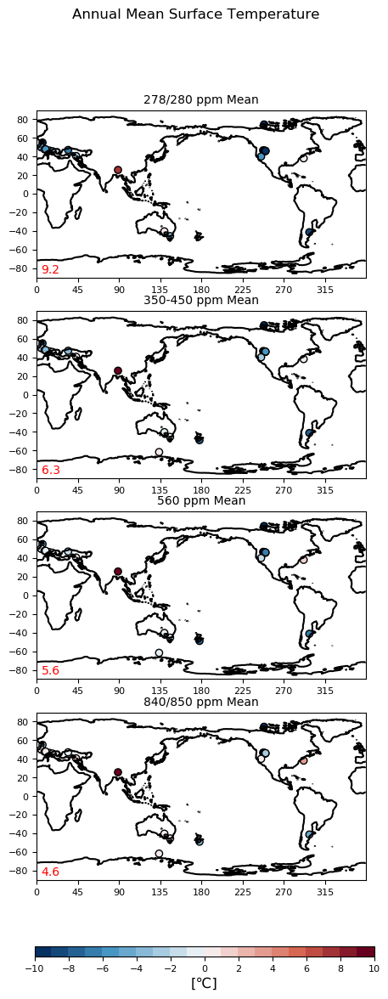

In [176]:
  
ncols = 1
nrows = 4

# set contour levels
contour_levels = np.linspace(-10,10,21)
contour_levels

ytick_levels = np.linspace(-80,80,9)
xtick_levels = np.linspace(0,360,9)

# create the plots
fig = plt.figure(figsize=(5, 12), dpi=100) #figsize(weight,height)

# Use IPPC colormap
rgb_data_in_the_txt_file = np.loadtxt("temp_div_disc_21.txt")
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap',rgb_data_in_the_txt_file/255)
norm2 = mcolors.BoundaryNorm(boundaries=contour_levels, ncolors=256)

for i in range(0, 4): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            if i == 0:
                cf=plt.scatter(MCOMIOMATLon, MCOMIOMATLat, c=LTSbias_MCO_MIO_EXPS_278and280_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('278/280 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels) 
                ax.text(5, -85, np.around(MCO_MIO_LTSbias_EXPS_278and280_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 1:
                cf=plt.scatter(MCOMIOMATLon, MCOMIOMATLat, c=LTSbias_MCO_MIO_EXPS_350and450_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('350-450 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MCO_MIO_LTSbias_EXPS_350and450_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 2:
                cf=plt.scatter(MCOMIOMATLon, MCOMIOMATLat, c=LTSbias_MCO_MIO_EXPS_560_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('560 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)
                ax.text(5, -85, np.around(MCO_MIO_LTSbias_EXPS_560_MEAN_rmse, decimals=1), fontsize=10, color='red')
            elif i == 3:
                cf=plt.scatter(MCOMIOMATLon, MCOMIOMATLat, c=LTSbias_MCO_MIO_EXPS_840and850_MEAN, vmin=-10, vmax=10, marker='o', edgecolors='k', norm=norm2, cmap=my_colormap, alpha=1)
                ax.set_title('840/850 ppm Mean', fontsize=10)
                ax.set_xticks(xtick_levels)
                ax.set_yticks(ytick_levels)    
                ax.text(5, -85, np.around(MCO_MIO_LTSbias_EXPS_840and850_MEAN_rmse, decimals=1), fontsize=10, color='red')
            else:
                 continue
                
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.contour(Herold_updated.topo.lon,Herold_updated.topo.lat,Herold_updated.topo, levels=[0], colors='k', linestyles='-')
            
# make an axes to put the shared colorbar in
colorbar_axes = plt.gcf().add_axes([0.12, 0.05, 0.8, 0.01])
colorbar = plt.colorbar(cf, colorbar_axes, orientation='horizontal')
colorbar.set_label('%s' % '[\u2103]',size=12)


# limit the colorbar to 21 tick marks
 
colorbar.locator = matplotlib.ticker.MaxNLocator(21/2)
colorbar.update_ticks()
colorbar.ax.tick_params(labelsize=8)

# set a global title for the postage stamps with the date formated by "monthname year"
plt.suptitle('Annual Mean Surface Temperature')
   
plt.savefig('MCOMioceneLSTbias_ByCO2_SurfaceTemp.pdf', format='pdf')      